In [1]:
#import required libraries
import pandas as pd
import yfinance as yf
import numpy as np
import math
#import pandas_ta as ta
import hvplot.pandas
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 500)

In [2]:
# Initial imports
import os
import pandas as pd
from dotenv import load_dotenv
import nltk as nltk
nltk.download('vader_lexicon')
from nltk.sentiment.vader import SentimentIntensityAnalyzer
analyzer = SentimentIntensityAnalyzer()
import json
from pandas.io.json import json_normalize

%matplotlib inline

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\akkrishn\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [3]:
# parameter setup (default values in the original indicator)
length = 20
mult = 2
length_KC = 21
mult_KC = 2

In [4]:
value = input("Enter Stock Symbol:")
stock = yf.Ticker(value)
print(stock.info)

Enter Stock Symbol: spy


{'exchange': 'PCX', 'shortName': 'SPDR S&P 500', 'longName': 'SPDR S&P 500 ETF Trust', 'exchangeTimezoneName': 'America/New_York', 'exchangeTimezoneShortName': 'EDT', 'isEsgPopulated': False, 'gmtOffSetMilliseconds': '-14400000', 'quoteType': 'ETF', 'symbol': 'SPY', 'messageBoardId': 'finmb_6160262', 'market': 'us_market', 'annualHoldingsTurnover': None, 'enterpriseToRevenue': None, 'beta3Year': 1, 'profitMargins': None, 'enterpriseToEbitda': None, '52WeekChange': None, 'morningStarRiskRating': None, 'forwardEps': None, 'revenueQuarterlyGrowth': None, 'fundInceptionDate': 727660800, 'annualReportExpenseRatio': None, 'totalAssets': 374031319040, 'bookValue': None, 'fundFamily': 'SPDR State Street Global Advisors', 'lastFiscalYearEnd': None, 'netIncomeToCommon': None, 'trailingEps': None, 'lastDividendValue': None, 'SandP52WeekChange': None, 'priceToBook': None, 'nextFiscalYearEnd': None, 'yield': 0.012999999, 'mostRecentQuarter': None, 'enterpriseValue': None, 'priceHint': 2, 'threeYear

In [5]:
stock_df = stock.history(period="10y", interval='1d')
stock_df.index.duplicated().sum()
df_stock = stock_df.loc[~stock_df.index.duplicated(keep='first')]
df_stock

,Open,High,Low,Close,Volume,Dividends,Stock Splits
Date,,,,,,,
2011-09-29,96.376625,96.854181,93.807678,95.553246,298108900,0.0,0
2011-09-30,94.235810,95.059190,93.099549,93.165421,288392300,0.0,0
2011-10-03,92.621980,93.824113,90.415322,90.514130,365136800,0.0,0
2011-10-04,89.213198,92.696097,88.455690,92.498482,459177500,0.0,0
2011-10-05,92.729033,94.458129,91.872717,94.211113,284108000,0.0,0
...,...,...,...,...,...,...,...
2021-09-23,439.850006,444.890015,439.600006,443.179993,76396000,0.0,0
2021-09-24,441.440002,444.670013,441.209991,443.910004,62025800,0.0,0
2021-09-27,442.809998,444.049988,441.899994,442.640015,61371100,0.0,0


In [6]:
# calculate Bollinger Bands
# moving average
#m_avg = df_stock['Close'].rolling(window=length).mean()
m_avg = df_stock['Close'].ewm(span=length).mean()
df_stock['Moving average'] = m_avg
# standard deviation
m_std = df_stock['Close'].rolling(window=length).std()
# upper Bollinger Bands
df_stock['upper_BB'] = m_avg + mult * m_std
# lower Bollinger Bands 
df_stock['lower_BB'] = m_avg - mult * m_std

In [7]:
#Stacked Moving averages
m_avg_08 = df_stock['Close'].ewm(span=8).mean()
m_avg_21 = df_stock['Close'].ewm(span=21).mean()
m_avg_34 = df_stock['Close'].ewm(span=34).mean()
m_avg_55 = df_stock['Close'].ewm(span=55).mean()
m_avg_89 = df_stock['Close'].ewm(span=89).mean()

df_stock['m_avg_08'] = m_avg_08
df_stock['m_avg_21'] = m_avg_21
df_stock['m_avg_34'] = m_avg_34
df_stock['m_avg_55'] = m_avg_55
df_stock['m_avg_89'] = m_avg_89

In [8]:
# calculate Keltner Channel
# first we need to calculate True Range
df_stock['tr0'] = abs(df_stock["High"] - df_stock["Low"])
df_stock['tr1'] = abs(df_stock["High"] - df_stock["Close"].shift())
df_stock['tr2'] = abs(df_stock["Low"] - df_stock["Close"].shift())
df_stock['tr'] = df_stock[['tr0', 'tr1', 'tr2']].max(axis=1)
# moving average of the TR
range_ma = df_stock['tr'].ewm(span=length_KC).mean()
# upper Keltner Channel
df_stock['upper_KC'] = m_avg + range_ma * mult_KC
# lower Keltner Channel
df_stock['lower_KC'] = m_avg - range_ma * mult_KC

In [9]:
#ADX Calculations

plus_dm = df_stock["High"].diff()
minus_dm = df_stock["Low"].diff()
plus_dm[plus_dm < 0] = 0
minus_dm[minus_dm > 0] = 0

df_stock['atr'] = df_stock['tr'].ewm(span=14).mean()
df_stock['plus_di'] = 100 * (plus_dm.ewm(alpha = 1/14).mean() / df_stock['atr'])
df_stock['minus_di'] = abs(100 * (minus_dm.ewm(alpha = 1/14).mean() / df_stock['atr']))
dx = (abs(df_stock['plus_di'] - df_stock['minus_di']) / abs(df_stock['plus_di'] + df_stock['minus_di'])) * 100
adx = ((dx.shift(1) * (14 - 1)) + dx) / 14
df_stock['adx'] = adx.ewm(alpha = 1/14).mean()

In [10]:
# check for 'squeeze'
df_stock['squeeze_on'] = (df_stock['lower_BB'] > df_stock['lower_KC']) & (df_stock['upper_BB'] < df_stock['upper_KC'])
df_stock['squeeze_off'] = (df_stock['lower_BB'] < df_stock['lower_KC']) & (df_stock['upper_BB'] > df_stock['upper_KC'])

In [11]:
# Momentum
highest = df_stock['High'].rolling(window = length_KC).max()
lowest = df_stock['Low'].rolling(window = length_KC).min()
m1 = (highest + lowest) / 2
df_stock['value'] = (df_stock['Close'] - (m1 + m_avg)/2)
fit_y = np.array(range(0,length_KC))
df_stock['value'] = df_stock['value'].rolling(window = length_KC).apply(lambda x : np.polyfit(fit_y, x, 1)[0] * (length_KC-1) +
   np.polyfit(fit_y, x, 1)[1], raw=True)

df_stock[['squeeze_on', 'squeeze_off']] = (df_stock[['squeeze_on', 'squeeze_off']] == True).astype(float)

df_stock["pct_change"] = df_stock['Close'].pct_change()*100

"""
conditions = [
    (df_stock['pct_change'] > 0) | (df_stock['squeeze_on'] == 1),
    (df_stock['pct_change'] < 0) | (df_stock['squeeze_on'] == 0)
]
"""
conditions =  [
    (df_stock['pct_change'] > 0),
    (df_stock['pct_change'] < 0)
]

label = [1, 0]
df_stock['profitable?'] = np.select(conditions, label) 
df_stock.dropna(inplace=True)
df_stock.tail(100)

,Open,High,Low,Close,Volume,Dividends,Stock Splits,Moving average,upper_BB,lower_BB,m_avg_08,m_avg_21,m_avg_34,m_avg_55,m_avg_89,tr0,tr1,tr2,tr,upper_KC,lower_KC,atr,plus_di,minus_di,adx,squeeze_on,squeeze_off,value,pct_change,profitable?
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2021-05-10,419.777439,420.015883,415.117659,415.246826,81852400,0.000,0,412.298790,417.674378,406.923203,415.478912,411.968628,407.598495,401.072157,391.662162,4.898224,0.616011,4.282213,4.898224,420.194655,404.402926,3.993393,28.046148,20.842481,24.685346,1.0,0.0,3.724906,-0.990235,0
2021-05-11,410.438030,412.594030,407.417611,411.540863,116888000,0.000,0,412.226607,417.447392,407.005822,414.603790,411.929740,407.823774,401.446040,392.103911,5.176419,2.652796,7.829215,7.829215,420.828159,403.625055,4.504836,23.086156,29.365642,23.960500,1.0,0.0,2.236861,-0.892472,0
2021-05-12,408.580081,409.931302,401.396659,402.797577,134811000,0.000,0,411.328604,418.192791,404.464417,411.980187,411.099544,407.536562,401.494309,392.341548,8.534643,1.609561,10.144204,10.144204,420.992598,401.664610,5.256752,18.370817,31.548970,23.177778,1.0,0.0,-0.253253,-2.124524,0
2021-05-13,404.446863,409.692838,404.397167,407.636169,106394000,0.000,0,410.976944,418.327448,403.626439,411.014850,410.784692,407.542254,401.713661,392.681428,5.295671,6.895261,1.599590,6.895261,421.016076,400.937811,5.475220,16.377956,28.126548,23.407841,1.0,0.0,-1.768981,1.201247,1
2021-05-14,410.547290,414.799708,410.517484,413.895569,82201600,0.000,0,411.254908,418.585649,403.924166,411.655010,411.067499,407.905301,402.148729,393.152854,4.282224,7.163539,2.881315,7.163539,421.683854,400.825962,5.700329,21.006744,25.086113,23.531939,1.0,0.0,-1.710820,1.535536,1
2021-05-17,412.713270,413.706826,410.696322,412.842407,65129200,0.000,0,411.406098,418.732275,404.079922,411.918876,411.228854,408.187421,402.530646,393.590399,3.010504,0.188742,3.199246,3.199246,421.468639,401.343557,5.366851,20.718314,24.741672,22.483252,1.0,0.0,-1.679889,-0.254451,0
2021-05-18,413.120604,413.378938,409.116574,409.285492,59810200,0.000,0,411.204136,418.555266,403.853006,411.333679,411.052185,408.250168,402.771891,393.939179,4.262364,0.536531,3.725833,4.262364,421.126876,401.281396,5.219586,19.781226,25.784449,21.531536,1.0,0.0,-2.339772,-0.861567,0
2021-05-19,404.297850,408.401211,402.718069,408.212433,106467100,0.000,0,410.919212,418.599566,403.238857,410.640069,410.794025,408.248012,402.966196,394.256363,5.683142,0.884281,6.567423,6.567423,421.133961,400.704462,5.399298,17.756907,31.610520,21.010588,1.0,0.0,-3.305768,-0.262179,0
2021-05-20,409.146387,413.945280,409.017250,412.603973,78022200,0.000,0,411.079665,418.601994,403.557337,411.076492,410.958566,408.496924,403.310402,394.664087,4.928030,5.732847,0.804818,5.732847,421.408137,400.751193,5.443771,23.628312,29.112827,21.424160,1.0,0.0,-3.036746,1.075798,1


In [12]:
# entry point for long position:
# 1. black cross becomes gray (the squeeze is released)
long_cond1 = (df_stock['squeeze_off'][-2] == 0) | (df_stock['squeeze_off'][-1] == 1) 
# 2. bar value is positive => the bar is light green
long_cond2 = df_stock['value'][-1] > 0

enter_long = long_cond1 and long_cond2
# entry point for short position:
# 1. black cross becomes gray (the squeeze is released)
short_cond1 = (df_stock['squeeze_off'][-2] == 0) | (df_stock['squeeze_off'][-1] == 1) 
# 2. bar value is negative => the bar is light red 
short_cond2 = df_stock['value'][-1] < 0
enter_short = short_cond1 and short_cond2

In [13]:
import mplfinance as mpf
%matplotlib widget

In [14]:
ohcl = df_stock[['Open', 'High', 'Close', 'Low']]
ohcl.head()

,Open,High,Close,Low
Date,,,,
2011-11-25,95.824928,96.911789,95.791992,95.676720
2011-11-28,98.426799,98.953762,98.566772,97.833965
2011-11-29,98.846741,99.628949,98.846741,98.484452
2011-11-30,101.679168,103.103618,102.914238,98.805575
2011-12-01,102.798974,103.449444,102.897781,102.453155


In [15]:
# add colors for the 'value bar'
colors = []
for ind, val in enumerate(df_stock['value']):
  if val >= 0:
    color = 'blue'
    if val > df_stock['value'][ind-1]:
      color = 'cyan'
  else:
    color = 'yellow'
    if val < df_stock['value'][ind-1]:
      color='red'
  colors.append(color)

In [16]:
len(colors)

2477

In [17]:
df_stock['colors'] = colors

In [18]:
df_stock.head()

,Open,High,Low,Close,Volume,Dividends,Stock Splits,Moving average,upper_BB,lower_BB,m_avg_08,m_avg_21,m_avg_34,m_avg_55,m_avg_89,tr0,tr1,tr2,tr,upper_KC,lower_KC,atr,plus_di,minus_di,adx,squeeze_on,squeeze_off,value,pct_change,profitable?,colors
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2011-11-25,95.824928,96.911789,95.676720,95.791992,99557000,0.0,0,100.451479,106.171824,94.731135,98.723223,100.496235,100.691838,100.619849,100.478763,1.235070,0.938629,0.296440,1.235070,104.495725,96.407234,1.939691,19.285027,37.760281,17.509442,0.0,1.0,-4.376582,-0.188769,0,yellow
2011-11-28,98.426799,98.953762,97.833965,98.566772,210686000,0.0,0,100.269261,105.809490,94.729031,98.688455,100.317567,100.559201,100.526193,100.409209,1.119797,3.161770,2.041973,3.161770,104.524569,96.013953,2.103036,23.737158,32.214555,18.537215,0.0,1.0,-4.233141,2.896672,1,yellow
2011-11-29,98.846741,99.628949,98.484452,98.846741,199241500,0.0,0,100.131926,105.703271,94.560581,98.723631,100.181598,100.452878,100.450332,100.353164,1.144497,1.062177,0.082321,1.144497,104.205461,96.058391,1.974958,25.942656,31.739345,18.255852,0.0,1.0,-3.933370,0.284039,1,yellow
2011-11-30,101.679168,103.103618,98.805575,102.914238,324439500,0.0,0,100.400189,106.014209,94.786170,99.654891,100.433826,100.604947,100.560584,100.443792,4.298043,4.256877,0.041166,4.298043,104.891165,95.909214,2.285275,32.077894,25.385800,17.650908,0.0,1.0,-3.061359,4.114953,1,yellow
2011-12-01,102.798974,103.449444,102.453155,102.897781,176954800,0.0,0,100.640717,106.290625,94.990810,100.375542,100.660938,100.745950,100.664230,100.529503,0.996289,0.535206,0.461082,0.996289,104.901406,96.380028,2.113135,33.329840,25.414565,17.213217,0.0,1.0,-2.464503,-0.015991,0,yellow


In [19]:
# add 2 subplots: 1. bars, 2. crosses
apds = [mpf.make_addplot(df_stock['value'], panel=1, type='bar', color=colors, alpha=0.8, secondary_y=False),
        mpf.make_addplot([0] * len(df_stock), panel=1, type='scatter', marker='o', markersize=50, color=['gray' if s else 'red' for s in df_stock['squeeze_off']], secondary_y=False),
        mpf.make_addplot(df_stock[['upper_BB']], color = 'red'),
        mpf.make_addplot(df_stock[['lower_BB']], color = 'red'),
        mpf.make_addplot(df_stock[['upper_KC']], color = 'blue'),
        mpf.make_addplot(df_stock[['lower_KC']], color = 'blue'),
        mpf.make_addplot(df_stock['Moving average'], color = 'black'),
        mpf.make_addplot(df_stock['m_avg_08'], color = 'green'),
        mpf.make_addplot(df_stock['m_avg_34'], color = 'orange'),
        mpf.make_addplot(df_stock[['adx']], panel=2, color = 'purple', secondary_y=False),
        mpf.make_addplot(df_stock[['plus_di']], panel=2, color = 'green', secondary_y=False),
        mpf.make_addplot(df_stock[['minus_di']], panel=2, color = 'orange', secondary_y=False),
        mpf.make_addplot(df_stock['m_avg_08'], panel=3, color='red', secondary_y=False),
        mpf.make_addplot(df_stock['m_avg_21'], panel=3, color='orange', secondary_y=False),
        mpf.make_addplot(df_stock['m_avg_34'], panel=3, color='yellow', secondary_y=False),
        mpf.make_addplot(df_stock['m_avg_55'], panel=3, color='green', secondary_y=False),
        mpf.make_addplot(df_stock['m_avg_89'], panel=3, color='blue', secondary_y=False)]

# plot ohcl with subplots
fig, axes = mpf.plot(ohcl, 
              volume_panel = 2,
              figratio=(2,1),
              figscale=1,
              type='candle', 
              addplot=apds,
              returnfig=True)


Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

In [20]:
def stochastics( dataframe, low, high, close, k, d ):
    """
    Fast stochastic calculation
    %K = (Current Close - Lowest Low)/
    (Highest High - Lowest Low) * 100
    %D = 3-day SMA of %K

    Slow stochastic calculation
    %K = %D of fast stochastic
    %D = 3-day SMA of %K

    When %K crosses above %D, buy signal 
    When the %K crosses below %D, sell signal
    """

    df = dataframe.copy()

    # Set minimum low and maximum high of the k stoch
    low_min  = df[low].rolling( window = k ).min()
    high_max = df[high].rolling( window = k ).max()

    # Fast Stochastic
    df['k_fast'] = 100 * (df[close] - low_min)/(high_max - low_min)
    df['d_fast'] = df['k_fast'].rolling(window = d).mean()

    # Slow Stochastic
    df['k_slow'] = df["d_fast"]
    df['d_slow'] = df['k_slow'].rolling(window = d).mean()

    return df


stochs = stochastics( df_stock, 'Low', 'High', 'Close', 14, 3 )
slow_k = stochs['k_slow'].values
fast_k = stochs['k_fast'].values
df_stock["slow_K"] = slow_k
df_stock['fast_K'] = fast_k
df_stock

,Open,High,Low,Close,Volume,Dividends,Stock Splits,Moving average,upper_BB,lower_BB,m_avg_08,m_avg_21,m_avg_34,m_avg_55,m_avg_89,tr0,tr1,tr2,tr,upper_KC,lower_KC,atr,plus_di,minus_di,adx,squeeze_on,squeeze_off,value,pct_change,profitable?,colors,slow_K,fast_K
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2011-11-25,95.824928,96.911789,95.676720,95.791992,99557000,0.0,0,100.451479,106.171824,94.731135,98.723223,100.496235,100.691838,100.619849,100.478763,1.235070,0.938629,0.296440,1.235070,104.495725,96.407234,1.939691,19.285027,37.760281,17.509442,0.0,1.0,-4.376582,-0.188769,0,yellow,NaN,NaN
2011-11-28,98.426799,98.953762,97.833965,98.566772,210686000,0.0,0,100.269261,105.809490,94.729031,98.688455,100.317567,100.559201,100.526193,100.409209,1.119797,3.161770,2.041973,3.161770,104.524569,96.013953,2.103036,23.737158,32.214555,18.537215,0.0,1.0,-4.233141,2.896672,1,yellow,NaN,NaN
2011-11-29,98.846741,99.628949,98.484452,98.846741,199241500,0.0,0,100.131926,105.703271,94.560581,98.723631,100.181598,100.452878,100.450332,100.353164,1.144497,1.062177,0.082321,1.144497,104.205461,96.058391,1.974958,25.942656,31.739345,18.255852,0.0,1.0,-3.933370,0.284039,1,yellow,NaN,NaN
2011-11-30,101.679168,103.103618,98.805575,102.914238,324439500,0.0,0,100.400189,106.014209,94.786170,99.654891,100.433826,100.604947,100.560584,100.443792,4.298043,4.256877,0.041166,4.298043,104.891165,95.909214,2.285275,32.077894,25.385800,17.650908,0.0,1.0,-3.061359,4.114953,1,yellow,NaN,NaN
2011-12-01,102.798974,103.449444,102.453155,102.897781,176954800,0.0,0,100.640717,106.290625,94.990810,100.375542,100.660938,100.745950,100.664230,100.529503,0.996289,0.535206,0.461082,0.996289,104.901406,96.380028,2.113135,33.329840,25.414565,17.213217,0.0,1.0,-2.464503,-0.015991,0,yellow,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-09-23,439.850006,444.890015,439.600006,443.179993,76396000,0.0,0,442.883697,453.788387,431.979007,440.740741,442.915933,442.243650,439.132384,432.417211,5.290009,7.030029,1.740021,7.030029,452.839647,432.927747,5.519391,17.332404,23.259687,20.497732,0.0,1.0,-4.553976,1.215002,1,yellow,39.802093,61.402878
2021-09-24,441.440002,444.670013,441.209991,443.910004,62025800,0.0,0,442.981441,453.905427,432.057455,441.445022,443.006303,442.338870,439.303013,432.672606,3.460022,1.490021,1.970001,3.460022,452.661399,433.301482,5.244809,16.936968,22.729020,20.076613,0.0,1.0,-4.128095,0.164721,1,yellow,55.396885,66.877112
2021-09-27,442.809998,444.049988,441.899994,442.640015,61371100,0.0,0,442.948924,453.819313,432.078535,441.710576,442.973004,442.356079,439.422192,432.894104,2.149994,0.139984,2.010010,2.149994,452.139794,433.758054,4.832167,17.070204,22.907820,19.685574,0.0,1.0,-4.139322,-0.286092,0,red,63.390530,61.891601


In [21]:
import pandas as pd 
import matplotlib.pyplot as plt
import requests
import numpy as np
from math import floor
from termcolor import colored as cl 

plt.style.use('fivethirtyeight')
plt.rcParams['figure.figsize'] = (20, 10)

In [22]:
def get_rsi(close, lookback):
    ret = close.diff()
    up = []
    down = []
    for i in range(len(ret)):
        if ret[i] < 0:
            up.append(0)
            down.append(ret[i])
        else:
            up.append(ret[i])
            down.append(0)
    up_series = pd.Series(up)
    down_series = pd.Series(down).abs()
    up_ewm = up_series.ewm(com = lookback - 1, adjust = False).mean()
    down_ewm = down_series.ewm(com = lookback - 1, adjust = False).mean()
    rs = up_ewm/down_ewm
    rsi = 100 - (100 / (1 + rs))
    rsi_df = pd.DataFrame(rsi).rename(columns = {0:'rsi'}).set_index(close.index)
    rsi_df = rsi_df.dropna()
    return rsi_df[3:]

df_stock['rsi_14'] = get_rsi(df_stock['Close'], 14)
df_stock = df_stock.dropna()
df_stock['Overbought'] = 70
df_stock['Oversold'] = 30
df_stock

,Open,High,Low,Close,Volume,Dividends,Stock Splits,Moving average,upper_BB,lower_BB,m_avg_08,m_avg_21,m_avg_34,m_avg_55,m_avg_89,tr0,tr1,tr2,tr,upper_KC,lower_KC,atr,plus_di,minus_di,adx,squeeze_on,squeeze_off,value,pct_change,profitable?,colors,slow_K,fast_K,rsi_14,Overbought,Oversold
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2011-12-16,101.280006,101.876594,100.509406,100.749695,220481400,0.77,0,101.547221,106.735817,96.358624,101.414923,101.542491,101.440126,101.259286,101.066787,1.367188,1.276038,0.091150,1.367188,105.329458,97.764984,1.819276,23.821980,24.789141,12.643095,0.0,1.0,2.209904,0.148249,1,cyan,41.954716,35.962778,80.616541,70,30
2011-12-19,101.139146,101.354584,99.457085,99.672523,183903000,0.00,0,101.368082,106.582458,96.153705,101.027723,101.371748,101.335462,101.194460,101.023887,1.897499,0.604890,1.292610,1.897499,105.151484,97.584680,1.829708,21.967185,27.032910,11.912319,0.0,1.0,1.889356,-1.069156,0,blue,30.092193,14.502974,76.644620,70,30
2011-12-20,101.238568,102.862627,99.738801,102.688622,225418100,0.00,0,101.494227,106.646636,96.341819,101.396812,101.491941,101.415420,101.255191,101.074675,3.123826,3.190104,0.066278,3.190104,105.514645,97.473810,2.011140,23.972318,22.811364,11.757354,0.0,1.0,2.053387,3.026007,1,cyan,37.045989,60.672213,79.665632,70,30
2011-12-21,102.688619,103.044918,101.710869,102.887482,194230900,0.00,0,101.627281,106.645340,96.609222,101.728072,101.619268,101.502235,101.321210,101.129526,1.334049,0.356297,0.977753,1.334049,105.524315,97.730248,1.920841,23.968951,22.154231,11.092477,0.0,1.0,2.073535,0.193654,1,cyan,46.527002,64.405820,79.850692,70,30
2011-12-22,103.268638,103.906665,102.937202,103.798943,119465400,0.00,0,101.834617,106.287406,97.381828,102.188266,101.818074,101.637436,101.420953,101.209653,0.969463,1.019183,0.049721,1.019183,105.562124,98.107110,1.800598,27.182039,21.923987,10.609180,0.0,1.0,2.149517,0.885881,1,cyan,68.865522,81.518532,80.716922,70,30
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-09-23,439.850006,444.890015,439.600006,443.179993,76396000,0.00,0,442.883697,453.788387,431.979007,440.740741,442.915933,442.243650,439.132384,432.417211,5.290009,7.030029,1.740021,7.030029,452.839647,432.927747,5.519391,17.332404,23.259687,20.497732,0.0,1.0,-4.553976,1.215002,1,yellow,39.802093,61.402878,50.538170,70,30
2021-09-24,441.440002,444.670013,441.209991,443.910004,62025800,0.00,0,442.981441,453.905427,432.057455,441.445022,443.006303,442.338870,439.303013,432.672606,3.460022,1.490021,1.970001,3.460022,452.661399,433.301482,5.244809,16.936968,22.729020,20.076613,0.0,1.0,-4.128095,0.164721,1,yellow,55.396885,66.877112,51.576119,70,30
2021-09-27,442.809998,444.049988,441.899994,442.640015,61371100,0.00,0,442.948924,453.819313,432.078535,441.710576,442.973004,442.356079,439.422192,432.894104,2.149994,0.139984,2.010010,2.149994,452.139794,433.758054,4.832167,17.070204,22.907820,19.685574,0.0,1.0,-4.139322,-0.286092,0,red,63.390530,61.891601,49.625096,70,30


In [23]:
apds2 = [mpf.make_addplot(df_stock['value'], panel=1, type='bar', color=colors, alpha=0.8, secondary_y=False),
         mpf.make_addplot([0] * len(df_stock), panel=1, type='scatter', marker='o', markersize=50, color=['gray' if s else 'red' for s in df_stock['squeeze_off']], secondary_y=False),
         mpf.make_addplot(df_stock[['upper_BB']], color = 'red'),
         mpf.make_addplot(df_stock[['lower_BB']], color = 'red'),
         mpf.make_addplot(df_stock[['upper_KC']], color = 'blue'),
         mpf.make_addplot(df_stock[['lower_KC']], color = 'blue'),
         mpf.make_addplot(df_stock['Moving average'], color = 'black'),
         mpf.make_addplot(df_stock['m_avg_08'], color = 'green'),
         mpf.make_addplot(df_stock['m_avg_34'], color = 'orange'),
         mpf.make_addplot(df_stock['slow_K'], panel=2, color = 'red'),
         mpf.make_addplot(df_stock['fast_K'], panel=2, color = 'blue'),
         mpf.make_addplot(df_stock['Overbought'], panel=2, color = 'green'),
         mpf.make_addplot(df_stock['Oversold'], panel=2, color = 'red'),
         mpf.make_addplot(df_stock['Overbought'], panel=3, color = 'green'),
         mpf.make_addplot(df_stock['Oversold'], panel=3, color = 'red'),
         mpf.make_addplot(df_stock['rsi_14'], panel=3, color='purple')]
fig, axes = mpf.plot(df_stock, 
              volume_panel = 2,
              figratio=(2,1),
              figscale=1,
              type='candle', 
              addplot=apds2,
              returnfig=True)

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

In [24]:
for i in range(2,df_stock.shape[0]):
    current = df_stock.iloc[i,:]
    prev = df_stock.iloc[i-1,:]
    prev_2 = df_stock.iloc[i-2,:]
    realbody = abs(current['Open'] - current['Close'])
    candle_range = current['High'] - current['Low']
    idx = df_stock.index[i]  
# Bullish swing
    df_stock.loc[idx,'Bullish swing'] = current['Low'] > prev['Low'] and prev['Low'] < prev_2['Low']
# Bearish swing
    df_stock.loc[idx,'Bearish swing'] = current['High'] < prev['High'] and prev['High'] > prev_2['High']
# Bullish pinbar
    df_stock.loc[idx,'Bullish pinbar'] = realbody <= candle_range/3 and  min(current['Open'], current['Close']) > (current['High'] + current['Low'])/2 and current['Low'] < prev['Low']
# Bearish pinbar
    df_stock.loc[idx,'Bearish pinbar'] = realbody <= candle_range/3 and max(current['Open'] , current['Close']) < (current['High'] + current['Low'])/2 and current['High'] > prev['High']
    
  # Inside bar
    df_stock.loc[idx,'Inside bar'] = current['High'] < prev['High'] and current['Low'] > prev['Low']
    
  # Outside bar
    df_stock.loc[idx,'Outside bar'] = current['High'] > prev['High'] and current['Low'] < prev['Low']
  
  # Bullish engulfing
    df_stock.loc[idx,'Bullish engulfing'] = current['High'] > prev['High'] and current['Low'] < prev['Low'] and realbody >= 0.8 * candle_range and current['Close'] > current['Open']
# Bearish engulfing
    df_stock.loc[idx,'Bearish engulfing'] = current['High'] > prev['High'] and current['Low'] < prev['Low'] and realbody >= 0.8 * candle_range and current['Close'] < current['Open']

df_stock.fillna(False, inplace=True)

In [25]:
df_stock

,Open,High,Low,Close,Volume,Dividends,Stock Splits,Moving average,upper_BB,lower_BB,m_avg_08,m_avg_21,m_avg_34,m_avg_55,m_avg_89,tr0,tr1,tr2,tr,upper_KC,lower_KC,atr,plus_di,minus_di,adx,squeeze_on,squeeze_off,value,pct_change,profitable?,colors,slow_K,fast_K,rsi_14,Overbought,Oversold,Bullish swing,Bearish swing,Bullish pinbar,Bearish pinbar,Inside bar,Outside bar,Bullish engulfing,Bearish engulfing
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2011-12-16,101.280006,101.876594,100.509406,100.749695,220481400,0.77,0,101.547221,106.735817,96.358624,101.414923,101.542491,101.440126,101.259286,101.066787,1.367188,1.276038,0.091150,1.367188,105.329458,97.764984,1.819276,23.821980,24.789141,12.643095,0.0,1.0,2.209904,0.148249,1,cyan,41.954716,35.962778,80.616541,70,30,False,False,False,False,False,False,False,False
2011-12-19,101.139146,101.354584,99.457085,99.672523,183903000,0.00,0,101.368082,106.582458,96.153705,101.027723,101.371748,101.335462,101.194460,101.023887,1.897499,0.604890,1.292610,1.897499,105.151484,97.584680,1.829708,21.967185,27.032910,11.912319,0.0,1.0,1.889356,-1.069156,0,blue,30.092193,14.502974,76.644620,70,30,False,False,False,False,False,False,False,False
2011-12-20,101.238568,102.862627,99.738801,102.688622,225418100,0.00,0,101.494227,106.646636,96.341819,101.396812,101.491941,101.415420,101.255191,101.074675,3.123826,3.190104,0.066278,3.190104,105.514645,97.473810,2.011140,23.972318,22.811364,11.757354,0.0,1.0,2.053387,3.026007,1,cyan,37.045989,60.672213,79.665632,70,30,True,False,False,False,False,False,False,False
2011-12-21,102.688619,103.044918,101.710869,102.887482,194230900,0.00,0,101.627281,106.645340,96.609222,101.728072,101.619268,101.502235,101.321210,101.129526,1.334049,0.356297,0.977753,1.334049,105.524315,97.730248,1.920841,23.968951,22.154231,11.092477,0.0,1.0,2.073535,0.193654,1,cyan,46.527002,64.405820,79.850692,70,30,False,False,False,False,False,False,False,False
2011-12-22,103.268638,103.906665,102.937202,103.798943,119465400,0.00,0,101.834617,106.287406,97.381828,102.188266,101.818074,101.637436,101.420953,101.209653,0.969463,1.019183,0.049721,1.019183,105.562124,98.107110,1.800598,27.182039,21.923987,10.609180,0.0,1.0,2.149517,0.885881,1,cyan,68.865522,81.518532,80.716922,70,30,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-09-23,439.850006,444.890015,439.600006,443.179993,76396000,0.00,0,442.883697,453.788387,431.979007,440.740741,442.915933,442.243650,439.132384,432.417211,5.290009,7.030029,1.740021,7.030029,452.839647,432.927747,5.519391,17.332404,23.259687,20.497732,0.0,1.0,-4.553976,1.215002,1,yellow,39.802093,61.402878,50.538170,70,30,False,False,False,False,False,False,False,False
2021-09-24,441.440002,444.670013,441.209991,443.910004,62025800,0.00,0,442.981441,453.905427,432.057455,441.445022,443.006303,442.338870,439.303013,432.672606,3.460022,1.490021,1.970001,3.460022,452.661399,433.301482,5.244809,16.936968,22.729020,20.076613,0.0,1.0,-4.128095,0.164721,1,yellow,55.396885,66.877112,51.576119,70,30,False,True,False,False,True,False,False,False
2021-09-27,442.809998,444.049988,441.899994,442.640015,61371100,0.00,0,442.948924,453.819313,432.078535,441.710576,442.973004,442.356079,439.422192,432.894104,2.149994,0.139984,2.010010,2.149994,452.139794,433.758054,4.832167,17.070204,22.907820,19.685574,0.0,1.0,-4.139322,-0.286092,0,red,63.390530,61.891601,49.625096,70,30,False,False,False,False,True,False,False,False


In [26]:
columns = ['Bullish swing', 'Bearish swing', 'Bullish pinbar', 'Bearish pinbar', 'Inside bar', 'Outside bar', 'Bullish engulfing','Bearish engulfing']


def convert(df):
    patterns = []
    for i in columns:
        if df[i]:
            patterns.append(i)
    #df['patterns'] = patterns
    if not patterns:
        patterns.append('No pattern')
    return patterns

In [27]:
#df_stock_dow.apply(convert, axis=1)
df_stock['pattern'] = df_stock.apply(convert, axis = 1)

In [28]:
df_stock['pattern'].value_counts()

TypeError: unhashable type: 'list'

Exception ignored in: 'pandas._libs.index.IndexEngine._call_map_locations'
Traceback (most recent call last):
  File "pandas\_libs\hashtable_class_helper.pxi", line 4588, in pandas._libs.hashtable.PyObjectHashTable.map_locations
TypeError: unhashable type: 'list'


[No pattern]                                  968
[Bullish swing]                               386
[Bearish swing]                               323
[Outside bar]                                 143
[Bearish swing, Inside bar]                   112
[Bullish swing, Inside bar]                    93
[Bearish pinbar]                               91
[Bearish swing, Bullish pinbar]                89
[Bullish pinbar]                               78
[Bullish swing, Bearish swing, Inside bar]     52
[Bullish pinbar, Outside bar]                  33
[Bullish swing, Bearish pinbar]                30
[Outside bar, Bearish engulfing]               23
[Outside bar, Bullish engulfing]               15
[Inside bar]                                   14
[Bearish pinbar, Outside bar]                  12
Name: pattern, dtype: int64

In [29]:
df_stock.tail()

,Open,High,Low,Close,Volume,Dividends,Stock Splits,Moving average,upper_BB,lower_BB,m_avg_08,m_avg_21,m_avg_34,m_avg_55,m_avg_89,tr0,tr1,tr2,tr,upper_KC,lower_KC,atr,plus_di,minus_di,adx,squeeze_on,squeeze_off,value,pct_change,profitable?,colors,slow_K,fast_K,rsi_14,Overbought,Oversold,Bullish swing,Bearish swing,Bullish pinbar,Bearish pinbar,Inside bar,Outside bar,Bullish engulfing,Bearish engulfing,pattern
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2021-09-23,439.850006,444.890015,439.600006,443.179993,76396000,0.0,0,442.883697,453.788387,431.979007,440.740741,442.915933,442.243650,439.132384,432.417211,5.290009,7.030029,1.740021,7.030029,452.839647,432.927747,5.519391,17.332404,23.259687,20.497732,0.0,1.0,-4.553976,1.215002,1,yellow,39.802093,61.402878,50.538170,70,30,False,False,False,False,False,False,False,False,[No pattern]
2021-09-24,441.440002,444.670013,441.209991,443.910004,62025800,0.0,0,442.981441,453.905427,432.057455,441.445022,443.006303,442.338870,439.303013,432.672606,3.460022,1.490021,1.970001,3.460022,452.661399,433.301482,5.244809,16.936968,22.729020,20.076613,0.0,1.0,-4.128095,0.164721,1,yellow,55.396885,66.877112,51.576119,70,30,False,True,False,False,True,False,False,False,"[Bearish swing, Inside bar]"
2021-09-27,442.809998,444.049988,441.899994,442.640015,61371100,0.0,0,442.948924,453.819313,432.078535,441.710576,442.973004,442.356079,439.422192,432.894104,2.149994,0.139984,2.010010,2.149994,452.139794,433.758054,4.832167,17.070204,22.907820,19.685574,0.0,1.0,-4.139322,-0.286092,0,red,63.390530,61.891601,49.625096,70,30,False,False,False,False,True,False,False,False,[Inside bar]
2021-09-28,439.690002,440.040009,432.940002,433.720001,129900300,0.0,0,442.069979,453.719786,430.420172,439.934893,442.131822,441.862589,439.218542,432.912458,7.100006,2.600006,9.700012,9.700012,452.188954,431.951004,5.481213,13.973953,30.428959,19.437039,0.0,1.0,-5.304931,-2.015185,0,red,50.198993,21.828267,38.584806,70,30,False,False,False,False,False,False,False,False,[No pattern]
2021-09-29,435.190002,437.040009,434.029999,434.950012,34233954,0.0,0,441.391887,453.407584,429.376190,438.827141,441.478930,441.467584,439.066095,432.957737,3.010010,3.320007,0.309998,3.320007,451.194593,431.589181,5.193052,13.695837,29.823348,20.695707,0.0,1.0,-5.913581,0.283596,1,red,37.487470,28.742541,40.548922,70,30,True,False,False,False,True,False,False,False,"[Bullish swing, Inside bar]"


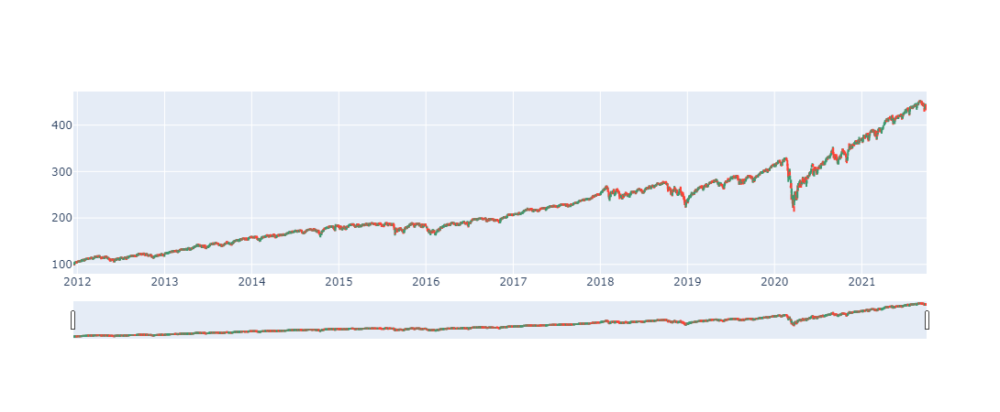

In [30]:
import plotly.graph_objects as go
fig = go.Figure(data=[go.Candlestick(x=df_stock.index,
                open=df_stock['Open'],
                high=df_stock['High'],
                low=df_stock['Low'],
                close=df_stock['Close'])])
fig.update_traces(text=df_stock['pattern'], selector=dict(type='candlestick'))
fig.show()

In [31]:
pattern_dict = {
    'Bullish swing': 'upswing pattern',
    'Bearish swing': 'downward pattern',
    'Bullish pinbar': 'upswing hammer',
    'Bearish pinbar': 'downswing hammer',
    'Inside bar': 'trend change',
    'Outside bar': 'trend change',
    'Bullish engulfing': 'upswing from downtrend',
    'Bearish engulfing': 'downswing from uptrend',
    'No pattern': 'No pattern detected'
    }

In [32]:
today = df_stock['pattern'][-1]
for i in today:
    print(f'Todays pattern is {i}, {pattern_dict[i]}')

Todays pattern is Bullish swing, upswing pattern
Todays pattern is Inside bar, trend change


In [33]:
import datetime
today_date = datetime.date.today()
today_date = str(today_date)
today_date
#& df_stock['squeeze_on'] == df_stock['squeeze_threshold']
#df_stock["value"] > df_stock['value_threshold']

'2021-09-29'

In [34]:
#checks the momentum based on the EMA's stacking
#If smaller EMA's stack above the larger, the momentum is positive, vice versa, negative
def momentum_checker(index):
    if (df_stock['m_avg_08'][index] > df_stock['m_avg_21'][index] > df_stock['m_avg_34'][index] > df_stock['m_avg_55'][index] > df_stock['m_avg_89'][index]):
        print('Positive momentum')
    elif (df_stock['m_avg_08'][index] < df_stock['m_avg_21'][index] < df_stock['m_avg_34'][index] < df_stock['m_avg_55'][index] < df_stock['m_avg_89'][index]):
        print('Negative momentum')
    else:
        print('neutral')

In [35]:
df_stock['ADX_trend'] = 20

def ADX_trend_flag(index):
    if (df_stock['adx'][index] > df_stock['ADX_trend'][index]) and (df_stock['plus_di'][index] > df_stock['minus_di'][index]):
        print('positive trend')
    elif (df_stock['adx'][index] > df_stock['ADX_trend'][index]) and (df_stock['plus_di'][index] < df_stock['minus_di'][index]):
        print('negative trend')
    elif (df_stock['adx'][index] < df_stock['ADX_trend'][index]):
        print('neutral or sideways trend')

In [36]:
momentum_checker(-1)

neutral


In [37]:
df_stock.shape

(2462, 46)

In [38]:
ADX_trend_flag(-1)

negative trend


In [39]:
def warning(index):
    if (df_stock['m_avg_08'][index] < df_stock['m_avg_21'][index]):
        print('Warning, stock maybe heading down, consider puts on pullback to the 8 EMA, and hold off on long positions.  Watch ADX for negative trend. If this happens with any of the market indices such as SPY, QQQ, or DJI, hold of on long positions.  Watch the chart for the 8 crossing the 34.')
    if (df_stock['m_avg_08'][index] < df_stock['m_avg_34'][index]):
        print('8 EMA has crossed 34 to the downside.  As long as there is tension in the news, you can short or buy puts on any price moves back to the 8 or the 21 ema')
    elif (df_stock['m_avg_08'][index] > df_stock['m_avg_21'][index]):
        print('Continue as normal and watch for bearish candle patterns, especially when market is overbought and at the top bollinger')

In [40]:
warning(-1)

Warning, stock maybe heading down, consider puts on pullback to the 8 EMA, and hold off on long positions.  Watch ADX for negative trend. If this happens with any of the market indices such as SPY, QQQ, or DJI, hold of on long positions.  Watch the chart for the 8 crossing the 34.
8 EMA has crossed 34 to the downside.  As long as there is tension in the news, you can short or buy puts on any price moves back to the 8 or the 21 ema


In [41]:
def squeeze_momentum(index):
    if (df_stock['squeeze_on'][index] == 1.0):
        print('squeeze is on')
    else:
        print('squeeze is off')
    
    if (df_stock['colors'][index] == 'cyan'):
        print('stock is in a mark up mode')
    elif (df_stock['colors'][index] == 'blue'):
        print('stock is in a distribution mode')
    elif (df_stock['colors'][index] == 'yellow'):
        print('stock is in an accumulation mode')
    elif (df_stock['colors'][index] == 'red'):
        print('stock is in a mark down mode')

In [42]:
squeeze_momentum(-1)

squeeze is off
stock is in a mark down mode


In [43]:
df = yf.download(value,'2021-03-04', '2021-09-30')

[*********************100%***********************]  1 of 1 completed


In [44]:
fig, ax = plt.subplots()
ax.plot(df.Close, color='black')

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

In [45]:
# Define minimum and maximum price points
price_min = df.Close.min()
price_max = df.Close.max()

In [46]:
# Fibonacci Levels considering original trend as upward move
diff = price_max - price_min
level1 = price_max - 0.236 * diff
level2 = price_max - 0.382 * diff
level3 = price_max - 0.500 * diff
level4 = price_max - 0.618 * diff

In [47]:
ax.axhspan(level1, price_min, alpha=0.4, color='lightsalmon')
ax.axhspan(level2, level1, alpha=0.5, color='palegoldenrod')
ax.axhspan(level3, level2, alpha=0.5, color='palegreen')
ax.axhspan(level4, level3, alpha=0.5, color='red')
ax.axhspan(price_max, level4, alpha=0.5, color='powderblue')

plt.ylabel("Price")
plt.xlabel("Date")
plt.legend()
plt.show()

No handles with labels found to put in legend.


In [48]:
# To get the entry and exit signals for the algo trading using squeeze and momentum
df_stock['value_threshold'] = abs(df_stock['value'].min()*.05)
df_stock['squeeze_threshold'] = 1.0
df_stock["squeeze_entry"] = np.logical_and(np.greater(df_stock["value"], df_stock['value_threshold']), 
                                           np.equal(df_stock['squeeze_on'], df_stock['squeeze_threshold']))
df_stock['squeeze_entry'] = df_stock['squeeze_entry'].astype(float)
df_stock['Entry/Exit'] = df_stock['squeeze_entry'].diff()
df_stock_clean = df_stock.dropna()


In [49]:
df_stock.shape

(2462, 50)

In [50]:
len(colors)

2477

In [51]:
def implement_bb_strategy(data, squeeze_on, squeeze_value, upper_kc, threshold, color):
    buy_price = []
    sell_price = []
    squeeze_signal = []
    signal = 0.0
    buy_close = 0
    buy = False

    
    for close, squeeze, value, kc, thresh, color  in zip(data, squeeze_on, squeeze_value, upper_kc, threshold, color):
        if squeeze == 1.0 and value < thresh and (color == 'yellow' or color == 'cyan'):
            if signal != 1:
                buy_price.append(close)
                buy = True
                sell_price.append(np.nan)
                buy_close = close
                signal = 1.0
                squeeze_signal.append(signal)
            else:
                buy_price.append(np.nan)
                sell_price.append(np.nan)
                squeeze_signal.append(0)
        elif buy and close >= (buy_close*1.15):
            if signal != -1:
                buy_price.append(np.nan)
                sell_price.append(close)
                signal = -1
                buy = False
                squeeze_signal.append(signal)
            else:
                buy_price.append(np.nan)
                sell_price.append(np.nan)
                squeeze_signal.append(0)
        else:
            buy_price.append(np.nan)
            sell_price.append(np.nan)
            squeeze_signal.append(0)
            
    return buy_price, sell_price, squeeze_signal


In [52]:
buy_price, sell_price, squeeze_signal = implement_bb_strategy(df_stock["Close"], df_stock['squeeze_on'], df_stock['value'], 
                                                              df_stock['upper_KC'], df_stock['value_threshold'], df_stock['colors'])

In [53]:
df_stock['buy_price'] =  buy_price
df_stock['sell_price'] = sell_price
df_stock['squeeze_signal'] = squeeze_signal

In [54]:
df_stock['squeeze_on'][20]

0.0

In [55]:
# #from math import isclose

# #def discretionary(row):
#     #for row in df_stock.values:
#         i#f row[32] == 1:
#             temp_close = row[3]
#             val = 1
#         elif row[32] == 0:
#             try:
#                 if np.logical_and(np.greater((row[19]-temp_close), row[35]), row[32]):
#                     val = -1
#                 else:
#                     val = 0
#             except:
#                 val = 0
#     return val

# df_stock['discretionary_exit'] = df_stock.apply(discretionary, axis = 1)

In [56]:
df_stock

,Open,High,Low,Close,Volume,Dividends,Stock Splits,Moving average,upper_BB,lower_BB,m_avg_08,m_avg_21,m_avg_34,m_avg_55,m_avg_89,tr0,tr1,tr2,tr,upper_KC,lower_KC,atr,plus_di,minus_di,adx,squeeze_on,squeeze_off,value,pct_change,profitable?,colors,slow_K,fast_K,rsi_14,Overbought,Oversold,Bullish swing,Bearish swing,Bullish pinbar,Bearish pinbar,Inside bar,Outside bar,Bullish engulfing,Bearish engulfing,pattern,ADX_trend,value_threshold,squeeze_threshold,squeeze_entry,Entry/Exit,buy_price,sell_price,squeeze_signal
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2011-12-16,101.280006,101.876594,100.509406,100.749695,220481400,0.77,0,101.547221,106.735817,96.358624,101.414923,101.542491,101.440126,101.259286,101.066787,1.367188,1.276038,0.091150,1.367188,105.329458,97.764984,1.819276,23.821980,24.789141,12.643095,0.0,1.0,2.209904,0.148249,1,cyan,41.954716,35.962778,80.616541,70,30,False,False,False,False,False,False,False,False,[No pattern],20,2.296209,1.0,0.0,NaN,NaN,NaN,0.0
2011-12-19,101.139146,101.354584,99.457085,99.672523,183903000,0.00,0,101.368082,106.582458,96.153705,101.027723,101.371748,101.335462,101.194460,101.023887,1.897499,0.604890,1.292610,1.897499,105.151484,97.584680,1.829708,21.967185,27.032910,11.912319,0.0,1.0,1.889356,-1.069156,0,blue,30.092193,14.502974,76.644620,70,30,False,False,False,False,False,False,False,False,[No pattern],20,2.296209,1.0,0.0,0.0,NaN,NaN,0.0
2011-12-20,101.238568,102.862627,99.738801,102.688622,225418100,0.00,0,101.494227,106.646636,96.341819,101.396812,101.491941,101.415420,101.255191,101.074675,3.123826,3.190104,0.066278,3.190104,105.514645,97.473810,2.011140,23.972318,22.811364,11.757354,0.0,1.0,2.053387,3.026007,1,cyan,37.045989,60.672213,79.665632,70,30,True,False,False,False,False,False,False,False,[Bullish swing],20,2.296209,1.0,0.0,0.0,NaN,NaN,0.0
2011-12-21,102.688619,103.044918,101.710869,102.887482,194230900,0.00,0,101.627281,106.645340,96.609222,101.728072,101.619268,101.502235,101.321210,101.129526,1.334049,0.356297,0.977753,1.334049,105.524315,97.730248,1.920841,23.968951,22.154231,11.092477,0.0,1.0,2.073535,0.193654,1,cyan,46.527002,64.405820,79.850692,70,30,False,False,False,False,False,False,False,False,[No pattern],20,2.296209,1.0,0.0,0.0,NaN,NaN,0.0
2011-12-22,103.268638,103.906665,102.937202,103.798943,119465400,0.00,0,101.834617,106.287406,97.381828,102.188266,101.818074,101.637436,101.420953,101.209653,0.969463,1.019183,0.049721,1.019183,105.562124,98.107110,1.800598,27.182039,21.923987,10.609180,0.0,1.0,2.149517,0.885881,1,cyan,68.865522,81.518532,80.716922,70,30,False,False,False,False,False,False,False,False,[No pattern],20,2.296209,1.0,0.0,0.0,NaN,NaN,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-09-23,439.850006,444.890015,439.600006,443.179993,76396000,0.00,0,442.883697,453.788387,431.979007,440.740741,442.915933,442.243650,439.132384,432.417211,5.290009,7.030029,1.740021,7.030029,452.839647,432.927747,5.519391,17.332404,23.259687,20.497732,0.0,1.0,-4.553976,1.215002,1,yellow,39.802093,61.402878,50.538170,70,30,False,False,False,False,False,False,False,False,[No pattern],20,2.296209,1.0,0.0,0.0,NaN,NaN,0.0
2021-09-24,441.440002,444.670013,441.209991,443.910004,62025800,0.00,0,442.981441,453.905427,432.057455,441.445022,443.006303,442.338870,439.303013,432.672606,3.460022,1.490021,1.970001,3.460022,452.661399,433.301482,5.244809,16.936968,22.729020,20.076613,0.0,1.0,-4.128095,0.164721,1,yellow,55.396885,66.877112,51.576119,70,30,False,True,False,False,True,False,False,False,"[Bearish swing, Inside bar]",20,2.296209,1.0,0.0,0.0,NaN,NaN,0.0
2021-09-27,442.809998,444.049988,441.899994,442.640015,61371100,0.00,0,442.948924,453.819313,432.078535,441.710576,442.973004,442.356079,439.422192,432.894104,2.149994,0.139984,2.010010,2.149994,452.139794,433.758054,4.832167,17.070204,22.

In [57]:
# Visualize exit position relative to close price
exit = df_stock[df_stock['squeeze_signal'] == -1.0]['Close'].hvplot.scatter(
    color='red',
    marker='v',
    size=200,
    legend=False,
    ylabel='Price in $',
    width=1000,
    height=400
)

# Visualize entry position relative to close price
entry = df_stock[df_stock['squeeze_signal'] == 1.0]['Close'].hvplot.scatter(
    color='green',
    marker='^',
    size=200,
    legend=False,
    ylabel='Price in $',
    width=1000,
    height=400
)

# Visualize close price for the investment
security_close = df_stock[['Close']].hvplot(
    line_color='lightgray',
    ylabel='Price in $',
    width=1000,
    height=400
)

entry_exit_plot = security_close * entry * exit
entry_exit_plot

:Overlay
   .Curve.I          :Curve   [Date]   (Close)
   .Scatter.Close.I  :Scatter   [Date]   (Close)
   .Scatter.Close.II :Scatter   [Date]   (Close)

In [58]:
position = []
for i in range(len(squeeze_signal)):
    if df_stock['squeeze_signal'][i] < 1:
        position.append(0)
    else:
        position.append(1)

        
for i in range(len(df_stock['Close'])):
    if df_stock['squeeze_signal'][i] == 1:
        position[i] = 1
    elif df_stock['squeeze_signal'][i] == -1:
        position[i] = 0
    else:
        position[i] = position[i-1]
        
#upper_bb = tsla['upper_bb']
#lower_bb = tsla['lower_bb']
close_price = df_stock['Close']
squeeze_signal = pd.DataFrame(squeeze_signal).rename(columns = {0:'squeeze_signal'}).set_index(df_stock.index)
position = pd.DataFrame(position).rename(columns = {0:'squeeze_position'}).set_index(df_stock.index)

frames = [close_price, squeeze_signal, position]
strategy = pd.concat(frames, join = 'inner', axis = 1)
strategy = strategy.reset_index()

strategy

,Date,Close,squeeze_signal,squeeze_position
0,2011-12-16,100.749695,0.0,0
1,2011-12-19,99.672523,0.0,0
2,2011-12-20,102.688622,0.0,0
3,2011-12-21,102.887482,0.0,0
4,2011-12-22,103.798943,0.0,0
...,...,...,...,...
2457,2021-09-23,443.179993,0.0,0
2458,2021-09-24,443.910004,0.0,0
2459,2021-09-27,442.640015,0.0,0
2460,2021-09-28,433.720001,0.0,0


In [59]:
stock_ret = pd.DataFrame(np.diff(df_stock['Close'])).rename(columns = {0:'returns'})
squeeze_strategy_ret = []
return_sum = 0

for i in range(len(stock_ret)):
    try:
        returns = stock_ret['returns'][i]*strategy['squeeze_position'][i]
        squeeze_strategy_ret.append(returns)
    except:
        pass
    
squeeze_strategy_ret_df = pd.DataFrame(squeeze_strategy_ret).rename(columns = {0:'squeeze_returns'})

investment_value = 100000
number_of_stocks = math.floor(investment_value/df_stock['Close'][-1])
squeeze_investment_ret = []

for i in range(len(squeeze_strategy_ret_df['squeeze_returns'])):
    #df_stock_wk['cumluative_return'] = np.exp(np.log1p(df_stock_wk['pct_change']).cumsum())
    returns = (number_of_stocks*squeeze_strategy_ret_df['squeeze_returns'][i])
    squeeze_investment_ret.append(returns)
    return_sum += returns
    new_investment_value = return_sum + investment_value
    number_of_stocks = math.floor(new_investment_value/df_stock['Close'][i-1])
    
squeeze_investment_ret_df = pd.DataFrame(squeeze_investment_ret).rename(columns = {0:'investment_returns'})
total_investment_ret = round(sum(squeeze_investment_ret_df['investment_returns']), 2)
profit_percentage = math.floor((total_investment_ret/investment_value)*100)
print(f'Profit gained from the Squeeze strategy by investing $100k in {value} is {total_investment_ret}')
print(f'Profit percentage of the Squeeze strategy : {profit_percentage}%')
print(return_sum)


Profit gained from the Squeeze strategy by investing $100k in spy is 263375.03
Profit percentage of the Squeeze strategy : 263%
263375.0282821655


In [60]:
import pandas as pd
import numpy as np
from scipy import stats, signal
import plotly.express as px
import plotly.graph_objects as go

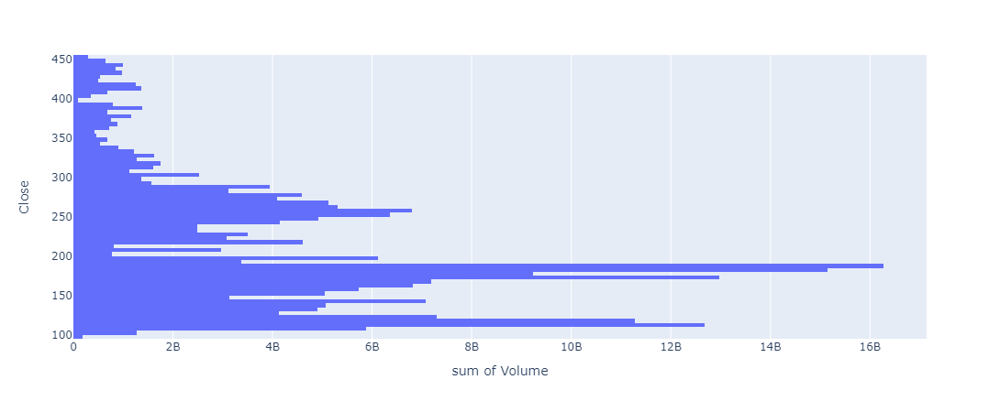

In [61]:
px.histogram(df_stock, x='Volume', y='Close', nbins=150, orientation='h').show()

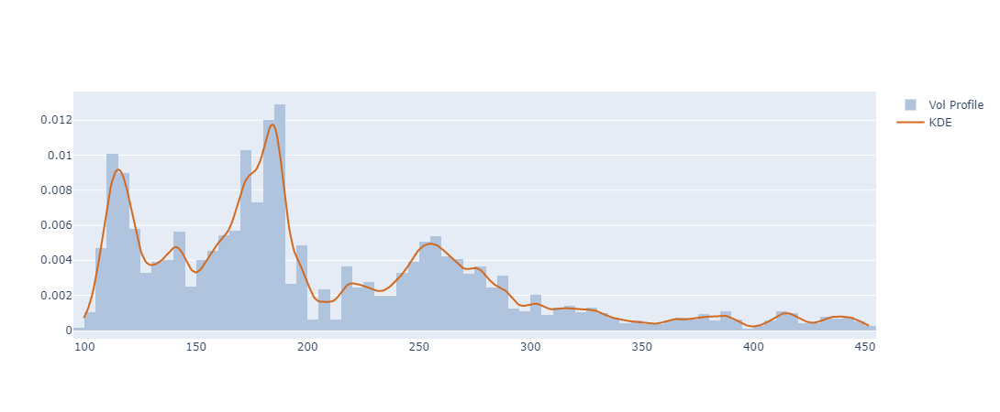

In [64]:
kde_factor = 0.05
num_samples = 500
close = df_stock['Close']
volume = df_stock['Volume']
kde = stats.gaussian_kde(close,weights=volume,bw_method=kde_factor)
xr = np.linspace(close.min(),close.max(),num_samples)
kdy = kde(xr)
ticks_per_sample = (xr.max() - xr.min()) / num_samples

def get_dist_plot(c, v, kx, ky):
    fig = go.Figure()
    fig.add_trace(go.Histogram(name='Vol Profile', x=c, y=v, nbinsx=150, 
                               histfunc='sum', histnorm='probability density',
                               marker_color='#B0C4DE'))
    fig.add_trace(go.Scatter(name='KDE', x=kx, y=ky, mode='lines', marker_color='#D2691E'))
    return fig

get_dist_plot(close, volume, xr, kdy).show()

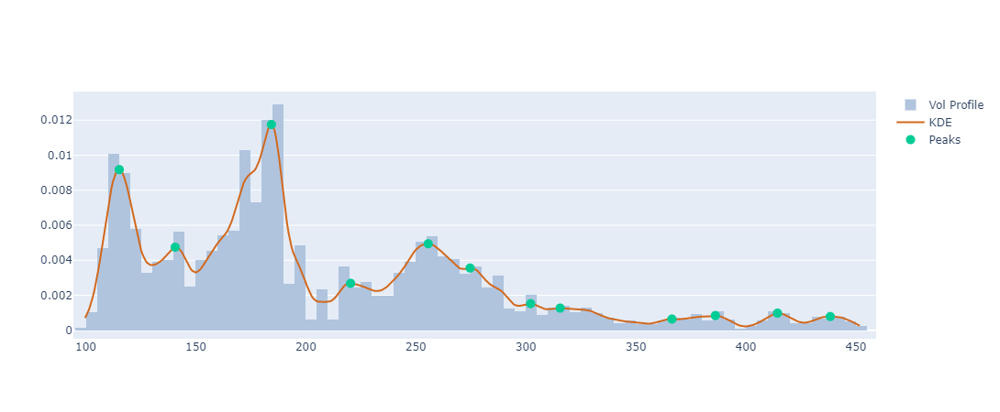

In [66]:
peaks,_ = signal.find_peaks(kdy)
pkx = xr[peaks]
pky = kdy[peaks]

pk_marker_args=dict(size=10)
rgs=dict(size=10)
fig = get_dist_plot(close, volume, xr, kdy)
fig.add_trace(go.Scatter(name="Peaks", x=pkx, y=pky, mode='markers', marker=pk_marker_args))

In [184]:
df_stock.columns

Index(['Open', 'High', 'Low', 'Close', 'Volume', 'Dividends', 'Stock Splits',
       'Moving average', 'upper_BB', 'lower_BB', 'm_avg_08', 'm_avg_21',
       'm_avg_34', 'm_avg_55', 'm_avg_89', 'tr0', 'tr1', 'tr2', 'tr',
       'upper_KC', 'lower_KC', 'atr', 'plus_di', 'minus_di', 'adx',
       'squeeze_on', 'squeeze_off', 'value', 'pct_change', 'profitable?',
       'colors', 'slow_K', 'fast_K', 'rsi_14', 'Overbought', 'Oversold',
       'Bullish swing', 'Bearish swing', 'Bullish pinbar', 'Bearish pinbar',
       'Inside bar', 'Outside bar', 'Bullish engulfing', 'Bearish engulfing',
       'pattern', 'ADX_trend', 'value_threshold', 'squeeze_threshold',
       'squeeze_entry', 'Entry/Exit', 'buy_price', 'sell_price',
       'squeeze_signal'],
      dtype='object')

In [185]:
# Set x variable list of features
x_var_list = ['Open', 'High', 'Low', 'Close', 'Moving average', 'upper_BB', 'lower_BB', 'm_avg_08', 'pct_change', 'squeeze_on', 'upper_KC', 'lower_KC', 'squeeze_signal']

# Filter by x-variable list
df_stock[x_var_list]

,Open,High,Low,Close,Moving average,upper_BB,lower_BB,m_avg_08,pct_change,squeeze_on,upper_KC,lower_KC,squeeze_signal
Date,,,,,,,,,,,,,
2011-12-16,101.280006,101.876594,100.509406,100.749695,101.547221,106.735817,96.358624,101.414923,0.148249,0.0,105.329458,97.764984,0.0
2011-12-19,101.139146,101.354584,99.457085,99.672523,101.368082,106.582458,96.153705,101.027723,-1.069156,0.0,105.151484,97.584680,0.0
2011-12-20,101.238568,102.862627,99.738801,102.688622,101.494227,106.646636,96.341819,101.396812,3.026007,0.0,105.514645,97.473810,0.0
2011-12-21,102.688619,103.044918,101.710869,102.887482,101.627281,106.645340,96.609222,101.728072,0.193654,0.0,105.524315,97.730248,0.0
2011-12-22,103.268638,103.906665,102.937202,103.798943,101.834617,106.287406,97.381828,102.188266,0.885881,0.0,105.562124,98.107110,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-09-23,439.850006,444.890015,439.600006,443.179993,442.883697,453.788387,431.979007,440.740741,1.215002,0.0,452.839647,432.927747,0.0
2021-09-24,441.440002,444.670013,441.209991,443.910004,442.981441,453.905427,432.057455,441.445022,0.164721,0.0,452.661399,433.301482,0.0
2021-09-27,442.809998,444.049988,441.899994,442.640015,442.948924,453.819313,432.078535,441.710576,-0.286092,0.0,452.139794,433.758054,0.0


In [186]:
# Shift DataFrame values by 1
df_stock[x_var_list] = df_stock[x_var_list].shift(1)
df_stock[x_var_list].tail()

,Open,High,Low,Close,Moving average,upper_BB,lower_BB,m_avg_08,pct_change,squeeze_on,upper_KC,lower_KC,squeeze_signal
Date,,,,,,,,,,,,,
2021-09-23,436.049988,440.029999,433.750000,437.859985,442.852508,453.735914,431.969103,440.043812,0.975481,0.0,452.398047,433.306969,0.0
2021-09-24,439.850006,444.890015,439.600006,443.179993,442.883697,453.788387,431.979007,440.740741,1.215002,0.0,452.839647,432.927747,0.0
2021-09-27,441.440002,444.670013,441.209991,443.910004,442.981441,453.905427,432.057455,441.445022,0.164721,0.0,452.661399,433.301482,0.0
2021-09-28,442.809998,444.049988,441.899994,442.640015,442.948924,453.819313,432.078535,441.710576,-0.286092,0.0,452.139794,433.758054,0.0
2021-09-29,439.690002,440.040009,432.940002,433.720001,442.069979,453.719786,430.420172,439.934893,-2.015185,0.0,452.188954,431.951004,0.0


In [187]:
# Drop NAs
df_stock = df_stock.dropna(subset=x_var_list)
df_stock = df_stock.dropna(subset=["pct_change"])

# Replace positive/negative infinity values
df_stock = df_stock.replace([np.inf, -np.inf], np.nan)

# Display sample data
df_stock.head()

,Open,High,Low,Close,Volume,Dividends,Stock Splits,Moving average,upper_BB,lower_BB,m_avg_08,m_avg_21,m_avg_34,m_avg_55,m_avg_89,tr0,tr1,tr2,tr,upper_KC,lower_KC,atr,plus_di,minus_di,adx,squeeze_on,squeeze_off,value,pct_change,profitable?,colors,slow_K,fast_K,rsi_14,Overbought,Oversold,Bullish swing,Bearish swing,Bullish pinbar,Bearish pinbar,Inside bar,Outside bar,Bullish engulfing,Bearish engulfing,pattern,ADX_trend,value_threshold,squeeze_threshold,squeeze_entry,Entry/Exit,buy_price,sell_price,squeeze_signal
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2011-12-19,101.280006,101.876594,100.509406,100.749695,183903000,0.0,0,101.547221,106.735817,96.358624,101.414923,101.371748,101.335462,101.194460,101.023887,1.897499,0.604890,1.292610,1.897499,105.329458,97.764984,1.829708,21.967185,27.032910,11.912319,0.0,1.0,1.889356,0.148249,0,blue,30.092193,14.502974,76.644620,70,30,False,False,False,False,False,False,False,False,[No pattern],20,2.296209,1.0,0.0,0.0,NaN,NaN,0.0
2011-12-20,101.139146,101.354584,99.457085,99.672523,225418100,0.0,0,101.368082,106.582458,96.153705,101.027723,101.491941,101.415420,101.255191,101.074675,3.123826,3.190104,0.066278,3.190104,105.151484,97.584680,2.011140,23.972318,22.811364,11.757354,0.0,1.0,2.053387,-1.069156,1,cyan,37.045989,60.672213,79.665632,70,30,True,False,False,False,False,False,False,False,[Bullish swing],20,2.296209,1.0,0.0,0.0,NaN,NaN,0.0
2011-12-21,101.238568,102.862627,99.738801,102.688622,194230900,0.0,0,101.494227,106.646636,96.341819,101.396812,101.619268,101.502235,101.321210,101.129526,1.334049,0.356297,0.977753,1.334049,105.514645,97.473810,1.920841,23.968951,22.154231,11.092477,0.0,1.0,2.073535,3.026007,1,cyan,46.527002,64.405820,79.850692,70,30,False,False,False,False,False,False,False,False,[No pattern],20,2.296209,1.0,0.0,0.0,NaN,NaN,0.0
2011-12-22,102.688619,103.044918,101.710869,102.887482,119465400,0.0,0,101.627281,106.645340,96.609222,101.728072,101.818074,101.637436,101.420953,101.209653,0.969463,1.019183,0.049721,1.019183,105.524315,97.730248,1.800598,27.182039,21.923987,10.609180,0.0,1.0,2.149517,0.193654,1,cyan,68.865522,81.518532,80.716922,70,30,False,False,False,False,False,False,False,False,[No pattern],20,2.296209,1.0,0.0,0.0,NaN,NaN,0.0
2011-12-23,103.268638,103.906665,102.937202,103.798943,92187200,0.0,0,101.834617,106.287406,97.381828,102.188266,102.083312,101.818996,101.553437,101.314413,0.845171,0.961184,0.116013,0.961184,105.562124,98.107110,1.688658,30.541958,21.687703,10.648566,0.0,1.0,2.140147,0.885881,1,blue,81.622287,98.942509,81.584999,70,30,False,False,False,False,False,False,False,False,[No pattern],20,2.296209,1.0,0.0,0.0,NaN,NaN,0.0


In [190]:
# Construct the dependent variable where if hourly return is greater than 0, then 1, else, 0.
df_stock["Positive Return"] = np.where(df_stock["pct_change"] > 0, 1.0, 0.0)

# Display sample data
df_stock

,Open,High,Low,Close,Volume,Dividends,Stock Splits,Moving average,upper_BB,lower_BB,m_avg_08,m_avg_21,m_avg_34,m_avg_55,m_avg_89,tr0,tr1,tr2,tr,upper_KC,lower_KC,atr,plus_di,minus_di,adx,squeeze_on,squeeze_off,value,pct_change,profitable?,colors,slow_K,fast_K,rsi_14,Overbought,Oversold,Bullish swing,Bearish swing,Bullish pinbar,Bearish pinbar,Inside bar,Outside bar,Bullish engulfing,Bearish engulfing,pattern,ADX_trend,value_threshold,squeeze_threshold,squeeze_entry,Entry/Exit,buy_price,sell_price,squeeze_signal,Positive Return
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2011-12-19,101.280006,101.876594,100.509406,100.749695,183903000,0.0,0,101.547221,106.735817,96.358624,101.414923,101.371748,101.335462,101.194460,101.023887,1.897499,0.604890,1.292610,1.897499,105.329458,97.764984,1.829708,21.967185,27.032910,11.912319,0.0,1.0,1.889356,0.148249,0,blue,30.092193,14.502974,76.644620,70,30,False,False,False,False,False,False,False,False,[No pattern],20,2.296209,1.0,0.0,0.0,NaN,NaN,0.0,1.0
2011-12-20,101.139146,101.354584,99.457085,99.672523,225418100,0.0,0,101.368082,106.582458,96.153705,101.027723,101.491941,101.415420,101.255191,101.074675,3.123826,3.190104,0.066278,3.190104,105.151484,97.584680,2.011140,23.972318,22.811364,11.757354,0.0,1.0,2.053387,-1.069156,1,cyan,37.045989,60.672213,79.665632,70,30,True,False,False,False,False,False,False,False,[Bullish swing],20,2.296209,1.0,0.0,0.0,NaN,NaN,0.0,0.0
2011-12-21,101.238568,102.862627,99.738801,102.688622,194230900,0.0,0,101.494227,106.646636,96.341819,101.396812,101.619268,101.502235,101.321210,101.129526,1.334049,0.356297,0.977753,1.334049,105.514645,97.473810,1.920841,23.968951,22.154231,11.092477,0.0,1.0,2.073535,3.026007,1,cyan,46.527002,64.405820,79.850692,70,30,False,False,False,False,False,False,False,False,[No pattern],20,2.296209,1.0,0.0,0.0,NaN,NaN,0.0,1.0
2011-12-22,102.688619,103.044918,101.710869,102.887482,119465400,0.0,0,101.627281,106.645340,96.609222,101.728072,101.818074,101.637436,101.420953,101.209653,0.969463,1.019183,0.049721,1.019183,105.524315,97.730248,1.800598,27.182039,21.923987,10.609180,0.0,1.0,2.149517,0.193654,1,cyan,68.865522,81.518532,80.716922,70,30,False,False,False,False,False,False,False,False,[No pattern],20,2.296209,1.0,0.0,0.0,NaN,NaN,0.0,1.0
2011-12-23,103.268638,103.906665,102.937202,103.798943,92187200,0.0,0,101.834617,106.287406,97.381828,102.188266,102.083312,101.818996,101.553437,101.314413,0.845171,0.961184,0.116013,0.961184,105.562124,98.107110,1.688658,30.541958,21.687703,10.648566,0.0,1.0,2.140147,0.885881,1,blue,81.622287,98.942509,81.584999,70,30,False,False,False,False,False,False,False,False,[No pattern],20,2.296209,1.0,0.0,0.0,NaN,NaN,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-09-23,436.049988,440.029999,433.750000,437.859985,76396000,0.0,0,442.852508,453.735914,431.969103,440.043812,442.915933,442.243650,439.132384,432.417211,5.290009,7.030029,1.740021,7.030029,452.398047,433.306969,5.519391,17.332404,23.259687,20.497732,0.0,1.0,-4.553976,0.975481,1,yellow,39.802093,61.402878,50.538170,70,30,False,False,False,False,False,False,False,False,[No pattern],20,2.296209,1.0,0.0,0.0,NaN,NaN,0.0,1.0
2021-09-24,439.850006,444.890015,439.600006,443.179993,62025800,0.0,0,442.883697,453.788387,431.979007,440.740741,443.006303,442.338870,439.303013,432.672606,3.460022,1.490021,1.970001,3.460022,452.839647,432.927747,5.244809,16.936968,22.729020,20.076613,0.0,1.0,-4.128095,1.215002,1,yellow,55.396885,66.877112,51.576119,70,30,False,True,False,False,True,False,False,False,"[Bearish swing, Inside bar]",20,2.296209,1.0,0.0,0.0,NaN,NaN,0.0,1.0
2021-09-27,441.440002,444.670013,441.209991,443.910004,61371100,0.0,0,442.981441,453.905427,432.057455,441.445022,442.973004,442.356079,439.422192,432.894104,2.149994,0.139984,2.010010,2.149994,452.

In [191]:
# Construct training start and end dates
training_start = df_stock.index.min().strftime(format= "%Y-%m-%d")
training_end = "2019-09-14"

# Construct testing start and end dates
testing_start =  "2019-09-15"
testing_end = df_stock.index.max().strftime(format= "%Y-%m-%d")

# Print training and testing start/end dates
print(f"Training Start: {training_start}")
print(f"Training End: {training_end}")
print(f"Testing Start: {testing_start}")
print(f"Testing End: {testing_end}")

Training Start: 2011-12-19
Training End: 2019-09-14
Testing Start: 2019-09-15
Testing End: 2021-09-29


In [192]:
# Construct the X_train and y_train datasets
X_train = df_stock[x_var_list][training_start:training_end]
y_train = df_stock["Positive Return"][training_start:training_end]

# Display sample data
display(X_train.tail())
display(y_train.tail())

,Open,High,Low,Close,Moving average,upper_BB,lower_BB,m_avg_08,pct_change,squeeze_on,upper_KC,lower_KC,squeeze_signal
Date,,,,,,,,,,,,,
2019-09-09,287.124185,287.692325,286.401969,287.008606,281.418135,288.914019,273.922250,282.944130,0.077223,1.0,288.924634,273.911635,0.0
2019-09-10,288.058225,288.154497,286.151565,287.153046,281.964317,290.146384,273.782249,283.879445,0.050326,0.0,289.152577,274.776057,0.0
2019-09-11,286.344139,287.153046,285.005647,287.085632,282.452061,291.092116,273.812006,284.591931,-0.023476,0.0,289.377279,275.526843,0.0
2019-09-12,287.413017,289.213738,286.719689,289.127075,283.087777,292.528833,273.646720,285.599741,0.711092,0.0,289.836893,276.338661,0.0
2019-09-13,290.090075,291.255242,289.281196,290.128601,283.758331,293.336914,274.179749,286.606154,0.346396,0.0,290.280831,277.235832,0.0


Date
2019-09-09    1.0
2019-09-10    1.0
2019-09-11    0.0
2019-09-12    1.0
2019-09-13    1.0
Name: Positive Return, dtype: float64

In [193]:
# Construct the X test and y test datasets
X_test = df_stock[x_var_list][testing_start:testing_end]
y_test = df_stock["Positive Return"][testing_start:testing_end]

# Display sample data
display(X_test.tail())
display(y_test.tail())

,Open,High,Low,Close,Moving average,upper_BB,lower_BB,m_avg_08,pct_change,squeeze_on,upper_KC,lower_KC,squeeze_signal
Date,,,,,,,,,,,,,
2021-09-23,436.049988,440.029999,433.750000,437.859985,442.852508,453.735914,431.969103,440.043812,0.975481,0.0,452.398047,433.306969,0.0
2021-09-24,439.850006,444.890015,439.600006,443.179993,442.883697,453.788387,431.979007,440.740741,1.215002,0.0,452.839647,432.927747,0.0
2021-09-27,441.440002,444.670013,441.209991,443.910004,442.981441,453.905427,432.057455,441.445022,0.164721,0.0,452.661399,433.301482,0.0
2021-09-28,442.809998,444.049988,441.899994,442.640015,442.948924,453.819313,432.078535,441.710576,-0.286092,0.0,452.139794,433.758054,0.0
2021-09-29,439.690002,440.040009,432.940002,433.720001,442.069979,453.719786,430.420172,439.934893,-2.015185,0.0,452.188954,431.951004,0.0


Date
2021-09-23    1.0
2021-09-24    1.0
2021-09-27    1.0
2021-09-28    0.0
2021-09-29    0.0
Name: Positive Return, dtype: float64

In [194]:
# Import sklearn required libraries
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
%matplotlib inline

In [195]:
# Fit a SKLearn random forest using just the training set (X_train, Y_train):
#from imblearn.ensemble import EasyEnsembleClassifier
#model = EasyEnsembleClassifier(n_estimators = 100, random_state = 1)
model = RandomForestClassifier(n_estimators=100, max_depth=3, random_state=0)
model.fit(X_train, y_train)

# Make a prediction of "y" values from the X_test dataset
predictions = model.predict(X_test)

# Assemble actual y data (Y_test) with predicted y data (from just above) into two columns in a DataFrame
results = y_test.to_frame()
results["Predicted Value"] = predictions

# Display sample data
results

,Positive Return,Predicted Value
Date,,
2019-09-16,0.0,0.0
2019-09-17,0.0,0.0
2019-09-18,1.0,1.0
2019-09-19,1.0,1.0
2019-09-20,0.0,0.0
...,...,...
2021-09-23,1.0,1.0
2021-09-24,1.0,1.0
2021-09-27,1.0,1.0


In [196]:
# Save the pre-trained model
from joblib import dump, load
dump(model, "random_forest_model.joblib")

['random_forest_model.joblib']

In [197]:
results.head()

,Positive Return,Predicted Value
Date,,
2019-09-16,0.0,0.0
2019-09-17,0.0,0.0
2019-09-18,1.0,1.0
2019-09-19,1.0,1.0
2019-09-20,0.0,0.0


In [198]:
y_test.head()

Date
2019-09-16    0.0
2019-09-17    0.0
2019-09-18    1.0
2019-09-19    1.0
2019-09-20    0.0
Name: Positive Return, dtype: float64

In [199]:
# Load the model and make the predictions from the X_test dataset
model = load("random_forest_model.joblib")
predictions = model.predict(X_test)

# Display sample predictions
predictions[:10]

array([0., 0., 1., 1., 0., 0., 0., 0., 1., 0.])

In [200]:
# Add predicted results to DataFrame
results["Predicted Value"] = predictions

# Display sampe data
results.head(10)

,Positive Return,Predicted Value
Date,,
2019-09-16,0.0,0.0
2019-09-17,0.0,0.0
2019-09-18,1.0,1.0
2019-09-19,1.0,1.0
2019-09-20,0.0,0.0
2019-09-23,0.0,0.0
2019-09-24,0.0,0.0
2019-09-25,0.0,0.0
2019-09-26,1.0,1.0


<AxesSubplot:xlabel='Date'>

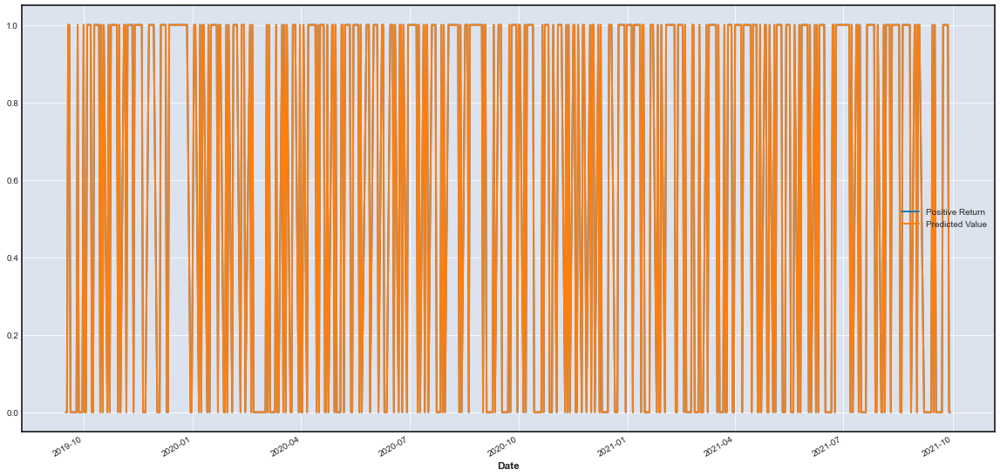

In [201]:
# Plot predicted results vs. actual results
results[["Positive Return", "Predicted Value"]].plot(figsize=(20,10))

<AxesSubplot:xlabel='Date'>

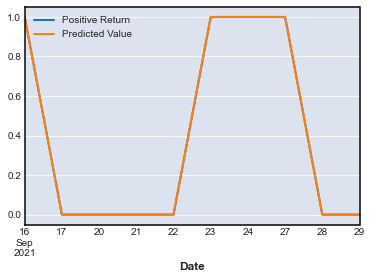

In [202]:
# Plot last 10 records of predicted vs. actual results
results[["Positive Return", "Predicted Value"]].tail(10).plot()

In [203]:
results['Return'] = df_stock['pct_change']
results

,Positive Return,Predicted Value,Return
Date,,,
2019-09-16,0.0,0.0,-0.066383
2019-09-17,0.0,0.0,-0.308885
2019-09-18,1.0,1.0,0.253208
2019-09-19,1.0,1.0,0.059809
2019-09-20,0.0,0.0,-0.006641
...,...,...,...
2021-09-23,1.0,1.0,0.975481
2021-09-24,1.0,1.0,1.215002
2021-09-27,1.0,1.0,0.164721


<AxesSubplot:xlabel='Date'>

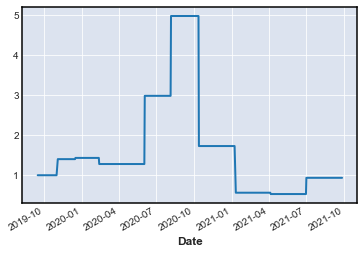

In [83]:
# Calculate cumulative return of the model
cumulative_return = (1 + (results["Return"] * results["Predicted Value"])).cumprod()

# Plotting cumulative returns
cumulative_return.plot()

<AxesSubplot:xlabel='Date'>

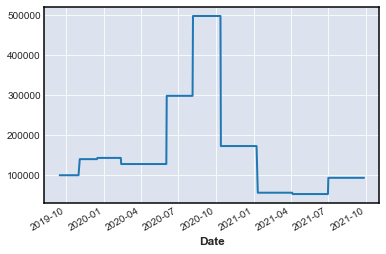

In [84]:
# Set initial capital allocation
initial_capital = 100000

# Plot cumulative return of model in terms of capital
cumulative_return_capital = initial_capital * cumulative_return
cumulative_return_capital.plot()

In [64]:
# Read your api key environment variable
from newsapi import NewsApiClient
load_dotenv()
api_key = os.getenv("NEWSAPI_KEY")

In [65]:
# Create a newsapi client
newsapi = NewsApiClient(api_key=api_key)

In [69]:
# Fetch the Bitcoin news articles
stock_headlines = newsapi.get_everything(q=value,
                                        language="en",
                                        page_size=100,
                                        sort_by='relevancy')
#save json
with open('stock.json', 'w') as json_file:
   json.dump(stock_headlines, json_file)

In [70]:
# Fetch the Bitcoin news articles
stock_headlines = newsapi.get_everything(q='fed',
                                        language="en",
                                        page_size=100,
                                        sort_by='relevancy')
#save json
with open('fed.json', 'w') as json_file:
   json.dump(stock_headlines, json_file)

In [71]:
help(newsapi.get_everything)

Help on method get_everything in module newsapi.newsapi_client:

get_everything(q=None, sources=None, domains=None, exclude_domains=None, from_param=None, to=None, language=None, sort_by=None, page=None, page_size=None) method of newsapi.newsapi_client.NewsApiClient instance
        Search through millions of articles from over 5,000 large and small news sources and blogs.
    
        Optional parameters:
            (str) q - return headlines w/ specified coin! Valid values are:
                        'bitcoin', 'trump', 'tesla', 'ethereum', etc
    
            (str) sources - return headlines of news sources! some Valid values are:
                        'bbc-news', 'the-verge', 'abc-news', 'crypto coins news',
                        'ary news','associated press','wired','aftenposten','australian financial review','axios',
                        'bbc news','bild','blasting news','bloomberg','business insider','engadget','google news',
                        'hacker news','info

In [72]:
# Create the Bitcoin sentiment scores DataFrame
tc = pd.read_json ('stock.json')
#parse the json and load into a dataframe
stock_df = json_normalize(stock_headlines['articles'])
#drop all columns except for description
stock_df = stock_df.drop(['author', 'title', 'url','urlToImage','publishedAt','content','source.id','source.name'], axis=1)
#instantiate vader sentiment 
sentiment_title = stock_df.apply(lambda x : analyzer.polarity_scores(x['description']), axis=1)
#add a column for each sentimement metric
stock_df['Comp'] =sentiment_title.apply(lambda x : x.get('compound') )
stock_df['Pos'] =sentiment_title.apply(lambda x : x.get('pos') )
stock_df['Neu'] =sentiment_title.apply(lambda x : x.get('neu') )
stock_df['Neg'] =sentiment_title.apply(lambda x : x.get('neg') )
stock_df

,description,Comp,Pos,Neu,Neg
0,"From backpacks to boxer briefs, we have the co...",0.5859,0.179,0.821,0.000
1,The chainless Schaeffler Free Drive system wor...,0.8225,0.211,0.789,0.000
2,The Fed is expected to signal that it will slo...,0.4019,0.097,0.903,0.000
3,Workers in China are fed up with the brutal 12...,-0.1027,0.149,0.685,0.165
4,Here’s what you need to know at the end of the...,0.0000,0.000,1.000,0.000
5,One obstacle to Federal Reserve Chair Jerome P...,-0.0516,0.064,0.866,0.070
6,U.S. Federal Reserve Chair Jerome Powell and o...,0.0000,0.000,1.000,0.000
7,U.S. consumer and public interest groups on Mo...,-0.4939,0.066,0.752,0.181
8,omThe U.S. Federal Reserve is likely to announ...,0.3612,0.077,0.923,0.000
9,* Fed expressing growth concern could be gold ...,0.7351,0.470,0.530,0.000


In [75]:
# Create the Bitcoin sentiment scores DataFrame
tc = pd.read_json ('fed.json')
#parse the json and load into a dataframe
fed_df = json_normalize(stock_headlines['articles'])
#drop all columns except for description
fed_df = fed_df.drop(['author', 'title', 'url','urlToImage','publishedAt','content','source.id','source.name'], axis=1)
#instantiate vader sentiment 
sentiment_title = fed_df.apply(lambda x : analyzer.polarity_scores(x['description']), axis=1)
#add a column for each sentimement metric
fed_df['Comp'] =sentiment_title.apply(lambda x : x.get('compound') )
fed_df['Pos'] =sentiment_title.apply(lambda x : x.get('pos') )
fed_df['Neu'] =sentiment_title.apply(lambda x : x.get('neu') )
fed_df['Neg'] =sentiment_title.apply(lambda x : x.get('neg') )
fed_df

,description,Comp,Pos,Neu,Neg
0,"From backpacks to boxer briefs, we have the co...",0.5859,0.179,0.821,0.000
1,The chainless Schaeffler Free Drive system wor...,0.8225,0.211,0.789,0.000
2,The Fed is expected to signal that it will slo...,0.4019,0.097,0.903,0.000
3,Workers in China are fed up with the brutal 12...,-0.1027,0.149,0.685,0.165
4,Here’s what you need to know at the end of the...,0.0000,0.000,1.000,0.000
5,One obstacle to Federal Reserve Chair Jerome P...,-0.0516,0.064,0.866,0.070
6,U.S. Federal Reserve Chair Jerome Powell and o...,0.0000,0.000,1.000,0.000
7,U.S. consumer and public interest groups on Mo...,-0.4939,0.066,0.752,0.181
8,omThe U.S. Federal Reserve is likely to announ...,0.3612,0.077,0.923,0.000
9,* Fed expressing growth concern could be gold ...,0.7351,0.470,0.530,0.000


In [74]:
# Describe the Bitcoin Sentiment
stock_df.describe()

,Comp,Pos,Neu,Neg
count,100.000000,100.000000,100.000000,100.000000
mean,0.113949,0.093960,0.838230,0.067780
std,0.450142,0.088097,0.114135,0.080951
min,-0.888500,0.000000,0.530000,0.000000
25%,-0.115300,0.000000,0.773750,0.000000
50%,0.025800,0.089000,0.849500,0.051000
75%,0.476700,0.143000,0.920000,0.120250
max,0.900100,0.470000,1.000000,0.304000


In [76]:
# Describe the Bitcoin Sentiment
fed_df.describe()

,Comp,Pos,Neu,Neg
count,100.000000,100.000000,100.000000,100.000000
mean,0.113949,0.093960,0.838230,0.067780
std,0.450142,0.088097,0.114135,0.080951
min,-0.888500,0.000000,0.530000,0.000000
25%,-0.115300,0.000000,0.773750,0.000000
50%,0.025800,0.089000,0.849500,0.051000
75%,0.476700,0.143000,0.920000,0.120250
max,0.900100,0.470000,1.000000,0.304000


In [77]:
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer, PorterStemmer
import string
from string import punctuation
import re

In [78]:
# Instantiate the lemmatizer
lemmatizer = WordNetLemmatizer()

# Create a list of stopwords
print(stopwords.words('english'))

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

In [79]:
# Complete the tokenizer function
def tokenizer(text):
    """Tokenizes text."""
    regex = re.compile("[^a-zA-Z ]")
    re_clean = regex.sub('', text)
    # Create a list of the words
    tokens = word_tokenize(re_clean)
    # Convert the words to lowercase
    tokens = [t.lower() for t in tokens]
    # Remove the punctuation
    words = [t.translate(str.maketrans('','',string.punctuation)) for t in tokens]
    # Remove the stop words
    stop_words = set(stopwords.words('english'))
    words = [w for w in words if not w in stop_words]
    # Lemmatize Words into root words
    tokens = ', '.join([lemmatizer.lemmatize(word) for word in words])
    return tokens

In [80]:
# Create a new tokens column for Bitcoin
stock_df['tokens'] = stock_df.apply(lambda x : tokenizer(x['description']), axis=1)
stock_df

,description,Comp,Pos,Neu,Neg,tokens
0,"From backpacks to boxer briefs, we have the co...",0.5859,0.179,0.821,0.000,"backpack, boxer, brief, complete, rundown, eve..."
1,The chainless Schaeffler Free Drive system wor...,0.8225,0.211,0.789,0.000,"chainless, schaeffler, free, drive, system, wo..."
2,The Fed is expected to signal that it will slo...,0.4019,0.097,0.903,0.000,"fed, expected, signal, slow, bondbuying, begin..."
3,Workers in China are fed up with the brutal 12...,-0.1027,0.149,0.685,0.165,"worker, china, fed, brutal, hour, work, day, s..."
4,Here’s what you need to know at the end of the...,0.0000,0.000,1.000,0.000,"here, need, know, end, day"
5,One obstacle to Federal Reserve Chair Jerome P...,-0.0516,0.064,0.866,0.070,"one, obstacle, federal, reserve, chair, jerome..."
6,U.S. Federal Reserve Chair Jerome Powell and o...,0.0000,0.000,1.000,0.000,"u, federal, reserve, chair, jerome, powell, fe..."
7,U.S. consumer and public interest groups on Mo...,-0.4939,0.066,0.752,0.181,"u, consumer, public, interest, group, monday, ..."
8,omThe U.S. Federal Reserve is likely to announ...,0.3612,0.077,0.923,0.000,"omthe, u, federal, reserve, likely, announce, ..."
9,* Fed expressing growth concern could be gold ...,0.7351,0.470,0.530,0.000,"fed, expressing, growth, concern, could, gold,..."


In [81]:
# Create a new tokens column for Bitcoin
fed_df['tokens'] = fed_df.apply(lambda x : tokenizer(x['description']), axis=1)
fed_df

,description,Comp,Pos,Neu,Neg,tokens
0,"From backpacks to boxer briefs, we have the co...",0.5859,0.179,0.821,0.000,"backpack, boxer, brief, complete, rundown, eve..."
1,The chainless Schaeffler Free Drive system wor...,0.8225,0.211,0.789,0.000,"chainless, schaeffler, free, drive, system, wo..."
2,The Fed is expected to signal that it will slo...,0.4019,0.097,0.903,0.000,"fed, expected, signal, slow, bondbuying, begin..."
3,Workers in China are fed up with the brutal 12...,-0.1027,0.149,0.685,0.165,"worker, china, fed, brutal, hour, work, day, s..."
4,Here’s what you need to know at the end of the...,0.0000,0.000,1.000,0.000,"here, need, know, end, day"
5,One obstacle to Federal Reserve Chair Jerome P...,-0.0516,0.064,0.866,0.070,"one, obstacle, federal, reserve, chair, jerome..."
6,U.S. Federal Reserve Chair Jerome Powell and o...,0.0000,0.000,1.000,0.000,"u, federal, reserve, chair, jerome, powell, fe..."
7,U.S. consumer and public interest groups on Mo...,-0.4939,0.066,0.752,0.181,"u, consumer, public, interest, group, monday, ..."
8,omThe U.S. Federal Reserve is likely to announ...,0.3612,0.077,0.923,0.000,"omthe, u, federal, reserve, likely, announce, ..."
9,* Fed expressing growth concern could be gold ...,0.7351,0.470,0.530,0.000,"fed, expressing, growth, concern, could, gold,..."


In [82]:
from collections import Counter
from nltk import ngrams
import nltk, re, string, collections
from collections import Counter
from nltk import ngrams
from nltk.collocations import *
from nltk.util import ngrams
from sklearn.feature_extraction.text import CountVectorizer
#import janitor as jn
#import ConfigParser

In [83]:
# Generate the Bitcoin N-grams where N=2
word_vectorizer = CountVectorizer(ngram_range=(2,2), analyzer='word')
#determine counts in the token column
sparse_matrix = word_vectorizer.fit_transform(stock_df['tokens'])
#sum counts
frequencies = sum(sparse_matrix).toarray()[0]
#create dataframe with ngram and count
stock_df_freq_2 = pd.DataFrame(frequencies, index=word_vectorizer.get_feature_names(), columns=['frequency'])
stock_df_freq_2 = stock_df_freq_2.sort_values(by='frequency', ascending=False)
stock_df_freq_2.head(10)

,frequency
federal reserve,48
central bank,25
jerome powell,16
chair jerome,12
interest rate,9
bank president,7
update price,7
china evergrande,7
reserve chair,7
add comment,7


In [84]:
# Generate the Bitcoin N-grams where N=2
word_vectorizer = CountVectorizer(ngram_range=(2,2), analyzer='word')
#determine counts in the token column
sparse_matrix = word_vectorizer.fit_transform(fed_df['tokens'])
#sum counts
frequencies = sum(sparse_matrix).toarray()[0]
#create dataframe with ngram and count
fed_df_freq_2 = pd.DataFrame(frequencies, index=word_vectorizer.get_feature_names(), columns=['frequency'])
fed_df_freq_2 = fed_df_freq_2.sort_values(by='frequency', ascending=False)
fed_df_freq_2.head(10)

,frequency
federal reserve,48
central bank,25
jerome powell,16
chair jerome,12
interest rate,9
bank president,7
update price,7
china evergrande,7
reserve chair,7
add comment,7


In [85]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
plt.style.use('seaborn-whitegrid')
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = [20.0, 10.0]

In [86]:
#join all text in tokens column into 1 string
corpus_stock = stock_df['tokens'].str.cat(sep=', ')

In [87]:
#join all text in tokens column into 1 string
corpus_fed = fed_df['tokens'].str.cat(sep=', ')

In [88]:
# Generate the Bitcoin word cloud
#create word cloud
wc = WordCloud(background_color="white", max_words=200)
wc.generate(corpus_stock)
f = plt.figure(figsize=(150,150))
f.add_subplot(1,2, 2)
plt.imshow(wc, interpolation='bilinear')
plt.title(f"{value} WORD CLOUD",fontsize=100)
plt.show()

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

In [89]:
# Generate the Bitcoin word cloud
#create word cloud
wc = WordCloud(background_color="white", max_words=200)
wc.generate(corpus_fed)
f = plt.figure(figsize=(150,150))
f.add_subplot(1,2, 2)
plt.imshow(wc, interpolation='bilinear')
plt.title(f"fed WORD CLOUD",fontsize=100)
plt.show()

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

Weekly Analysis

In [67]:
stock_df_wk = stock.history(period="20y", interval='1wk')
stock_df.index.duplicated().sum()
df_stock_wk = stock_df_wk.loc[~stock_df_wk.index.duplicated(keep='first')]
df_stock_wk.dropna(inplace=True)
df_stock_wk

,Open,High,Low,Close,Volume,Dividends,Stock Splits
Date,,,,,,,
2001-10-01,70.819982,74.275779,70.090653,73.089767,134806500.0,0.0,0
2001-10-08,72.435378,75.182296,71.924165,74.637001,103300800.0,0.0,0
2001-10-15,74.044000,75.761677,72.258168,73.171532,99714900.0,0.0,0
2001-10-22,73.137458,76.197915,72.755750,75.195938,101759500.0,0.0,0
2001-10-29,75.086880,75.352710,71.951439,74.466606,120413000.0,0.0,0
...,...,...,...,...,...,...,...
2021-09-06,451.264290,451.363977,443.887927,444.017517,255671800.0,0.0,0
2021-09-13,447.207318,447.486422,439.611626,439.990417,436734800.0,0.0,0
2021-09-20,434.880005,444.890015,428.859985,443.910004,499743500.0,0.0,0


In [68]:
# calculate Bollinger Bands on weekly data
# moving average
#m_avg = df_stock['Close'].rolling(window=length).mean()
m_avg_wk = df_stock_wk['Close'].ewm(span=length).mean()
df_stock_wk['Moving average weekly'] = m_avg_wk
# standard deviation
m_std_wk = df_stock_wk['Close'].rolling(window=length).std(ddof=0)
# upper Bollinger Bands
df_stock_wk['upper_BB'] = m_avg_wk + mult * m_std_wk
# lower Bollinger Bands 
df_stock_wk['lower_BB'] = m_avg_wk - mult * m_std_wk

In [69]:
#Stacked Moving averages weekly
m_avg_08_wk = df_stock_wk['Close'].ewm(span=8).mean()
m_avg_21_wk = df_stock_wk['Close'].ewm(span=21).mean()
m_avg_34_wk = df_stock_wk['Close'].ewm(span=34).mean()
m_avg_55_wk = df_stock_wk['Close'].ewm(span=55).mean()
m_avg_89_wk = df_stock_wk['Close'].ewm(span=89).mean()

df_stock_wk['m_avg_08'] = m_avg_08_wk
df_stock_wk['m_avg_21'] = m_avg_21_wk
df_stock_wk['m_avg_34'] = m_avg_34_wk
df_stock_wk['m_avg_55'] = m_avg_55_wk
df_stock_wk['m_avg_89'] = m_avg_89_wk

In [70]:
# calculate Keltner Channel weekly
# first we need to calculate True Range
df_stock_wk['tr0'] = abs(df_stock_wk["High"] - df_stock_wk["Low"])
df_stock_wk['tr1'] = abs(df_stock_wk["High"] - df_stock_wk["Close"].shift())
df_stock_wk['tr2'] = abs(df_stock_wk["Low"] - df_stock_wk["Close"].shift())
df_stock_wk['tr'] = df_stock_wk[['tr0', 'tr1', 'tr2']].max(axis=1)
# moving average of the TR
range_ma_wk = df_stock_wk['tr'].ewm(span=length_KC).mean()
# upper Keltner Channel
df_stock_wk['upper_KC'] = m_avg_wk + range_ma_wk * mult_KC
# lower Keltner Channel
df_stock_wk['lower_KC'] = m_avg_wk - range_ma_wk * mult_KC

In [71]:
#ADX Calculations weekly

plus_dm_wk = df_stock_wk["High"].diff()
minus_dm_wk = df_stock_wk["Low"].diff()
plus_dm_wk[plus_dm_wk < 0] = 0
minus_dm_wk[minus_dm_wk > 0] = 0

df_stock_wk['atr'] = df_stock_wk['tr'].ewm(span=14).mean()
df_stock_wk['plus_di'] = 100 * (plus_dm_wk.ewm(alpha = 1/14).mean() / df_stock_wk['atr'])
df_stock_wk['minus_di'] = abs(100 * (minus_dm_wk.ewm(alpha = 1/14).mean() / df_stock_wk['atr']))
dx_wk = (abs(df_stock_wk['plus_di'] - df_stock_wk['minus_di']) / abs(df_stock_wk['plus_di'] + df_stock_wk['minus_di'])) * 100
adx_wk = ((dx_wk.shift(1) * (14 - 1)) + dx_wk) / 14
df_stock_wk['adx'] = adx_wk.ewm(alpha = 1/14).mean()

In [72]:
# check for 'squeeze' weekly
df_stock_wk['squeeze_on'] = (df_stock_wk['lower_BB'] > df_stock_wk['lower_KC']) & (df_stock_wk['upper_BB'] < df_stock_wk['upper_KC'])
df_stock_wk['squeeze_off'] = (df_stock_wk['lower_BB'] < df_stock_wk['lower_KC']) & (df_stock_wk['upper_BB'] > df_stock_wk['upper_KC'])

In [73]:
# Momentum weekly
highest_wk = df_stock_wk['High'].rolling(window = length_KC).max()
lowest_wk = df_stock_wk['Low'].rolling(window = length_KC).min()
m1_wk = (highest_wk + lowest_wk) / 2
df_stock_wk['value'] = (df_stock_wk['Close'] - (m1_wk + m_avg_wk)/2)
fit_y_wk = np.array(range(0,length_KC))
df_stock_wk['value'] = df_stock_wk['value'].rolling(window = length_KC).apply(lambda x : np.polyfit(fit_y_wk, x, 1)[0] * (length_KC-1) +
   np.polyfit(fit_y_wk, x, 1)[1], raw=True)

df_stock_wk[['squeeze_on', 'squeeze_off']] = (df_stock_wk[['squeeze_on', 'squeeze_off']] == True).astype(int)

df_stock_wk["pct_change"] = df_stock_wk['Close'].pct_change()

"""
conditions = [
    (df_stock['pct_change'] > 0) | (df_stock['squeeze_on'] == 1),
    (df_stock['pct_change'] < 0) | (df_stock['squeeze_on'] == 0)
]
"""
conditions_wk =  [
    (df_stock_wk['pct_change'] > 0),
    (df_stock_wk['pct_change'] < 0)
]

label = [1, 0]
df_stock_wk['profitable?'] = np.select(conditions_wk, label) 
df_stock_wk.dropna(inplace=True)
df_stock_wk

,Open,High,Low,Close,Volume,Dividends,Stock Splits,Moving average weekly,upper_BB,lower_BB,m_avg_08,m_avg_21,m_avg_34,m_avg_55,m_avg_89,tr0,tr1,tr2,tr,upper_KC,lower_KC,atr,plus_di,minus_di,adx,squeeze_on,squeeze_off,value,pct_change,profitable?
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2002-07-08,68.130006,68.625593,62.169145,63.222275,196756600.0,0.0,0,72.166122,81.236353,63.095891,68.858667,72.319277,73.561694,74.336971,74.786569,6.456448,0.268446,6.188003,6.456448,79.139229,65.193015,3.788918,6.338679,27.845124,34.076721,0,1,-6.343095,-0.075118,0
2002-07-15,63.077756,64.220372,58.025481,58.307690,289709500.0,0.0,0,70.826249,81.974526,59.677973,66.513944,71.021804,72.609609,73.605757,74.187107,6.194891,0.998097,5.196794,6.194891,78.300940,63.351558,4.110503,5.404430,31.303888,36.289699,0,1,-8.010057,-0.077735,0
2002-07-22,57.887769,59.147397,53.468751,58.920250,388024300.0,0.0,0,69.676804,81.893439,57.460170,64.826422,69.903092,71.759664,72.942412,73.639488,5.678646,0.839707,4.838938,5.678646,77.510417,61.843191,4.320035,4.757894,35.443985,38.891311,0,1,-8.907136,0.010506,1
2002-07-29,60.228060,63.015761,58.934019,59.739353,264039800.0,0.0,0,68.718660,81.460946,55.976374,63.695945,68.964958,71.017019,72.351616,73.147605,4.081742,4.095511,0.013769,4.095511,76.585262,60.852057,4.290043,11.152489,33.032506,41.546852,0,1,-9.240224,0.013902,1
2002-08-05,59.532891,63.284244,57.509230,62.836834,245429700.0,0.0,0,68.152217,80.798931,55.505503,63.505029,68.400107,70.513961,71.929669,72.787480,5.775014,3.544891,2.230123,5.775014,76.358334,59.946100,4.488356,10.312259,31.585713,42.147517,0,1,-8.860136,0.051850,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-09-06,451.264290,451.363977,443.887927,444.017517,255671800.0,0.0,0,429.548194,454.982262,404.114127,442.495578,428.426623,414.074233,393.689219,368.488687,7.476049,0.269141,7.745190,7.745190,446.896032,412.200357,8.110553,29.694368,22.930252,21.796994,0,1,22.809683,-0.016862,0
2021-09-13,447.207318,447.486422,439.611626,439.990417,436734800.0,0.0,0,430.542692,455.297327,405.788056,441.938875,429.477877,415.555158,395.342833,370.077614,7.874796,3.468905,4.405891,7.874796,447.745235,413.340149,8.079119,27.680625,25.155957,21.116974,0,1,20.941767,-0.009070,0
2021-09-20,434.880005,444.890015,428.859985,443.910004,499743500.0,0.0,0,431.815769,456.520458,407.111080,442.376904,430.789888,417.175435,397.077375,371.718334,16.030029,4.899597,11.130432,16.030029,450.368995,413.262543,9.139240,22.721924,29.052568,19.987928,0,1,19.654285,0.008908,1


In [74]:
# entry point for long position:
# 1. black cross becomes gray (the squeeze is released)
long_cond1_wk = (df_stock_wk['squeeze_off'][-2] == 0) | (df_stock_wk['squeeze_off'][-1] == 1) 
# 2. bar value is positive => the bar is light green
long_cond2_wk = df_stock_wk['value'][-1] > 0

enter_long_wk = long_cond1_wk and long_cond2_wk
# entry point for short position:
# 1. black cross becomes gray (the squeeze is released)
short_cond1_wk = (df_stock_wk['squeeze_off'][-2] == 0) | (df_stock_wk['squeeze_off'][-1] == 1) 
# 2. bar value is negative => the bar is light red 
short_cond2_wk = df_stock_wk['value'][-1] < 0
enter_short_wk = short_cond1_wk and short_cond2_wk

In [75]:
ohcl_wk = df_stock_wk[['Open', 'High', 'Close', 'Low']]
ohcl_wk.head()

,Open,High,Close,Low
Date,,,,
2002-07-08,68.130006,68.625593,63.222275,62.169145
2002-07-15,63.077756,64.220372,58.307690,58.025481
2002-07-22,57.887769,59.147397,58.920250,53.468751
2002-07-29,60.228060,63.015761,59.739353,58.934019
2002-08-05,59.532891,63.284244,62.836834,57.509230


In [76]:
# add colors for the 'value bar'
colors = []
for ind, val in enumerate(df_stock_wk['value']):
  if val >= 0:
    color = 'blue'
    if val > df_stock_wk['value'][ind-1]:
      color = 'cyan'
  else:
    color = 'yellow'
    if val < df_stock_wk['value'][ind-1]:
      color='red'
  colors.append(color)

In [77]:
df_stock_wk['colors'] = colors

In [78]:
# add 2 subplots: 1. bars, 2. crosses
apds = [mpf.make_addplot(df_stock_wk['value'], panel=1, type='bar', color=colors, alpha=0.8, secondary_y=False),
        mpf.make_addplot([0] * len(df_stock_wk), panel=1, type='scatter', marker='o', markersize=50, color=['gray' if s else 'red' for s in df_stock_wk['squeeze_off']], secondary_y=False),
        mpf.make_addplot(df_stock_wk[['upper_BB']], color = 'red'),
        mpf.make_addplot(df_stock_wk[['lower_BB']], color = 'red'),
        mpf.make_addplot(df_stock_wk[['upper_KC']], color = 'blue'),
        mpf.make_addplot(df_stock_wk[['lower_KC']], color = 'blue'),
        mpf.make_addplot(df_stock_wk['Moving average weekly'], color = 'black'),
        mpf.make_addplot(df_stock_wk['m_avg_08'], color='green'),
        mpf.make_addplot(df_stock_wk['m_avg_34'], color='orange'),
        mpf.make_addplot(df_stock_wk[['adx']], panel=2, color = 'purple', secondary_y=False),
        mpf.make_addplot(df_stock_wk[['plus_di']], panel=2, color = 'green', secondary_y=False),
        mpf.make_addplot(df_stock_wk[['minus_di']], panel=2, color = 'orange', secondary_y=False),
        mpf.make_addplot(df_stock_wk['m_avg_08'], panel=3, color='red', secondary_y=False),
        mpf.make_addplot(df_stock_wk['m_avg_21'], panel=3, color='orange', secondary_y=False),
        mpf.make_addplot(df_stock_wk['m_avg_34'], panel=3, color='yellow', secondary_y=False),
        mpf.make_addplot(df_stock_wk['m_avg_55'], panel=3, color='green', secondary_y=False),
        mpf.make_addplot(df_stock_wk['m_avg_89'], panel=3, color='blue', secondary_y=False)]

# plot ohcl with subplots
fig, axes = mpf.plot(ohcl_wk, 
              volume_panel = 2,
              figratio=(2,1),
              figscale=1,
              type='candle', 
              addplot=apds,
              returnfig=True)

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

In [79]:
def stochastics( dataframe, low, high, close, k, d ):
    """
    Fast stochastic calculation
    %K = (Current Close - Lowest Low)/
    (Highest High - Lowest Low) * 100
    %D = 3-day SMA of %K

    Slow stochastic calculation
    %K = %D of fast stochastic
    %D = 3-day SMA of %K

    When %K crosses above %D, buy signal 
    When the %K crosses below %D, sell signal
    """

    df = dataframe.copy()

    # Set minimum low and maximum high of the k stoch
    low_min  = df[low].rolling( window = k ).min()
    high_max = df[high].rolling( window = k ).max()

    # Fast Stochastic
    df['k_fast'] = 100 * (df[close] - low_min)/(high_max - low_min)
    df['d_fast'] = df['k_fast'].rolling(window = d).mean()

    # Slow Stochastic
    df['k_slow'] = df["d_fast"]
    df['d_slow'] = df['k_slow'].rolling(window = d).mean()

    return df


stochs_wk = stochastics( df_stock_wk, 'Low', 'High', 'Close', 14, 3 )
slow_k_wk = stochs_wk['k_slow'].values
fast_k_wk = stochs_wk['k_fast'].values
df_stock_wk["slow_K"] = slow_k_wk
df_stock_wk['fast_K'] = fast_k_wk
df_stock_wk

,Open,High,Low,Close,Volume,Dividends,Stock Splits,Moving average weekly,upper_BB,lower_BB,m_avg_08,m_avg_21,m_avg_34,m_avg_55,m_avg_89,tr0,tr1,tr2,tr,upper_KC,lower_KC,atr,plus_di,minus_di,adx,squeeze_on,squeeze_off,value,pct_change,profitable?,colors,slow_K,fast_K
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2002-07-08,68.130006,68.625593,62.169145,63.222275,196756600.0,0.0,0,72.166122,81.236353,63.095891,68.858667,72.319277,73.561694,74.336971,74.786569,6.456448,0.268446,6.188003,6.456448,79.139229,65.193015,3.788918,6.338679,27.845124,34.076721,0,1,-6.343095,-0.075118,0,red,NaN,NaN
2002-07-15,63.077756,64.220372,58.025481,58.307690,289709500.0,0.0,0,70.826249,81.974526,59.677973,66.513944,71.021804,72.609609,73.605757,74.187107,6.194891,0.998097,5.196794,6.194891,78.300940,63.351558,4.110503,5.404430,31.303888,36.289699,0,1,-8.010057,-0.077735,0,red,NaN,NaN
2002-07-22,57.887769,59.147397,53.468751,58.920250,388024300.0,0.0,0,69.676804,81.893439,57.460170,64.826422,69.903092,71.759664,72.942412,73.639488,5.678646,0.839707,4.838938,5.678646,77.510417,61.843191,4.320035,4.757894,35.443985,38.891311,0,1,-8.907136,0.010506,1,red,NaN,NaN
2002-07-29,60.228060,63.015761,58.934019,59.739353,264039800.0,0.0,0,68.718660,81.460946,55.976374,63.695945,68.964958,71.017019,72.351616,73.147605,4.081742,4.095511,0.013769,4.095511,76.585262,60.852057,4.290043,11.152489,33.032506,41.546852,0,1,-9.240224,0.013902,1,red,NaN,NaN
2002-08-05,59.532891,63.284244,57.509230,62.836834,245429700.0,0.0,0,68.152217,80.798931,55.505503,63.505029,68.400107,70.513961,71.929669,72.787480,5.775014,3.544891,2.230123,5.775014,76.358334,59.946100,4.488356,10.312259,31.585713,42.147517,0,1,-8.860136,0.051850,1,yellow,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-09-06,451.264290,451.363977,443.887927,444.017517,255671800.0,0.0,0,429.548194,454.982262,404.114127,442.495578,428.426623,414.074233,393.689219,368.488687,7.476049,0.269141,7.745190,7.745190,446.896032,412.200357,8.110553,29.694368,22.930252,21.796994,0,1,22.809683,-0.016862,0,blue,91.796976,78.846393
2021-09-13,447.207318,447.486422,439.611626,439.990417,436734800.0,0.0,0,430.542692,455.297327,405.788056,441.938875,429.477877,415.555158,395.342833,370.077614,7.874796,3.468905,4.405891,7.874796,447.745235,413.340149,8.079119,27.680625,25.155957,21.116974,0,1,20.941767,-0.009070,0,blue,81.794629,68.920656
2021-09-20,434.880005,444.890015,428.859985,443.910004,499743500.0,0.0,0,431.815769,456.520458,407.111080,442.376904,430.789888,417.175435,397.077375,371.718334,16.030029,4.899597,11.130432,16.030029,450.368995,413.262543,9.139240,22.721924,29.052568,19.987928,0,1,19.654285,0.008908,1,blue,74.965851,77.130502


In [80]:
def get_rsi(close, lookback):
    ret = close.diff()
    up = []
    down = []
    for i in range(len(ret)):
        if ret[i] < 0:
            up.append(0)
            down.append(ret[i])
        else:
            up.append(ret[i])
            down.append(0)
    up_series = pd.Series(up)
    down_series = pd.Series(down).abs()
    up_ewm = up_series.ewm(com = lookback - 1, adjust = False).mean()
    down_ewm = down_series.ewm(com = lookback - 1, adjust = False).mean()
    rs = up_ewm/down_ewm
    rsi = 100 - (100 / (1 + rs))
    rsi_df = pd.DataFrame(rsi).rename(columns = {0:'rsi'}).set_index(close.index)
    rsi_df = rsi_df.dropna()
    return rsi_df[3:]

df_stock_wk['rsi_14'] = get_rsi(df_stock_wk['Close'], 14)
df_stock_wk = df_stock_wk.dropna()
df_stock_wk['Overbought'] = 70
df_stock_wk['Oversold'] = 30
df_stock_wk

,Open,High,Low,Close,Volume,Dividends,Stock Splits,Moving average weekly,upper_BB,lower_BB,m_avg_08,m_avg_21,m_avg_34,m_avg_55,m_avg_89,tr0,tr1,tr2,tr,upper_KC,lower_KC,atr,plus_di,minus_di,adx,squeeze_on,squeeze_off,value,pct_change,profitable?,colors,slow_K,fast_K,rsi_14,Overbought,Oversold
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2002-10-21,60.926761,62.848871,60.546486,62.364883,240391200.0,0.0,0,62.967001,70.810398,55.123604,60.390775,63.196573,65.587740,67.654154,69.095000,2.302386,1.562574,0.739811,2.302386,70.722783,55.211218,3.909657,17.865578,30.407458,40.617804,0,1,-4.356944,0.017599,1,yellow,52.560397,66.831517,53.228284,70,30
2002-10-28,63.021722,63.118518,60.152383,62.413280,234112400.0,0.0,0,62.914089,70.022460,55.805719,60.840221,63.125052,65.399773,67.440042,68.889410,2.966135,0.753635,2.212501,2.966135,70.503370,55.324809,3.783818,17.637240,29.894463,39.553268,1,0,-3.341320,0.000776,1,yellow,64.303511,67.187805,53.371701,70,30
2002-11-04,63.471141,64.349225,61.894729,61.984615,240841900.0,0.0,0,62.825301,69.352904,56.297697,61.094531,63.020963,65.197972,67.218304,68.678757,2.454496,1.935945,0.518551,2.454496,70.169947,55.480654,3.606531,19.636538,29.090427,38.521146,1,0,-2.493896,-0.006868,0,yellow,66.017131,64.032070,51.855031,70,30
2002-11-11,61.887792,63.298262,60.463491,63.194550,206170000.0,0.0,0,62.860563,68.732715,56.988411,61.561202,63.036800,65.079820,67.055559,68.512818,2.834771,1.313646,1.521124,2.834771,70.052375,55.668752,3.503608,18.749681,30.734692,37.160135,1,0,-1.481307,0.019520,1,yellow,68.053068,72.939330,55.683083,70,30
2002-11-18,63.713125,65.178904,62.060664,64.591209,186071800.0,0.0,0,63.025794,68.193269,57.858319,62.234537,63.178576,65.051057,66.956356,68.395106,3.118240,1.984354,1.133886,3.118240,70.130471,55.921117,3.452216,21.593137,28.935732,36.172977,1,0,-0.216797,0.022101,1,yellow,73.397540,83.221220,59.669429,70,30
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-09-06,451.264290,451.363977,443.887927,444.017517,255671800.0,0.0,0,429.548194,454.982262,404.114127,442.495578,428.426623,414.074233,393.689219,368.488687,7.476049,0.269141,7.745190,7.745190,446.896032,412.200357,8.110553,29.694368,22.930252,21.796994,0,1,22.809683,-0.016862,0,blue,91.796976,78.846393,66.306034,70,30
2021-09-13,447.207318,447.486422,439.611626,439.990417,436734800.0,0.0,0,430.542692,455.297327,405.788056,441.938875,429.477877,415.555158,395.342833,370.077614,7.874796,3.468905,4.405891,7.874796,447.745235,413.340149,8.079119,27.680625,25.155957,21.116974,0,1,20.941767,-0.009070,0,blue,81.794629,68.920656,62.619230,70,30
2021-09-20,434.880005,444.890015,428.859985,443.910004,499743500.0,0.0,0,431.815769,456.520458,407.111080,442.376904,430.789888,417.175435,397.077375,371.718334,16.030029,4.899597,11.130432,16.030029,450.368995,413.262543,9.139240,22.721924,29.052568,19.987928,0,1,19.654285,0.008908,1,blue,74.965851,77.130502,64.677852,70,30


In [81]:
apds2 = [mpf.make_addplot(df_stock_wk['value'], panel=1, type='bar', color=colors, alpha=0.8, secondary_y=False),
         mpf.make_addplot([0] * len(df_stock_wk), panel=1, type='scatter', marker='o', markersize=50, color=['gray' if s else 'red' for s in df_stock_wk['squeeze_off']], secondary_y=False),
         mpf.make_addplot(df_stock_wk[['upper_BB']], color = 'red'),
         mpf.make_addplot(df_stock_wk[['lower_BB']], color = 'red'),
         mpf.make_addplot(df_stock_wk[['upper_KC']], color = 'blue'),
         mpf.make_addplot(df_stock_wk[['lower_KC']], color = 'blue'),
         mpf.make_addplot(df_stock_wk['Moving average weekly'], color = 'black'),
         mpf.make_addplot(df_stock_wk['m_avg_08'], color = 'green'),
         mpf.make_addplot(df_stock_wk['m_avg_34'], color = 'orange'),
         mpf.make_addplot(df_stock_wk['slow_K'], panel=2, color = 'red'),
         mpf.make_addplot(df_stock_wk['fast_K'], panel=2, color = 'blue'),
         mpf.make_addplot(df_stock_wk['Overbought'], panel=2, color = 'green'),
         mpf.make_addplot(df_stock_wk['Oversold'], panel=2, color = 'red'),
         mpf.make_addplot(df_stock_wk['Overbought'], panel=3, color = 'green'),
         mpf.make_addplot(df_stock_wk['Oversold'], panel=3, color = 'red'),
         mpf.make_addplot(df_stock_wk['rsi_14'], panel=3, color='purple')]
fig, axes = mpf.plot(df_stock_wk, 
              volume_panel = 2,
              figratio=(2,1),
              figscale=1,
              type='candle', 
              addplot=apds2,
              returnfig=True)

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

In [82]:
for i in range(2,df_stock_wk.shape[0]):
    current = df_stock_wk.iloc[i,:]
    prev = df_stock_wk.iloc[i-1,:]
    prev_2 = df_stock_wk.iloc[i-2,:]
    realbody = abs(current['Open'] - current['Close'])
    candle_range = current['High'] - current['Low']
    idx = df_stock_wk.index[i]  
# Bullish swing
    df_stock_wk.loc[idx,'Bullish swing'] = current['Low'] > prev['Low'] and prev['Low'] < prev_2['Low']
# Bearish swing
    df_stock_wk.loc[idx,'Bearish swing'] = current['High'] < prev['High'] and prev['High'] > prev_2['High']
# Bullish pinbar
    df_stock_wk.loc[idx,'Bullish pinbar'] = realbody <= candle_range/3 and  min(current['Open'], current['Close']) > (current['High'] + current['Low'])/2 and current['Low'] < prev['Low']
# Bearish pinbar
    df_stock_wk.loc[idx,'Bearish pinbar'] = realbody <= candle_range/3 and max(current['Open'] , current['Close']) < (current['High'] + current['Low'])/2 and current['High'] > prev['High']
    
  # Inside bar
    df_stock_wk.loc[idx,'Inside bar'] = current['High'] < prev['High'] and current['Low'] > prev['Low']
    
  # Outside bar
    df_stock_wk.loc[idx,'Outside bar'] = current['High'] > prev['High'] and current['Low'] < prev['Low']
  
  # Bullish engulfing
    df_stock_wk.loc[idx,'Bullish engulfing'] = current['High'] > prev['High'] and current['Low'] < prev['Low'] and realbody >= 0.8 * candle_range and current['Close'] > current['Open']
# Bearish engulfing
    df_stock_wk.loc[idx,'Bearish engulfing'] = current['High'] > prev['High'] and current['Low'] < prev['Low'] and realbody >= 0.8 * candle_range and current['Close'] < current['Open']

df_stock_wk.fillna(False, inplace=True)

In [83]:
columns = ['Bullish swing', 'Bearish swing', 'Bullish pinbar', 'Bearish pinbar', 'Inside bar', 'Outside bar', 'Bullish engulfing','Bearish engulfing']


def convert(df):
    patterns = []
    for i in columns:
        if df[i]:
            patterns.append(i)
    #df['patterns'] = patterns
    if not patterns:
        patterns.append('No pattern')
    return patterns

In [84]:
#df_stock_dow.apply(convert, axis=1)
df_stock_wk['pattern'] = df_stock_wk.apply(convert, axis = 1)

In [88]:
df_stock_wk['pattern'].value_counts()

TypeError: unhashable type: 'list'

Exception ignored in: 'pandas._libs.index.IndexEngine._call_map_locations'
Traceback (most recent call last):
  File "pandas\_libs\hashtable_class_helper.pxi", line 4588, in pandas._libs.hashtable.PyObjectHashTable.map_locations
TypeError: unhashable type: 'list'


[No pattern]                                  371
[Bullish swing]                               152
[Bearish swing]                               126
[Outside bar]                                  81
[Bearish pinbar]                               52
[Bearish swing, Bullish pinbar]                36
[Bearish swing, Inside bar]                    31
[Bullish pinbar]                               28
[Bullish swing, Inside bar]                    27
[Bullish swing, Bearish swing, Inside bar]     18
[Bullish swing, Bearish pinbar]                17
[Bullish pinbar, Outside bar]                  16
[Outside bar, Bearish engulfing]               13
[Outside bar, Bullish engulfing]               10
[Bearish pinbar, Outside bar]                   7
[Inside bar]                                    5
Name: pattern, dtype: int64

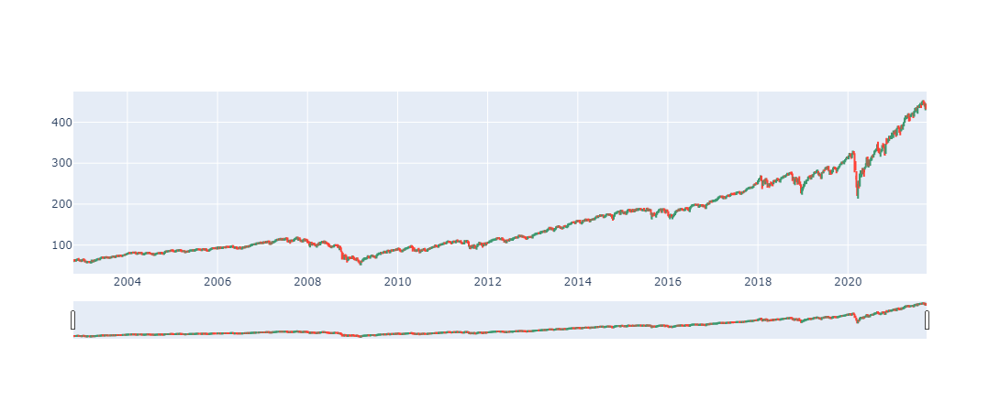

In [89]:
import plotly.graph_objects as go
fig = go.Figure(data=[go.Candlestick(x=df_stock_wk.index,
                open=df_stock_wk['Open'],
                high=df_stock_wk['High'],
                low=df_stock_wk['Low'],
                close=df_stock_wk['Close'])])
fig.update_traces(text=df_stock_wk['pattern'], selector=dict(type='candlestick'))
fig.show()

In [90]:
today = df_stock_wk['pattern'][-1]
for i in today:
    print(f'Todays pattern is {i}, {pattern_dict[i]}')

Todays pattern is Inside bar, trend change


In [91]:
#checks the momentum based on the EMA's stacking
#If smaller EMA's stack above the larger, the momentum is positive, vice versa, negative
def momentum_checker_wk(index):
    if (df_stock_wk['m_avg_08'][index] > df_stock_wk['m_avg_21'][index] > df_stock_wk['m_avg_34'][index] > df_stock_wk['m_avg_55'][index] > df_stock_wk['m_avg_89'][index]):
        print('Positive momentum')
    elif (df_stock_wk['m_avg_08'][index] < df_stock_wk['m_avg_21'][index] < df_stock_wk['m_avg_34'][index] < df_stock_wk['m_avg_55'][index] < df_stock_wk['m_avg_89'][index]):
        print('Negative momentum')
    else:
        print('neutral')

In [92]:
df_stock_wk['ADX_trend'] = 20

def ADX_trend_flag_wk(index):
    if (df_stock_wk['adx'][index] > df_stock_wk['ADX_trend'][index]) and (df_stock_wk['plus_di'][index] > df_stock_wk['minus_di'][index]):
        print('positive trend')
    elif (df_stock_wk['adx'][index] > df_stock_wk['ADX_trend'][index]) and (df_stock_wk['plus_di'][index] < df_stock_wk['minus_di'][index]):
        print('negative trend')
    elif (df_stock_wk['adx'][index] < df_stock_wk['ADX_trend'][index]):
        print('neutral or sideways trend')

In [93]:
def warning_wk(index):
    if (df_stock_wk['m_avg_08'][index] < df_stock_wk['m_avg_21'][index]):
        print('Warning, stock maybe heading down, consider puts on pullback to the 8 EMA, and hold off on long positions.  Watch ADX for negative trend. If this happens with any of the market indices such as SPY, QQQ, or DJI, hold of on long positions.  Watch the chart for the 8 crossing the 34.  This is especially bad with this weekly chart')
    if (df_stock_wk['m_avg_08'][index] < df_stock_wk['m_avg_34'][index]):
        print('As long as there is tension in the news, you can short or buy puts on any price moves back to the 8 or the 21 ema')
    elif (df_stock_wk['m_avg_08'][index] > df_stock_wk['m_avg_21'][index]):
        print('Continue as normal and watch for bearish candle patterns, especially when market is overbought and at the top bollinger')

In [94]:
def squeeze_momentum_wk(index):
    if (df_stock_wk['squeeze_on'][index] == 1.0):
        print('squeeze is on')
    else:
        print('squeeze is off')
    
    if (df_stock_wk['colors'][index] == 'cyan'):
        print('stock is in a mark up mode')
    elif (df_stock_wk['colors'][index] == 'blue'):
        print('stock is in a distribution mode')
    elif (df_stock_wk['colors'][index] == 'yellow'):
        print('stock is in an accumulation mode')
    elif (df_stock_wk['colors'][index] == 'red'):
        print('stock is in a mark down mode')

In [95]:
momentum_checker_wk(-1)

Positive momentum


In [96]:
ADX_trend_flag_wk(-1)

neutral or sideways trend


In [97]:
warning_wk(-1)

Continue as normal and watch for bearish candle patterns, especially when market is overbought and at the top bollinger


In [98]:
squeeze_momentum_wk(-1)

squeeze is off
stock is in a distribution mode


In [99]:
# To get the entry and exit signals for the algo trading using squeeze and momentum
df_stock_wk['value_threshold'] = abs(df_stock_wk['value'].min()*.10)
df_stock_wk['squeeze_threshold'] = 1.0
df_stock_wk["squeeze_entry"] = np.logical_and(np.greater(df_stock_wk["value"], df_stock_wk['value_threshold']), 
                                           np.equal(df_stock_wk['squeeze_on'], df_stock_wk['squeeze_threshold']))
df_stock_wk['squeeze_entry'] = df_stock_wk['squeeze_entry'].astype(float)
df_stock_wk['Entry/Exit'] = df_stock_wk['squeeze_entry'].diff()
df_stock_wk.dropna(inplace=True)

In [100]:
def implement_bb_strategy_wk(data, squeeze_on, squeeze_value, upper_kc, threshold, color, percent):
    buy_price = []
    sell_price = []
    squeeze_signal = []
    signal = 0.0
    buy_close = 0
    buy = False

    
    for close, squeeze, value, kc, thresh, color  in zip(data, squeeze_on, squeeze_value, upper_kc, threshold, color):
        if squeeze == 1.0 and value < thresh and (color == 'yellow' or color == 'cyan'):
            if signal != 1:
                buy_price.append(close)
                buy = True
                sell_price.append(np.nan)
                buy_close = close
                signal = 1.0
                squeeze_signal.append(signal)
            else:
                buy_price.append(np.nan)
                sell_price.append(np.nan)
                squeeze_signal.append(0)
        elif buy and close >= (buy_close*percent):
            if signal != -1:
                buy_price.append(np.nan)
                sell_price.append(close)
                signal = -1
                buy = False
                squeeze_signal.append(signal)
            else:
                buy_price.append(np.nan)
                sell_price.append(np.nan)
                squeeze_signal.append(0)
        else:
            buy_price.append(np.nan)
            sell_price.append(np.nan)
            squeeze_signal.append(0)
            
    return buy_price, sell_price, squeeze_signal


In [101]:
buy_price_wk, sell_price_wk, squeeze_signal_wk = implement_bb_strategy_wk(df_stock_wk["Close"], df_stock_wk['squeeze_on'], df_stock_wk['value'], 
                                                              df_stock_wk['upper_KC'], df_stock_wk['value_threshold'], df_stock_wk['colors'], 1.50)

In [102]:
df_stock_wk['buy_price'] =  buy_price_wk
df_stock_wk['sell_price'] = sell_price_wk
df_stock_wk['squeeze_signal'] = squeeze_signal_wk
df_stock_wk

,Open,High,Low,Close,Volume,Dividends,Stock Splits,Moving average weekly,upper_BB,lower_BB,m_avg_08,m_avg_21,m_avg_34,m_avg_55,m_avg_89,tr0,tr1,tr2,tr,upper_KC,lower_KC,atr,plus_di,minus_di,adx,squeeze_on,squeeze_off,value,pct_change,profitable?,colors,slow_K,fast_K,rsi_14,Overbought,Oversold,Bullish swing,Bearish swing,Bullish pinbar,Bearish pinbar,Inside bar,Outside bar,Bullish engulfing,Bearish engulfing,pattern,ADX_trend,value_threshold,squeeze_threshold,squeeze_entry,Entry/Exit,buy_price,sell_price,squeeze_signal
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2002-10-28,63.021722,63.118518,60.152383,62.413280,234112400.0,0.0,0,62.914089,70.022460,55.805719,60.840221,63.125052,65.399773,67.440042,68.889410,2.966135,0.753635,2.212501,2.966135,70.503370,55.324809,3.783818,17.637240,29.894463,39.553268,1,0,-3.341320,0.000776,1,yellow,64.303511,67.187805,53.371701,70,30,False,False,False,False,False,False,False,False,[No pattern],20,2.637926,1.0,0.0,0.0,62.41328,NaN,1.0
2002-11-04,63.471141,64.349225,61.894729,61.984615,240841900.0,0.0,0,62.825301,69.352904,56.297697,61.094531,63.020963,65.197972,67.218304,68.678757,2.454496,1.935945,0.518551,2.454496,70.169947,55.480654,3.606531,19.636538,29.090427,38.521146,1,0,-2.493896,-0.006868,0,yellow,66.017131,64.032070,51.855031,70,30,True,False,False,False,False,False,False,False,[Bullish swing],20,2.637926,1.0,0.0,0.0,NaN,NaN,0.0
2002-11-11,61.887792,63.298262,60.463491,63.194550,206170000.0,0.0,0,62.860563,68.732715,56.988411,61.561202,63.036800,65.079820,67.055559,68.512818,2.834771,1.313646,1.521124,2.834771,70.052375,55.668752,3.503608,18.749681,30.734692,37.160135,1,0,-1.481307,0.019520,1,yellow,68.053068,72.939330,55.683083,70,30,False,True,False,False,False,False,False,False,[Bearish swing],20,2.637926,1.0,0.0,0.0,NaN,NaN,0.0
2002-11-18,63.713125,65.178904,62.060664,64.591209,186071800.0,0.0,0,63.025794,68.193269,57.858319,62.234537,63.178576,65.051057,66.956356,68.395106,3.118240,1.984354,1.133886,3.118240,70.130471,55.921117,3.452216,21.593137,28.935732,36.172977,1,0,-0.216797,0.022101,1,yellow,73.397540,83.221220,59.669429,70,30,True,False,False,False,False,False,False,False,[Bullish swing],20,2.637926,1.0,0.0,0.0,NaN,NaN,0.0
2002-11-25,64.598103,65.649038,63.346659,64.978378,133280800.0,0.0,0,63.212171,68.569242,57.855099,62.844280,63.342684,65.046786,66.877091,68.293341,2.302379,1.057829,1.244551,2.302379,70.088902,56.335439,3.298879,21.993639,28.092147,34.595226,1,0,1.072347,0.005994,1,cyan,82.114995,90.184434,60.724121,70,30,False,False,False,False,False,False,False,False,[No pattern],20,2.637926,1.0,0.0,0.0,NaN,NaN,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-09-06,451.264290,451.363977,443.887927,444.017517,255671800.0,0.0,0,429.548194,454.982262,404.114127,442.495578,428.426623,414.074233,393.689219,368.488687,7.476049,0.269141,7.745190,7.745190,446.896032,412.200357,8.110553,29.694368,22.930252,21.796994,0,1,22.809683,-0.016862,0,blue,91.796976,78.846393,66.306034,70,30,False,True,False,False,False,False,False,False,[Bearish swing],20,2.637926,1.0,0.0,0.0,NaN,NaN,0.0
2021-09-13,447.207318,447.486422,439.611626,439.990417,436734800.0,0.0,0,430.542692,455.297327,405.788056,441.938875,429.477877,415.555158,395.342833,370.077614,7.874796,3.468905,4.405891,7.874796,447.745235,413.340149,8.079119,27.680625,25.155957,21.116974,0,1,20.941767,-0.009070,0,blue,81.794629,68.920656,62.619230,70,30,False,False,False,False,False,False,False,False,[No pattern],20,2.637926,1.0,0.0,0.0,NaN,NaN,0.0
2021-09-20,434.880005,444.890015,428.859985,443.910004,499743500.0,0.0,0,431.815769,456.520458,407.111080,442.376904,430.789888,417.175435,397.077375,371.718334,16.030029,4.899597,11.130432,16.030029,450.368995,413.262543,9.139240,22.721924,29.052568,19.987928,0,1,19.654285,0.008908,1,blue,74.965851,7

In [103]:
# Visualize exit position relative to close price
exit = df_stock_wk[df_stock_wk['squeeze_signal'] == -1.0]['Close'].hvplot.scatter(
    color='red',
    marker='v',
    size=200,
    legend=False,
    ylabel='Price in $',
    width=1000,
    height=400
)

# Visualize entry position relative to close price
entry = df_stock_wk[df_stock_wk['squeeze_signal'] == 1.0]['Close'].hvplot.scatter(
    color='green',
    marker='^',
    size=200,
    legend=False,
    ylabel='Price in $',
    width=1000,
    height=400
)

# Visualize close price for the investment
security_close = df_stock_wk[['Close']].hvplot(
    line_color='lightgray',
    ylabel='Price in $',
    width=1000,
    height=400
)

entry_exit_plot = security_close * entry * exit
entry_exit_plot


:Overlay
   .Curve.I          :Curve   [Date]   (Close)
   .Scatter.Close.I  :Scatter   [Date]   (Close)
   .Scatter.Close.II :Scatter   [Date]   (Close)

In [104]:
df_stock_wk

,Open,High,Low,Close,Volume,Dividends,Stock Splits,Moving average weekly,upper_BB,lower_BB,m_avg_08,m_avg_21,m_avg_34,m_avg_55,m_avg_89,tr0,tr1,tr2,tr,upper_KC,lower_KC,atr,plus_di,minus_di,adx,squeeze_on,squeeze_off,value,pct_change,profitable?,colors,slow_K,fast_K,rsi_14,Overbought,Oversold,Bullish swing,Bearish swing,Bullish pinbar,Bearish pinbar,Inside bar,Outside bar,Bullish engulfing,Bearish engulfing,pattern,ADX_trend,value_threshold,squeeze_threshold,squeeze_entry,Entry/Exit,buy_price,sell_price,squeeze_signal
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2002-10-28,63.021722,63.118518,60.152383,62.413280,234112400.0,0.0,0,62.914089,70.022460,55.805719,60.840221,63.125052,65.399773,67.440042,68.889410,2.966135,0.753635,2.212501,2.966135,70.503370,55.324809,3.783818,17.637240,29.894463,39.553268,1,0,-3.341320,0.000776,1,yellow,64.303511,67.187805,53.371701,70,30,False,False,False,False,False,False,False,False,[No pattern],20,2.637926,1.0,0.0,0.0,62.41328,NaN,1.0
2002-11-04,63.471141,64.349225,61.894729,61.984615,240841900.0,0.0,0,62.825301,69.352904,56.297697,61.094531,63.020963,65.197972,67.218304,68.678757,2.454496,1.935945,0.518551,2.454496,70.169947,55.480654,3.606531,19.636538,29.090427,38.521146,1,0,-2.493896,-0.006868,0,yellow,66.017131,64.032070,51.855031,70,30,True,False,False,False,False,False,False,False,[Bullish swing],20,2.637926,1.0,0.0,0.0,NaN,NaN,0.0
2002-11-11,61.887792,63.298262,60.463491,63.194550,206170000.0,0.0,0,62.860563,68.732715,56.988411,61.561202,63.036800,65.079820,67.055559,68.512818,2.834771,1.313646,1.521124,2.834771,70.052375,55.668752,3.503608,18.749681,30.734692,37.160135,1,0,-1.481307,0.019520,1,yellow,68.053068,72.939330,55.683083,70,30,False,True,False,False,False,False,False,False,[Bearish swing],20,2.637926,1.0,0.0,0.0,NaN,NaN,0.0
2002-11-18,63.713125,65.178904,62.060664,64.591209,186071800.0,0.0,0,63.025794,68.193269,57.858319,62.234537,63.178576,65.051057,66.956356,68.395106,3.118240,1.984354,1.133886,3.118240,70.130471,55.921117,3.452216,21.593137,28.935732,36.172977,1,0,-0.216797,0.022101,1,yellow,73.397540,83.221220,59.669429,70,30,True,False,False,False,False,False,False,False,[Bullish swing],20,2.637926,1.0,0.0,0.0,NaN,NaN,0.0
2002-11-25,64.598103,65.649038,63.346659,64.978378,133280800.0,0.0,0,63.212171,68.569242,57.855099,62.844280,63.342684,65.046786,66.877091,68.293341,2.302379,1.057829,1.244551,2.302379,70.088902,56.335439,3.298879,21.993639,28.092147,34.595226,1,0,1.072347,0.005994,1,cyan,82.114995,90.184434,60.724121,70,30,False,False,False,False,False,False,False,False,[No pattern],20,2.637926,1.0,0.0,0.0,NaN,NaN,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-09-06,451.264290,451.363977,443.887927,444.017517,255671800.0,0.0,0,429.548194,454.982262,404.114127,442.495578,428.426623,414.074233,393.689219,368.488687,7.476049,0.269141,7.745190,7.745190,446.896032,412.200357,8.110553,29.694368,22.930252,21.796994,0,1,22.809683,-0.016862,0,blue,91.796976,78.846393,66.306034,70,30,False,True,False,False,False,False,False,False,[Bearish swing],20,2.637926,1.0,0.0,0.0,NaN,NaN,0.0
2021-09-13,447.207318,447.486422,439.611626,439.990417,436734800.0,0.0,0,430.542692,455.297327,405.788056,441.938875,429.477877,415.555158,395.342833,370.077614,7.874796,3.468905,4.405891,7.874796,447.745235,413.340149,8.079119,27.680625,25.155957,21.116974,0,1,20.941767,-0.009070,0,blue,81.794629,68.920656,62.619230,70,30,False,False,False,False,False,False,False,False,[No pattern],20,2.637926,1.0,0.0,0.0,NaN,NaN,0.0
2021-09-20,434.880005,444.890015,428.859985,443.910004,499743500.0,0.0,0,431.815769,456.520458,407.111080,442.376904,430.789888,417.175435,397.077375,371.718334,16.030029,4.899597,11.130432,16.030029,450.368995,413.262543,9.139240,22.721924,29.052568,19.987928,0,1,19.654285,0.008908,1,blue,74.965851,7

In [105]:
position = []
#df_stock_wk = df_stock_wk.loc[~df_stock_wk.index.duplicated(keep='first')]
for i in range(len(squeeze_signal_wk)):
    if df_stock_wk['squeeze_signal'][i] < 1.0:
        position.append(0)
    else:
        position.append(1)

        
for i in range(len(df_stock_wk['Close'])):
    if df_stock_wk['squeeze_signal'][i] == 1.0:
        position[i] = 1.0
    elif df_stock_wk['squeeze_signal'][i] == -1.0:
        position[i] = 0
    else:
        position[i] = position[i-1]
        
#upper_bb = tsla['upper_bb']
#lower_bb = tsla['lower_bb']
close_price = df_stock_wk['Close']
squeeze_signal_wk = pd.DataFrame(squeeze_signal_wk).rename(columns = {0:'squeeze_signal'}).set_index(df_stock_wk.index)
position = pd.DataFrame(position).rename(columns = {0:'squeeze_position'}).set_index(df_stock_wk.index)

frames = [close_price, squeeze_signal_wk, position]
strategy = pd.concat(frames, join = 'inner', axis = 1)
strategy = strategy.reset_index()

strategy

,Date,Close,squeeze_signal,squeeze_position
0,2002-10-28,62.413280,1.0,1.0
1,2002-11-04,61.984615,0.0,1.0
2,2002-11-11,63.194550,0.0,1.0
3,2002-11-18,64.591209,0.0,1.0
4,2002-11-25,64.978378,0.0,1.0
...,...,...,...,...
984,2021-09-06,444.017517,0.0,0.0
985,2021-09-13,439.990417,0.0,0.0
986,2021-09-20,443.910004,0.0,0.0
987,2021-09-27,433.720001,0.0,0.0


In [106]:
stock_ret = pd.DataFrame(np.diff(df_stock_wk['Close'])).rename(columns = {0:'returns'})
squeeze_strategy_ret = []
return_sum = 0

for i in range(len(stock_ret)):
    try:
        returns = stock_ret['returns'][i]*strategy['squeeze_position'][i]
        squeeze_strategy_ret.append(returns)
    except:
        pass
    
squeeze_strategy_ret_df = pd.DataFrame(squeeze_strategy_ret).rename(columns = {0:'squeeze_returns'})

investment_value = 100000
number_of_stocks = math.floor(investment_value/df_stock_wk['Close'][-1])
squeeze_investment_ret = []

for i in range(len(squeeze_strategy_ret_df['squeeze_returns'])):
    #df_stock_wk['cumluative_return'] = np.exp(np.log1p(df_stock_wk['pct_change']).cumsum())
    returns = (number_of_stocks*squeeze_strategy_ret_df['squeeze_returns'][i])
    squeeze_investment_ret.append(returns)
    return_sum += returns
    new_investment_value = return_sum + investment_value
    number_of_stocks = math.floor(new_investment_value/df_stock_wk['Close'][i-1])
    
squeeze_investment_ret_df = pd.DataFrame(squeeze_investment_ret).rename(columns = {0:'investment_returns'})
total_investment_ret = round(sum(squeeze_investment_ret_df['investment_returns']), 2)
profit_percentage = math.floor((total_investment_ret/investment_value)*100)
print(f'Profit gained from the Squeeze strategy by investing $100k in {value} is {total_investment_ret}')
print(f'Profit percentage of the Squeeze strategy : {profit_percentage}%')
print(return_sum)

Profit gained from the Squeeze strategy by investing $100k in spy is 421676.33
Profit percentage of the Squeeze strategy : 421%
421676.32510757446


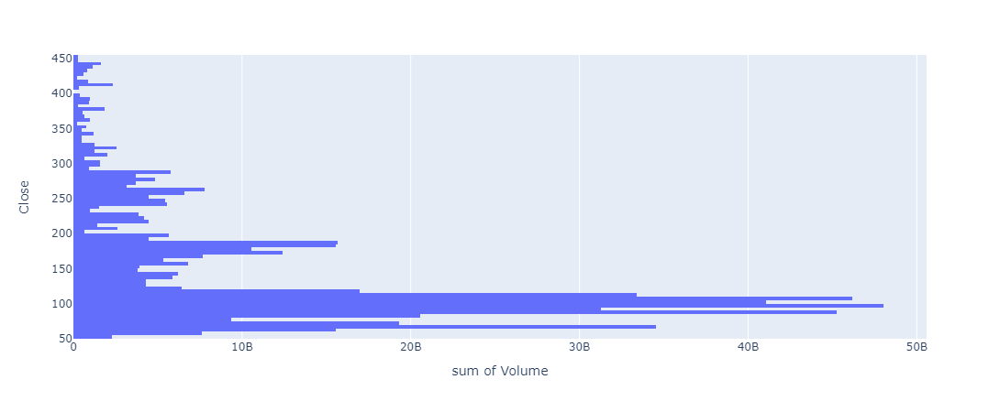

In [107]:
px.histogram(df_stock_wk, x='Volume', y='Close', nbins=150, orientation='h').show()

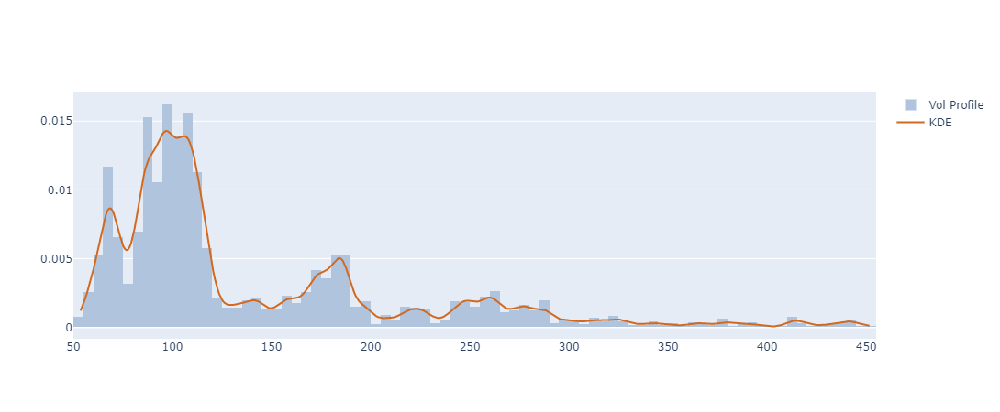

In [108]:
kde_factor = 0.05
num_samples = 500
close = df_stock_wk['Close']
volume = df_stock_wk['Volume']
kde = stats.gaussian_kde(close,weights=volume,bw_method=kde_factor)
xr = np.linspace(close.min(),close.max(),num_samples)
kdy = kde(xr)
ticks_per_sample = (xr.max() - xr.min()) / num_samples

def get_dist_plot(c, v, kx, ky):
    fig = go.Figure()
    fig.add_trace(go.Histogram(name='Vol Profile', x=c, y=v, nbinsx=150, 
                               histfunc='sum', histnorm='probability density',
                               marker_color='#B0C4DE'))
    fig.add_trace(go.Scatter(name='KDE', x=kx, y=ky, mode='lines', marker_color='#D2691E'))
    return fig

get_dist_plot(close, volume, xr, kdy).show()

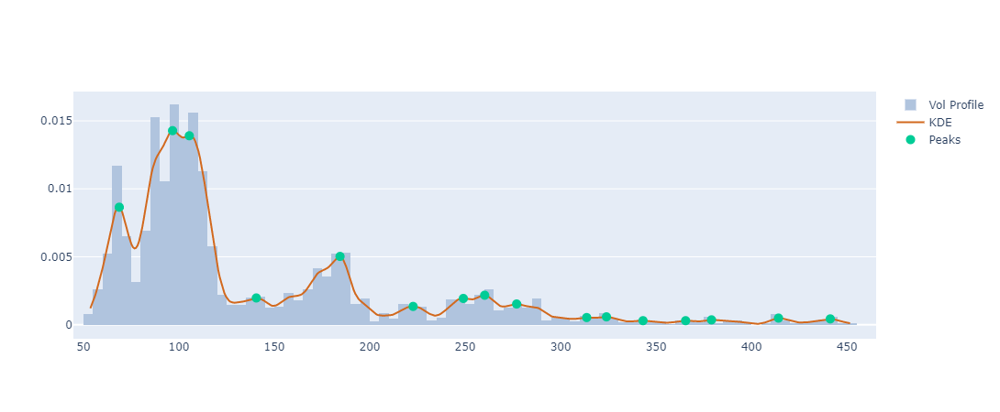

In [109]:
peaks,_ = signal.find_peaks(kdy)
pkx = xr[peaks]
pky = kdy[peaks]

pk_marker_args=dict(size=10)
rgs=dict(size=10)
fig = get_dist_plot(close, volume, xr, kdy)
fig.add_trace(go.Scatter(name="Peaks", x=pkx, y=pky, mode='markers', marker=pk_marker_args))

In [149]:
stock_df_mo = stock.history(period="10y", interval='1mo')
stock_df_mo.index.duplicated().sum()
df_stock_mo = stock_df_mo.loc[~stock_df_mo.index.duplicated(keep='first')]
df_stock_mo.dropna(inplace=True)
df_stock_mo

,Open,High,Low,Close,Volume,Dividends,Stock Splits
Date,,,,,,,
2011-10-01,92.622001,106.561823,88.455701,103.334175,5.721102e+09,0.0,0
2011-11-01,100.477035,105.409084,95.676729,102.914238,5.013586e+09,0.0,0
2011-12-01,102.798977,104.783325,98.830286,103.334175,3.848636e+09,0.0,0
2012-01-01,105.862177,110.535485,104.760135,108.812004,2.883821e+09,0.0,0
2012-02-01,109.615701,114.504458,109.483135,113.534996,2.894582e+09,0.0,0
2012-03-01,113.775331,117.520615,111.330958,116.675438,3.057516e+09,0.0,0
2012-04-01,117.045273,118.351885,112.983971,116.404449,3.035644e+09,0.0,0
2012-05-01,116.337845,117.894130,107.815788,109.413673,4.004156e+09,0.0,0
2012-06-01,107.699266,113.408385,105.810094,113.266907,3.644886e+09,0.0,0


In [150]:
# calculate Bollinger Bands on monthly data
# moving average
#m_avg = df_stock['Close'].rolling(window=length).mean()
m_avg_mo = df_stock_mo['Close'].ewm(span=length).mean()
df_stock_mo['Moving average monthly'] = m_avg_mo
# standard deviation
m_std_mo = df_stock_mo['Close'].rolling(window=length).std()
# upper Bollinger Bands
df_stock_mo['upper_BB'] = m_avg_mo + mult * m_std_mo
# lower Bollinger Bands 
df_stock_mo['lower_BB'] = m_avg_mo - mult * m_std_mo
df_stock_mo.head()
df_stock_mo.dropna(inplace=True)

In [151]:
df_stock_mo.isnull().sum()

Open                      0
High                      0
Low                       0
Close                     0
Volume                    0
Dividends                 0
Stock Splits              0
Moving average monthly    0
upper_BB                  0
lower_BB                  0
dtype: int64

In [152]:
#Stacked Moving averages monthly 
m_avg_08_mo = df_stock_mo['Close'].ewm(span=8).mean()
m_avg_21_mo = df_stock_mo['Close'].ewm(span=21).mean()
m_avg_34_mo = df_stock_mo['Close'].ewm(span=34).mean()
m_avg_55_mo = df_stock_mo['Close'].ewm(span=55).mean()
m_avg_89_mo = df_stock_mo['Close'].ewm(span=89).mean()

df_stock_mo['m_avg_08'] = m_avg_08_mo
df_stock_mo['m_avg_21'] = m_avg_21_mo
df_stock_mo['m_avg_34'] = m_avg_34_mo
df_stock_mo['m_avg_55'] = m_avg_55_mo
df_stock_mo['m_avg_89'] = m_avg_89_mo

In [153]:
# calculate Keltner Channel monthly
# first we need to calculate True Range
df_stock_mo['tr0'] = abs(df_stock_mo["High"] - df_stock_mo["Low"])
df_stock_mo['tr1'] = abs(df_stock_mo["High"] - df_stock_mo["Close"].shift())
df_stock_mo['tr2'] = abs(df_stock_mo["Low"] - df_stock_mo["Close"].shift())
df_stock_mo['tr'] = df_stock_mo[['tr0', 'tr1', 'tr2']].max(axis=1)
# moving average of the TR
range_ma_mo = df_stock_mo['tr'].ewm(span=length_KC).mean()
# upper Keltner Channel
df_stock_mo['upper_KC'] = m_avg_mo + range_ma_mo * mult_KC
# lower Keltner Channel
df_stock_mo['lower_KC'] = m_avg_mo - range_ma_mo * mult_KC
df_stock_mo.tail()

,Open,High,Low,Close,Volume,Dividends,Stock Splits,Moving average monthly,upper_BB,lower_BB,m_avg_08,m_avg_21,m_avg_34,m_avg_55,m_avg_89,tr0,tr1,tr2,tr,upper_KC,lower_KC
Date,,,,,,,,,,,,,,,,,,,,,
2021-06-01,419.846992,426.016967,412.027711,425.301605,1.282152e+09,0.0,0,351.081706,448.968552,253.194860,391.131886,348.660292,323.392036,297.878871,276.425334,13.989256,8.683654,5.305602,13.989256,401.083676,301.079735
2021-07-01,427.500420,440.389121,420.622461,437.109650,1.422044e+09,0.0,0,359.274904,464.895731,253.654077,401.349167,356.701784,329.909426,302.991027,280.428825,19.766660,15.087516,4.679144,19.766660,408.325103,310.224705
2021-08-01,438.933810,451.623169,434.707360,450.117981,1.253788e+09,0.0,0,367.926684,481.915861,253.937508,412.186681,365.194782,336.797660,308.387695,284.645318,16.915809,14.513519,2.402290,16.915809,415.593275,320.260093
2021-09-01,451.114762,452.599994,427.490435,432.334930,1.521814e+09,0.0,0,374.060840,491.703503,256.418177,416.664070,371.298835,342.271298,312.929736,288.305547,25.109559,2.482013,22.627546,25.109559,421.959495,326.162186
2021-09-29,435.190002,437.040009,433.850006,436.481903,5.329447e+07,0.0,0,380.005736,497.595908,262.415564,421.068033,377.224924,347.668115,317.453089,291.968458,3.190002,4.705078,1.515076,4.705078,424.405226,335.606246


In [154]:
#ADX Calculations monthly

plus_dm_mo = df_stock_mo["High"].diff()
minus_dm_mo = df_stock_mo["Low"].diff()
plus_dm_mo[plus_dm_mo < 0] = 0
minus_dm_mo[minus_dm_mo > 0] = 0

df_stock_mo['atr'] = df_stock_mo['tr'].ewm(span=14).mean()
df_stock_mo['plus_di'] = 100 * (plus_dm_mo.ewm(alpha = 1/14).mean() / df_stock_mo['atr'])
df_stock_mo['minus_di'] = abs(100 * (minus_dm_mo.ewm(alpha = 1/14).mean() / df_stock_mo['atr']))
dx_mo = (abs(df_stock_mo['plus_di'] - df_stock_mo['minus_di']) / abs(df_stock_mo['plus_di'] + df_stock_mo['minus_di'])) * 100
adx_mo = ((dx_mo.shift(1) * (14 - 1)) + dx_mo) / 14
df_stock_mo['adx'] = adx_mo.ewm(alpha = 1/14).mean()
df_stock_mo.dropna(inplace=True)
df_stock_mo.head()

,Open,High,Low,Close,Volume,Dividends,Stock Splits,Moving average monthly,upper_BB,lower_BB,m_avg_08,m_avg_21,m_avg_34,m_avg_55,m_avg_89,tr0,tr1,tr2,tr,upper_KC,lower_KC,atr,plus_di,minus_di,adx
Date,,,,,,,,,,,,,,,,,,,,,,,,,
2013-07-01,137.916674,145.271779,137.027226,144.288254,2.330904e+09,0.0,0,127.002632,149.197588,104.807676,140.409256,140.110705,140.044030,140.003631,139.978926,8.244554,8.795614,0.551060,8.795614,144.873830,109.131435,8.927527,23.563233,10.873920,95.489124
2013-08-01,145.382967,146.221102,139.447570,139.960709,2.283132e+09,0.0,0,128.373959,150.178309,106.569608,140.252048,140.067687,140.021327,139.992308,139.974217,6.773533,1.932849,4.840684,6.773533,145.005031,111.742886,8.268559,20.438998,7.533682,65.426469
2013-09-01,141.312012,148.470416,140.003490,143.689590,2.226750e+09,0.0,0,129.977796,152.347735,107.607856,141.319882,140.936277,140.843752,140.786503,140.751060,8.466926,8.509707,0.042781,8.509707,146.701999,113.253593,8.331474,22.153840,5.394973,58.890322
2013-10-01,144.501728,152.554425,141.399245,151.076233,2.901739e+09,0.0,0,132.166452,156.546700,107.786205,144.104386,143.052830,142.809485,142.661070,142.570031,11.155179,8.864834,2.290345,11.155179,150.056676,114.276229,8.984829,26.289574,3.848630,59.702349
2013-11-01,151.273884,156.198316,150.191015,155.553757,1.930953e+09,0.0,0,134.572104,161.457119,107.687089,147.177895,145.387157,144.966615,144.709778,144.552207,6.007302,5.122084,0.885218,6.007302,151.365159,117.779048,8.357401,31.315314,3.314218,63.212165


In [155]:
# check for 'squeeze' monthly
df_stock_mo['squeeze_on'] = (df_stock_mo['lower_BB'] > df_stock_mo['lower_KC']) & (df_stock_mo['upper_BB'] < df_stock_mo['upper_KC'])
df_stock_mo['squeeze_off'] = (df_stock_mo['lower_BB'] < df_stock_mo['lower_KC']) & (df_stock_mo['upper_BB'] > df_stock_mo['upper_KC'])
df_stock_mo.head()

,Open,High,Low,Close,Volume,Dividends,Stock Splits,Moving average monthly,upper_BB,lower_BB,m_avg_08,m_avg_21,m_avg_34,m_avg_55,m_avg_89,tr0,tr1,tr2,tr,upper_KC,lower_KC,atr,plus_di,minus_di,adx,squeeze_on,squeeze_off
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,
2013-07-01,137.916674,145.271779,137.027226,144.288254,2.330904e+09,0.0,0,127.002632,149.197588,104.807676,140.409256,140.110705,140.044030,140.003631,139.978926,8.244554,8.795614,0.551060,8.795614,144.873830,109.131435,8.927527,23.563233,10.873920,95.489124,False,True
2013-08-01,145.382967,146.221102,139.447570,139.960709,2.283132e+09,0.0,0,128.373959,150.178309,106.569608,140.252048,140.067687,140.021327,139.992308,139.974217,6.773533,1.932849,4.840684,6.773533,145.005031,111.742886,8.268559,20.438998,7.533682,65.426469,False,True
2013-09-01,141.312012,148.470416,140.003490,143.689590,2.226750e+09,0.0,0,129.977796,152.347735,107.607856,141.319882,140.936277,140.843752,140.786503,140.751060,8.466926,8.509707,0.042781,8.509707,146.701999,113.253593,8.331474,22.153840,5.394973,58.890322,False,True
2013-10-01,144.501728,152.554425,141.399245,151.076233,2.901739e+09,0.0,0,132.166452,156.546700,107.786205,144.104386,143.052830,142.809485,142.661070,142.570031,11.155179,8.864834,2.290345,11.155179,150.056676,114.276229,8.984829,26.289574,3.848630,59.702349,False,True
2013-11-01,151.273884,156.198316,150.191015,155.553757,1.930953e+09,0.0,0,134.572104,161.457119,107.687089,147.177895,145.387157,144.966615,144.709778,144.552207,6.007302,5.122084,0.885218,6.007302,151.365159,117.779048,8.357401,31.315314,3.314218,63.212165,False,True


In [156]:
# Momentum monthly
highest_mo = df_stock_mo['High'].rolling(window = length_KC).max()
lowest_mo = df_stock_mo['Low'].rolling(window = length_KC).min()
m1_mo = (highest_mo + lowest_mo) / 2
df_stock_mo['value'] = (df_stock_mo['Close'] - (m1_mo + m_avg_mo)/2)
fit_y_mo = np.array(range(0,length_KC))
df_stock_mo['value'] = df_stock_mo['value'].rolling(window = length_KC).apply(lambda x : np.polyfit(fit_y_mo, x, 1)[0] * (length_KC-1) +
   np.polyfit(fit_y_mo, x, 1)[1], raw=True)

df_stock_mo[['squeeze_on', 'squeeze_off']] = (df_stock_mo[['squeeze_on', 'squeeze_off']] == True).astype(float)

df_stock_mo["pct_change"] = df_stock_mo['Close'].pct_change()
df_stock_mo.dropna(inplace=True)
"""
conditions = [
    (df_stock['pct_change'] > 0) | (df_stock['squeeze_on'] == 1),
    (df_stock['pct_change'] < 0) | (df_stock['squeeze_on'] == 0)
]
"""
conditions_mo =  [
    (df_stock_mo['pct_change'] > 0),
    (df_stock_mo['pct_change'] < 0)
]

label = [1, 0]
df_stock_mo['profitable?'] = np.select(conditions_mo, label) 

df_stock_mo

,Open,High,Low,Close,Volume,Dividends,Stock Splits,Moving average monthly,upper_BB,lower_BB,m_avg_08,m_avg_21,m_avg_34,m_avg_55,m_avg_89,tr0,tr1,tr2,tr,upper_KC,lower_KC,atr,plus_di,minus_di,adx,squeeze_on,squeeze_off,value,pct_change,profitable?
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-11-01,194.419704,202.536898,190.265252,201.222076,2.073824e+09,0.0,0,186.691304,203.576998,169.805611,193.923988,187.058171,183.263459,180.096488,177.812626,12.271645,8.464128,3.807517,12.271645,206.288271,167.094338,9.530326,23.026138,19.765914,18.489167,1.0,0.0,10.895962,0.036838,1
2016-12-01,201.541671,208.490125,200.099021,204.098267,1.821910e+09,0.0,0,188.352144,206.976975,169.727313,196.184975,188.631006,184.550686,181.170494,178.742793,8.391104,7.268049,1.123056,8.391104,207.689303,169.014986,9.378150,26.385996,18.590065,17.728430,1.0,0.0,12.538190,0.014294,1
2017-01-01,206.688075,210.977251,205.622683,208.975021,1.482408e+09,0.0,0,190.319479,211.309246,169.329712,199.027242,190.506188,186.052713,182.403524,179.798716,5.354568,6.878984,1.524416,6.878984,209.142383,171.496575,9.044394,27.370042,17.844288,17.718881,0.0,1.0,14.848026,0.023894,1
2017-02-01,208.975054,217.957500,208.322962,217.186005,1.365137e+09,0.0,0,192.882028,217.249339,168.514717,203.062561,192.962258,187.959022,183.932800,181.088162,9.634537,8.982478,0.652059,9.634537,211.746005,174.018050,9.123189,30.790881,16.379917,18.017956,0.0,1.0,18.150597,0.039292,1
2017-03-01,218.949406,220.722023,212.722313,216.515518,1.921474e+09,0.0,0,195.135885,222.137055,168.134716,206.052129,195.128019,189.700434,185.353634,182.295206,7.999710,3.536018,4.463691,7.999710,213.736462,176.535309,8.973212,31.268809,15.423449,18.964119,0.0,1.0,20.395853,-0.003087,0
2017-04-01,217.512791,220.953511,214.477935,219.615967,1.549614e+09,0.0,0,197.470179,226.119731,168.820627,209.066333,197.377382,191.517746,186.836011,183.551870,6.475575,4.437993,2.037583,6.475575,215.551823,179.388535,8.639847,30.279580,14.838119,20.071626,0.0,1.0,23.041118,0.014320,1
2017-05-01,220.169403,223.305727,217.171453,222.715363,1.492547e+09,0.0,0,199.877148,229.070864,170.683432,212.099464,199.702623,193.406134,188.376715,184.855655,6.134274,3.689761,2.444514,6.134274,217.425330,182.328966,8.305470,31.265019,14.300599,21.130425,0.0,1.0,24.672644,0.014113,1
2017-06-01,223.204254,226.008483,221.350142,223.047440,1.572753e+09,0.0,0,202.086056,233.121943,171.050168,214.532356,201.843113,195.194263,189.854837,186.113172,4.658341,3.293121,1.365220,4.658341,218.879490,185.292622,7.818806,33.310556,14.076141,22.331852,0.0,1.0,25.262483,0.001491,1
2017-07-01,225.136282,229.882234,222.781836,228.742096,1.055909e+09,0.0,0,204.627030,237.951208,171.302852,217.690085,204.307560,197.211634,191.501331,187.501922,7.100398,6.834794,0.265604,7.100398,221.182930,188.071129,7.722953,34.927506,13.207266,23.695265,0.0,1.0,27.543396,0.025531,1


In [157]:
# entry point for long position:
# 1. black cross becomes gray (the squeeze is released)
long_cond1_mo = (df_stock_mo['squeeze_off'].iloc[-2] == 0) | (df_stock_mo['squeeze_off'][-1] == 1) 
# 2. bar value is positive => the bar is light green
long_cond2_mo = df_stock_mo['value'][-1] > 0

enter_long_mo = long_cond1_mo and long_cond2_mo
# entry point for short position:
# 1. black cross becomes gray (the squeeze is released)
short_cond1_mo = (df_stock_mo['squeeze_off'][-2] == 0) | (df_stock_mo['squeeze_off'][-1] == 1) 
# 2. bar value is negative => the bar is light red 
short_cond2_mo = df_stock_mo['value'][-1] < 0
enter_short_mo = short_cond1_mo and short_cond2_mo

In [158]:
ohcl_mo = df_stock_mo[['Open', 'High', 'Close', 'Low']]
ohcl_mo.head()

,Open,High,Close,Low
Date,,,,
2016-11-01,194.419704,202.536898,201.222076,190.265252
2016-12-01,201.541671,208.490125,204.098267,200.099021
2017-01-01,206.688075,210.977251,208.975021,205.622683
2017-02-01,208.975054,217.957500,217.186005,208.322962
2017-03-01,218.949406,220.722023,216.515518,212.722313


In [159]:
# add colors for the 'value bar'
colors = []
for ind, val in enumerate(df_stock_mo['value']):
  if val >= 0:
    color = 'blue'
    if val > df_stock_mo['value'][ind-1]:
      color = 'cyan'
  else:
    color = 'yellow'
    if val < df_stock_mo['value'][ind-1]:
      color='red'
  colors.append(color)

In [160]:
len(colors)

60

In [161]:
df_stock_mo['colors'] = colors

In [162]:
# add 2 subplots: 1. bars, 2. crosses
apds = [mpf.make_addplot(df_stock_mo['value'], panel=1, type='bar', color=colors, alpha=0.8, secondary_y=False),
        mpf.make_addplot([0] * len(df_stock_mo), panel=1, type='scatter', marker='o', markersize=50, color=['gray' if s else 'red' for s in df_stock_mo['squeeze_off']], secondary_y=False),
        mpf.make_addplot(df_stock_mo[['upper_BB']], color = 'red'),
        mpf.make_addplot(df_stock_mo[['lower_BB']], color = 'red'),
        mpf.make_addplot(df_stock_mo[['upper_KC']], color = 'blue'),
        mpf.make_addplot(df_stock_mo[['lower_KC']], color = 'blue'),
        mpf.make_addplot(df_stock_mo['Moving average monthly'], color = 'black'),
        mpf.make_addplot(df_stock_mo[['adx']], panel=2, color = 'purple', secondary_y=False),
        mpf.make_addplot(df_stock_mo[['plus_di']], panel=2, color = 'green', secondary_y=False),
        mpf.make_addplot(df_stock_mo[['minus_di']], panel=2, color = 'orange', secondary_y=False),
        mpf.make_addplot(df_stock_mo['m_avg_08'], panel=3, color='red', secondary_y=False),
        mpf.make_addplot(df_stock_mo['m_avg_21'], panel=3, color='orange', secondary_y=False),
        mpf.make_addplot(df_stock_mo['m_avg_34'], panel=3, color='yellow', secondary_y=False),
        mpf.make_addplot(df_stock_mo['m_avg_55'], panel=3, color='green', secondary_y=False),
        mpf.make_addplot(df_stock_mo['m_avg_89'], panel=3, color='blue', secondary_y=False)]

# plot ohcl with subplots
fig, axes = mpf.plot(ohcl_mo, 
              volume_panel = 2,
              figratio=(2,1),
              figscale=1,
              type='candle', 
              addplot=apds,
              returnfig=True)

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

In [163]:
def stochastics( dataframe, low, high, close, k, d ):
    """
    Fast stochastic calculation
    %K = (Current Close - Lowest Low)/
    (Highest High - Lowest Low) * 100
    %D = 3-day SMA of %K

    Slow stochastic calculation
    %K = %D of fast stochastic
    %D = 3-day SMA of %K

    When %K crosses above %D, buy signal 
    When the %K crosses below %D, sell signal
    """

    df = dataframe.copy()

    # Set minimum low and maximum high of the k stoch
    low_min  = df[low].rolling( window = k ).min()
    high_max = df[high].rolling( window = k ).max()

    # Fast Stochastic
    df['k_fast'] = 100 * (df[close] - low_min)/(high_max - low_min)
    df['d_fast'] = df['k_fast'].rolling(window = d).mean()

    # Slow Stochastic
    df['k_slow'] = df["d_fast"]
    df['d_slow'] = df['k_slow'].rolling(window = d).mean()

    return df


stochs_mo = stochastics( df_stock_mo, 'Low', 'High', 'Close', 14, 3 )
slow_k_mo = stochs_mo['k_slow'].values
fast_k_mo = stochs_mo['k_fast'].values
df_stock_mo["slow_K"] = slow_k_mo
df_stock_mo['fast_K'] = fast_k_mo
df_stock_mo

,Open,High,Low,Close,Volume,Dividends,Stock Splits,Moving average monthly,upper_BB,lower_BB,m_avg_08,m_avg_21,m_avg_34,m_avg_55,m_avg_89,tr0,tr1,tr2,tr,upper_KC,lower_KC,atr,plus_di,minus_di,adx,squeeze_on,squeeze_off,value,pct_change,profitable?,colors,slow_K,fast_K
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-11-01,194.419704,202.536898,190.265252,201.222076,2.073824e+09,0.0,0,186.691304,203.576998,169.805611,193.923988,187.058171,183.263459,180.096488,177.812626,12.271645,8.464128,3.807517,12.271645,206.288271,167.094338,9.530326,23.026138,19.765914,18.489167,1.0,0.0,10.895962,0.036838,1,blue,NaN,NaN
2016-12-01,201.541671,208.490125,200.099021,204.098267,1.821910e+09,0.0,0,188.352144,206.976975,169.727313,196.184975,188.631006,184.550686,181.170494,178.742793,8.391104,7.268049,1.123056,8.391104,207.689303,169.014986,9.378150,26.385996,18.590065,17.728430,1.0,0.0,12.538190,0.014294,1,cyan,NaN,NaN
2017-01-01,206.688075,210.977251,205.622683,208.975021,1.482408e+09,0.0,0,190.319479,211.309246,169.329712,199.027242,190.506188,186.052713,182.403524,179.798716,5.354568,6.878984,1.524416,6.878984,209.142383,171.496575,9.044394,27.370042,17.844288,17.718881,0.0,1.0,14.848026,0.023894,1,cyan,NaN,NaN
2017-02-01,208.975054,217.957500,208.322962,217.186005,1.365137e+09,0.0,0,192.882028,217.249339,168.514717,203.062561,192.962258,187.959022,183.932800,181.088162,9.634537,8.982478,0.652059,9.634537,211.746005,174.018050,9.123189,30.790881,16.379917,18.017956,0.0,1.0,18.150597,0.039292,1,cyan,NaN,NaN
2017-03-01,218.949406,220.722023,212.722313,216.515518,1.921474e+09,0.0,0,195.135885,222.137055,168.134716,206.052129,195.128019,189.700434,185.353634,182.295206,7.999710,3.536018,4.463691,7.999710,213.736462,176.535309,8.973212,31.268809,15.423449,18.964119,0.0,1.0,20.395853,-0.003087,0,cyan,NaN,NaN
2017-04-01,217.512791,220.953511,214.477935,219.615967,1.549614e+09,0.0,0,197.470179,226.119731,168.820627,209.066333,197.377382,191.517746,186.836011,183.551870,6.475575,4.437993,2.037583,6.475575,215.551823,179.388535,8.639847,30.279580,14.838119,20.071626,0.0,1.0,23.041118,0.014320,1,cyan,NaN,NaN
2017-05-01,220.169403,223.305727,217.171453,222.715363,1.492547e+09,0.0,0,199.877148,229.070864,170.683432,212.099464,199.702623,193.406134,188.376715,184.855655,6.134274,3.689761,2.444514,6.134274,217.425330,182.328966,8.305470,31.265019,14.300599,21.130425,0.0,1.0,24.672644,0.014113,1,cyan,NaN,NaN
2017-06-01,223.204254,226.008483,221.350142,223.047440,1.572753e+09,0.0,0,202.086056,233.121943,171.050168,214.532356,201.843113,195.194263,189.854837,186.113172,4.658341,3.293121,1.365220,4.658341,218.879490,185.292622,7.818806,33.310556,14.076141,22.331852,0.0,1.0,25.262483,0.001491,1,cyan,NaN,NaN
2017-07-01,225.136282,229.882234,222.781836,228.742096,1.055909e+09,0.0,0,204.627030,237.951208,171.302852,217.690085,204.307560,197.211634,191.501331,187.501922,7.100398,6.834794,0.265604,7.100398,221.182930,188.071129,7.722953,34.927506,13.207266,23.695265,0.0,1.0,27.543396,0.025531,1,cyan,NaN,NaN


In [164]:
def get_rsi(close, lookback):
    ret = close.diff()
    up = []
    down = []
    for i in range(len(ret)):
        if ret[i] < 0:
            up.append(0)
            down.append(ret[i])
        else:
            up.append(ret[i])
            down.append(0)
    up_series = pd.Series(up)
    down_series = pd.Series(down).abs()
    up_ewm = up_series.ewm(com = lookback - 1, adjust = False).mean()
    down_ewm = down_series.ewm(com = lookback - 1, adjust = False).mean()
    rs = up_ewm/down_ewm
    rsi = 100 - (100 / (1 + rs))
    rsi_df = pd.DataFrame(rsi).rename(columns = {0:'rsi'}).set_index(close.index)
    rsi_df = rsi_df.dropna()
    return rsi_df[3:]

df_stock_mo['rsi_14'] = get_rsi(df_stock_mo['Close'], 14)
df_stock_mo = df_stock_mo.dropna()
df_stock_mo['Overbought'] = 70
df_stock_mo['Oversold'] = 30
df_stock_mo

,Open,High,Low,Close,Volume,Dividends,Stock Splits,Moving average monthly,upper_BB,lower_BB,m_avg_08,m_avg_21,m_avg_34,m_avg_55,m_avg_89,tr0,tr1,tr2,tr,upper_KC,lower_KC,atr,plus_di,minus_di,adx,squeeze_on,squeeze_off,value,pct_change,profitable?,colors,slow_K,fast_K,rsi_14,Overbought,Oversold
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2018-02-01,263.167613,265.030853,236.810583,254.347595,2.923722e+09,0.0,0,226.044718,267.804268,184.285167,244.350350,225.191307,214.348021,205.399846,199.102227,28.220271,1.086151,27.134120,28.220271,247.638642,204.450793,11.769097,33.517220,13.457442,37.729175,0.0,1.0,35.738238,-0.036360,0,cyan,89.485928,77.648325,84.877256,70,30
2018-03-01,254.122876,262.549632,241.407821,246.388977,2.323562e+09,0.0,0,227.983055,269.354285,186.611825,244.803378,227.125355,216.237639,207.057690,200.533008,21.141811,8.202036,12.939774,21.141811,251.464681,204.501429,13.019062,28.105169,11.284458,38.089755,0.0,1.0,33.580793,-0.031290,0,blue,78.183893,63.390028,75.045864,70,30
2018-04-01,246.811751,255.037243,239.404117,248.654282,1.998466e+09,0.0,0,229.952469,270.583535,189.321403,245.659135,229.088979,218.145916,208.732180,201.977433,15.633125,8.648266,6.984860,15.633125,254.144120,205.760818,13.367669,25.392080,11.279472,38.402017,0.0,1.0,31.944209,0.009194,1,blue,68.534941,64.566470,75.901497,70,30
2018-05-01,248.052633,257.810421,243.521555,254.698837,1.606397e+09,0.0,0,232.310051,272.020198,192.599905,247.667958,231.424120,220.293981,210.574224,203.547698,14.288866,9.156139,5.132727,14.288866,256.901631,207.718472,13.490515,24.828075,10.368953,38.421352,0.0,1.0,31.044583,0.024309,1,blue,67.528020,74.627563,78.062948,70,30
2018-06-01,256.080685,262.726889,252.395653,255.018417,1.599001e+09,0.0,0,234.473405,271.834908,197.111903,249.301394,233.574894,222.331287,212.347528,205.069207,10.331236,8.028052,2.303184,10.331236,258.706821,210.239989,13.069219,26.494296,9.930278,38.636231,0.0,1.0,29.746933,0.001255,1,blue,71.037005,73.916983,78.174409,70,30
2018-07-01,254.492256,268.524207,254.237283,265.653595,1.266892e+09,0.0,0,237.443757,274.331679,200.555836,252.935217,236.498353,224.869158,214.465552,206.847076,14.286924,13.505789,0.781135,14.286924,262.072734,212.814781,13.231599,27.442380,9.100659,39.154410,0.0,1.0,29.671436,0.041704,1,blue,80.819799,93.914852,81.536484,70,30
2018-08-01,265.870751,275.483489,263.604491,274.133179,1.308444e+09,0.0,0,240.938851,278.232273,203.645428,257.645875,239.927393,227.750956,216.826851,208.807643,11.878997,9.829894,2.049104,11.878997,265.488469,216.389232,13.051233,29.660395,8.561155,39.976689,0.0,1.0,30.306434,0.031920,1,cyan,88.423219,97.437823,83.693339,70,30
2018-09-01,273.689417,277.560961,270.733823,274.520386,1.228103e+09,0.0,0,244.137806,281.528253,206.747360,261.395767,243.078637,230.483128,219.101248,210.709216,6.827137,3.427782,3.399355,6.827137,267.694915,220.580697,12.221278,30.617164,8.483770,41.081774,0.0,1.0,30.207358,0.001412,1,blue,95.219500,94.305824,83.786479,70,30
2018-10-01,277.081447,278.124860,246.481186,256.706573,3.024346e+09,0.0,0,245.335074,281.095524,209.574624,260.353724,244.319841,232.013097,220.578251,212.031392,31.643674,3.604474,28.039199,31.643674,272.510731,218.159417,14.811136,23.718395,18.287751,41.975576,0.0,1.0,26.819929,-0.064891,0,blue,83.268140,58.060774,65.305657,70,30


In [165]:
apds2 = [mpf.make_addplot(df_stock_mo['value'], panel=1, type='bar', color=colors, alpha=0.8, secondary_y=False),
         mpf.make_addplot([0] * len(df_stock_mo), panel=1, type='scatter', marker='o', markersize=50, color=['gray' if s else 'red' for s in df_stock_mo['squeeze_off']], secondary_y=False),
         mpf.make_addplot(df_stock_mo[['upper_BB']], color = 'red'),
         mpf.make_addplot(df_stock_mo[['lower_BB']], color = 'red'),
         mpf.make_addplot(df_stock_mo[['upper_KC']], color = 'blue'),
         mpf.make_addplot(df_stock_mo[['lower_KC']], color = 'blue'),
         mpf.make_addplot(df_stock_mo['Moving average monthly'], color = 'black'),
         mpf.make_addplot(df_stock_mo['m_avg_08'], color = 'green'),
         mpf.make_addplot(df_stock_mo['m_avg_34'], color = 'orange'),
         mpf.make_addplot(df_stock_mo['slow_K'], panel=2, color = 'red'),
         mpf.make_addplot(df_stock_mo['fast_K'], panel=2, color = 'blue'),
         mpf.make_addplot(df_stock_mo['Overbought'], panel=2, color = 'green'),
         mpf.make_addplot(df_stock_mo['Oversold'], panel=2, color = 'red'),
         mpf.make_addplot(df_stock_mo['Overbought'], panel=3, color = 'green'),
         mpf.make_addplot(df_stock_mo['Oversold'], panel=3, color = 'red'),
         mpf.make_addplot(df_stock_mo['rsi_14'], panel=3, color='purple')]
fig, axes = mpf.plot(df_stock_mo, 
              volume_panel = 2,
              figratio=(2,1),
              figscale=1,
              type='candle', 
              addplot=apds2,
              returnfig=True)

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

In [166]:
#checks the momentum based on the EMA's stacking
#If smaller EMA's stack above the larger, the momentum is positive, vice versa, negative
def momentum_checker_mo(index):
    if (df_stock_mo['m_avg_08'][index] > df_stock_mo['m_avg_21'][index] > df_stock_mo['m_avg_34'][index] > df_stock_mo['m_avg_55'][index] > df_stock_mo['m_avg_89'][index]):
        print('Positive momentum')
    elif (df_stock_mo['m_avg_08'][index] < df_stock_mo['m_avg_21'][index] < df_stock_mo['m_avg_34'][index] < df_stock_mo['m_avg_55'][index] < df_stock_mo['m_avg_89'][index]):
        print('Negative momentum')
    else:
        print('neutral')

In [167]:
df_stock_mo['ADX_trend'] = 20

def ADX_trend_flag_mo(index):
    if (df_stock_mo['adx'][index] > df_stock_mo['ADX_trend'][index]) and (df_stock_mo['plus_di'][index] > df_stock_mo['minus_di'][index]):
        print('positive trend')
    elif (df_stock_mo['adx'][index] > df_stock_mo['ADX_trend'][index]) and (df_stock_mo['plus_di'][index] < df_stock_mo['minus_di'][index]):
        print('negative trend')
    elif (df_stock_mo['adx'][index] < df_stock_mo['ADX_trend'][index]):
        print('neutral or sideways trend')

In [168]:
def warning_mo(index):
    if (df_stock_mo['m_avg_08'][index] < df_stock_mo['m_avg_21'][index]):
        print('Warning, stock maybe heading down, consider puts on pullback to the 8 EMA, and hold off on long positions.  Watch ADX for negative trend. If this happens with any of the market indices such as SPY, QQQ, or DJI, hold of on long positions.  Watch the chart for the 8 crossing the 34.  This is especially bad with this monthly chart')
    if (df_stock_mo['m_avg_08'][index] < df_stock_mo['m_avg_34'][index]):
        print('As long as there is tension in the news, you can short or buy puts on any price moves back to the 8 or the 21 ema')
    elif (df_stock_mo['m_avg_08'][index] > df_stock_mo['m_avg_21'][index]):
        print('Continue as normal and watch for bearish candle patterns, especially when market is overbought and at the top bollinger')

In [169]:
def squeeze_momentum_mo(index):
    if (df_stock_mo['squeeze_on'][index] == 1.0):
        print('squeeze is on')
    else:
        print('squeeze is off')
    
    if (df_stock_mo['colors'][index] == 'cyan'):
        print('stock is in a mark up mode')
    elif (df_stock_mo['colors'][index] == 'blue'):
        print('stock is in a distribution mode')
    elif (df_stock_mo['colors'][index] == 'yellow'):
        print('stock is in an accumulation mode')
    elif (df_stock_mo['colors'][index] == 'red'):
        print('stock is in a mark down mode')

In [170]:
momentum_checker_mo(-1)

Positive momentum


In [171]:
ADX_trend_flag_mo(-1)

positive trend


In [172]:
warning_mo(-1)

Continue as normal and watch for bearish candle patterns, especially when market is overbought and at the top bollinger


In [173]:
squeeze_momentum_mo(-1)

squeeze is off
stock is in a mark up mode


In [174]:
# To get the entry and exit signals for the algo trading using squeeze and momentum
df_stock_mo['value_threshold'] = abs(df_stock_mo['value'].max()*.15)
df_stock_mo['squeeze_threshold'] = 1.0
df_stock_mo["squeeze_entry"] = np.logical_and(np.greater(df_stock_mo["value"], df_stock_mo['value_threshold']), 
                                           np.equal(df_stock_mo['squeeze_on'], df_stock_mo['squeeze_threshold']))
df_stock_mo['squeeze_entry'] = df_stock_mo['squeeze_entry'].astype(float)
df_stock_mo['Entry/Exit'] = df_stock_mo['squeeze_entry'].diff()
df_stock_mo.dropna(inplace=True)

In [175]:
def implement_bb_strategy_mo(data, squeeze_on, squeeze_value, upper_kc, threshold, color, percent):
    buy_price = []
    sell_price = []
    squeeze_signal = []
    signal = 0.0
    buy_close = 0
    buy = False

    
    for close, squeeze, value, kc, thresh, color  in zip(data, squeeze_on, squeeze_value, upper_kc, threshold, color):
        if squeeze == 1.0 and value < thresh and (color == 'yellow' or color == 'cyan'):
            if signal != 1:
                buy_price.append(close)
                buy = True
                sell_price.append(np.nan)
                buy_close = close
                signal = 1.0
                squeeze_signal.append(signal)
            else:
                buy_price.append(np.nan)
                sell_price.append(np.nan)
                squeeze_signal.append(0)
        elif buy and close >= (buy_close*percent):
            if signal != -1:
                buy_price.append(np.nan)
                sell_price.append(close)
                signal = -1
                buy = False
                squeeze_signal.append(signal)
            else:
                buy_price.append(np.nan)
                sell_price.append(np.nan)
                squeeze_signal.append(0)
        else:
            buy_price.append(np.nan)
            sell_price.append(np.nan)
            squeeze_signal.append(0)
            
    return buy_price, sell_price, squeeze_signal

In [176]:
buy_price_mo, sell_price_mo, squeeze_signal_mo = implement_bb_strategy_mo(df_stock_mo["Close"], df_stock_mo['squeeze_on'], df_stock_mo['value'], 
                                                              df_stock_mo['upper_KC'], df_stock_mo['value_threshold'], df_stock_mo['colors'], 1.50)

In [177]:
df_stock_mo['buy_price'] =  buy_price_mo
df_stock_mo['sell_price'] = sell_price_mo
df_stock_mo['squeeze_signal'] = squeeze_signal_mo
df_stock_mo

,Open,High,Low,Close,Volume,Dividends,Stock Splits,Moving average monthly,upper_BB,lower_BB,m_avg_08,m_avg_21,m_avg_34,m_avg_55,m_avg_89,tr0,tr1,tr2,tr,upper_KC,lower_KC,atr,plus_di,minus_di,adx,squeeze_on,squeeze_off,value,pct_change,profitable?,colors,slow_K,fast_K,rsi_14,Overbought,Oversold,ADX_trend,value_threshold,squeeze_threshold,squeeze_entry,Entry/Exit,buy_price,sell_price,squeeze_signal
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2018-03-01,254.122876,262.549632,241.407821,246.388977,2.323562e+09,0.0,0,227.983055,269.354285,186.611825,244.803378,227.125355,216.237639,207.057690,200.533008,21.141811,8.202036,12.939774,21.141811,251.464681,204.501429,13.019062,28.105169,11.284458,38.089755,0.0,1.0,33.580793,-0.031290,0,blue,78.183893,63.390028,75.045864,70,30,20,15.704902,1.0,0.0,0.0,NaN,NaN,0.0
2018-04-01,246.811751,255.037243,239.404117,248.654282,1.998466e+09,0.0,0,229.952469,270.583535,189.321403,245.659135,229.088979,218.145916,208.732180,201.977433,15.633125,8.648266,6.984860,15.633125,254.144120,205.760818,13.367669,25.392080,11.279472,38.402017,0.0,1.0,31.944209,0.009194,1,blue,68.534941,64.566470,75.901497,70,30,20,15.704902,1.0,0.0,0.0,NaN,NaN,0.0
2018-05-01,248.052633,257.810421,243.521555,254.698837,1.606397e+09,0.0,0,232.310051,272.020198,192.599905,247.667958,231.424120,220.293981,210.574224,203.547698,14.288866,9.156139,5.132727,14.288866,256.901631,207.718472,13.490515,24.828075,10.368953,38.421352,0.0,1.0,31.044583,0.024309,1,blue,67.528020,74.627563,78.062948,70,30,20,15.704902,1.0,0.0,0.0,NaN,NaN,0.0
2018-06-01,256.080685,262.726889,252.395653,255.018417,1.599001e+09,0.0,0,234.473405,271.834908,197.111903,249.301394,233.574894,222.331287,212.347528,205.069207,10.331236,8.028052,2.303184,10.331236,258.706821,210.239989,13.069219,26.494296,9.930278,38.636231,0.0,1.0,29.746933,0.001255,1,blue,71.037005,73.916983,78.174409,70,30,20,15.704902,1.0,0.0,0.0,NaN,NaN,0.0
2018-07-01,254.492256,268.524207,254.237283,265.653595,1.266892e+09,0.0,0,237.443757,274.331679,200.555836,252.935217,236.498353,224.869158,214.465552,206.847076,14.286924,13.505789,0.781135,14.286924,262.072734,212.814781,13.231599,27.442380,9.100659,39.154410,0.0,1.0,29.671436,0.041704,1,blue,80.819799,93.914852,81.536484,70,30,20,15.704902,1.0,0.0,0.0,NaN,NaN,0.0
2018-08-01,265.870751,275.483489,263.604491,274.133179,1.308444e+09,0.0,0,240.938851,278.232273,203.645428,257.645875,239.927393,227.750956,216.826851,208.807643,11.878997,9.829894,2.049104,11.878997,265.488469,216.389232,13.051233,29.660395,8.561155,39.976689,0.0,1.0,30.306434,0.031920,1,cyan,88.423219,97.437823,83.693339,70,30,20,15.704902,1.0,0.0,0.0,NaN,NaN,0.0
2018-09-01,273.689417,277.560961,270.733823,274.520386,1.228103e+09,0.0,0,244.137806,281.528253,206.747360,261.395767,243.078637,230.483128,219.101248,210.709216,6.827137,3.427782,3.399355,6.827137,267.694915,220.580697,12.221278,30.617164,8.483770,41.081774,0.0,1.0,30.207358,0.001412,1,blue,95.219500,94.305824,83.786479,70,30,20,15.704902,1.0,0.0,0.0,NaN,NaN,0.0
2018-10-01,277.081447,278.124860,246.481186,256.706573,3.024346e+09,0.0,0,245.335074,281.095524,209.574624,260.353724,244.319841,232.013097,220.578251,212.031392,31.643674,3.604474,28.039199,31.643674,272.510731,218.159417,14.811136,23.718395,18.287751,41.975576,0.0,1.0,26.819929,-0.064891,0,blue,83.268140,58.060774,65.305657,70,30,20,15.704902,1.0,0.0,0.0,NaN,NaN,0.0
2018-11-01,257.626729,266.751795,249.535582,261.468353,2.021061e+09,0.0,0,246.871857,280.664339,213.079375,260.601419,245.881429,233.729559,222.178567,213.443230,17.216213,10.045221,7.170992,17.216213,274.708334,219.035380,15.131835,21.544897,16.611905,39.883840,0.0,1.0,24.544997,0.018550,1,blue,71.514238,62.176114,67.377073,70,30,20,15.704902,1.0,0.0,0.0,NaN,NaN,0.0


In [178]:
# Visualize exit position relative to close price
exit = df_stock_mo[df_stock_mo['squeeze_signal'] == -1.0]['Close'].hvplot.scatter(
    color='red',
    marker='v',
    size=200,
    legend=False,
    ylabel='Price in $',
    width=1000,
    height=400
)

# Visualize entry position relative to close price
entry = df_stock_mo[df_stock_mo['squeeze_signal'] == 1.0]['Close'].hvplot.scatter(
    color='green',
    marker='^',
    size=200,
    legend=False,
    ylabel='Price in $',
    width=1000,
    height=400
)

# Visualize close price for the investment
security_close = df_stock_mo[['Close']].hvplot(
    line_color='lightgray',
    ylabel='Price in $',
    width=1000,
    height=400
)

entry_exit_plot = security_close * entry * exit
entry_exit_plot

:Overlay
   .Curve.I          :Curve   [Date]   (Close)
   .Scatter.Close.I  :Scatter   [Date]   (Close)
   .Scatter.Close.II :Scatter   [Date]   (Close)

In [181]:
position = []
#df_stock_wk = df_stock_wk.loc[~df_stock_wk.index.duplicated(keep='first')]
for i in range(len(squeeze_signal_mo)):
    if df_stock_mo['squeeze_signal'][i] < 1.0:
        position.append(0)
    else:
        position.append(1)

        
for i in range(len(df_stock_mo['Close'])):
    if df_stock_mo['squeeze_signal'][i] == 1.0:
        position[i] = 1.0
    elif df_stock_mo['squeeze_signal'][i] == -1.0:
        position[i] = 0
    else:
        position[i] = position[i-1]
        
#upper_bb = tsla['upper_bb']
#lower_bb = tsla['lower_bb']
close_price = df_stock_mo['Close']
squeeze_signal_mo = pd.DataFrame(squeeze_signal_mo).rename(columns = {0:'squeeze_signal'}).set_index(df_stock_mo.index)
position = pd.DataFrame(position).rename(columns = {0:'squeeze_position'}).set_index(df_stock_mo.index)

frames = [close_price, squeeze_signal_mo, position]
strategy = pd.concat(frames, join = 'inner', axis = 1)
strategy = strategy.reset_index()

strategy

,Date,Close,squeeze_signal,squeeze_position
0,2018-03-01,246.388977,0.0,0.0
1,2018-04-01,248.654282,0.0,0.0
2,2018-05-01,254.698837,0.0,0.0
3,2018-06-01,255.018417,0.0,0.0
4,2018-07-01,265.653595,0.0,0.0
5,2018-08-01,274.133179,0.0,0.0
6,2018-09-01,274.520386,0.0,0.0
7,2018-10-01,256.706573,0.0,0.0
8,2018-11-01,261.468353,0.0,0.0
9,2018-12-01,237.062103,0.0,0.0


In [182]:
stock_ret = pd.DataFrame(np.diff(df_stock_mo['Close'])).rename(columns = {0:'returns'})
squeeze_strategy_ret = []
return_sum = 0

for i in range(len(stock_ret)):
    try:
        returns = stock_ret['returns'][i]*strategy['squeeze_position'][i]
        squeeze_strategy_ret.append(returns)
    except:
        pass
    
squeeze_strategy_ret_df = pd.DataFrame(squeeze_strategy_ret).rename(columns = {0:'squeeze_returns'})

investment_value = 100000
number_of_stocks = math.floor(investment_value/df_stock_mo['Close'][-1])
squeeze_investment_ret = []

for i in range(len(squeeze_strategy_ret_df['squeeze_returns'])):
    #df_stock_wk['cumluative_return'] = np.exp(np.log1p(df_stock_wk['pct_change']).cumsum())
    returns = (number_of_stocks*squeeze_strategy_ret_df['squeeze_returns'][i])
    squeeze_investment_ret.append(returns)
    return_sum += returns
    new_investment_value = return_sum + investment_value
    number_of_stocks = math.floor(new_investment_value/df_stock_mo['Close'][i-1])
    
squeeze_investment_ret_df = pd.DataFrame(squeeze_investment_ret).rename(columns = {0:'investment_returns'})
total_investment_ret = round(sum(squeeze_investment_ret_df['investment_returns']), 2)
profit_percentage = math.floor((total_investment_ret/investment_value)*100)
print(f'Profit gained from the Squeeze strategy by investing $100k in {value} is {total_investment_ret}')
print(f'Profit percentage of the Squeeze strategy : {profit_percentage}%')
print(return_sum)

Profit gained from the Squeeze strategy by investing $100k in spy is 49101.1
Profit percentage of the Squeeze strategy : 49%
49101.095138549805


In [ ]:
px.histogram(df_stock_wk, x='Volume', y='Close', nbins=150, orientation='h').show()

In [ ]:
kde_factor = 0.05
num_samples = 500
close = df_stock_wk['Close']
volume = df_stock_wk['Volume']
kde = stats.gaussian_kde(close,weights=volume,bw_method=kde_factor)
xr = np.linspace(close.min(),close.max(),num_samples)
kdy = kde(xr)
ticks_per_sample = (xr.max() - xr.min()) / num_samples

def get_dist_plot(c, v, kx, ky):
    fig = go.Figure()
    fig.add_trace(go.Histogram(name='Vol Profile', x=c, y=v, nbinsx=150, 
                               histfunc='sum', histnorm='probability density',
                               marker_color='#B0C4DE'))
    fig.add_trace(go.Scatter(name='KDE', x=kx, y=ky, mode='lines', marker_color='#D2691E'))
    return fig

get_dist_plot(close, volume, xr, kdy).show()

In [ ]:
peaks,_ = signal.find_peaks(kdy)
pkx = xr[peaks]
pky = kdy[peaks]

pk_marker_args=dict(size=10)
rgs=dict(size=10)
fig = get_dist_plot(close, volume, xr, kdy)
fig.add_trace(go.Scatter(name="Peaks", x=pkx, y=pky, mode='markers', marker=pk_marker_args))

In [ ]:
 # Create our features
X = df_stock.copy()
X.drop(columns=['profitable?',"squeeze_off","tr0","tr1","tr2","tr","Dividends","Stock Splits",'plus_di','minus_di'], axis=1, inplace=True)

# Create our target
y = df_stock[['profitable?']]

y.value_counts()

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, 
                                                    y, 
                                                    random_state=1, stratify=y)
X_train.shape

In [ ]:
y_train

In [ ]:
from sklearn.metrics import balanced_accuracy_score
from sklearn.metrics import confusion_matrix
from imblearn.metrics import classification_report_imbalanced

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

In [ ]:
# Fit the Standard Scaler with the training data
# When fitting scaling functions, only train on the training dataset
X_scaler = scaler.fit(X_train)

In [ ]:
# Scale the training and testing data
X_trained_scaled = X_scaler.transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

In [ ]:
# Resample the training data with the BalancedRandomForestClassifier
from sklearn.ensemble import RandomForestClassifier
rf_model = RandomForestClassifier(n_estimators = 100, random_state = 1)
rf_model = rf_model.fit(X_trained_scaled, y_train)
predictions = rf_model.predict(X_test_scaled)

In [ ]:
# Calculated the balanced accuracy score
balanced_accuracy_score(y_test, predictions)

In [ ]:
# Display the confusion matrix
cm = confusion_matrix(y_test, predictions)
cm

In [ ]:
# Print the imbalanced classification report
print(classification_report_imbalanced(y_test, predictions))

In [ ]:
# List the features sorted in descending order by feature importance
importances = rf_model.feature_importances_
listed = sorted(zip(rf_model.feature_importances_, X.columns), reverse = True)
listed

In [ ]:
# Train the Classifier
from imblearn.ensemble import EasyEnsembleClassifier
eec_model = EasyEnsembleClassifier(n_estimators = 100, random_state = 1)
eec_model = eec_model.fit(X_trained_scaled, y_train)
predictions = eec_model.predict(X_test_scaled)

In [ ]:
# Calculated the balanced accuracy score
balanced_accuracy_score(y_test, predictions)

In [ ]:
# Display the confusion matrix
cm = confusion_matrix(y_test, predictions)
cm

In [ ]:
# Print the imbalanced classification report
print(classification_report_imbalanced(y_test, predictions))

In [ ]:
#Add other classifier models

# HW LSTM Model

In [ ]:
# Set the random seed for reproducibility
# Note: This is for the homework solution, but it is good practice to comment this out and run multiple experiments to evaluate your model
from numpy.random import seed
seed(1)
from tensorflow import random
random.set_seed(2)

In [ ]:
df = df_stock[['Volume','squeeze_on', 'adx', 'Close']]
df.head()

In [ ]:
# This function accepts the column number for the features (X) and the target (y)
# It chunks the data up with a rolling window of Xt-n to predict Xt
# It returns a numpy array of X any y
def window_data(df, window, feature_col_number, target_col_number):
    X = []
    y = []
    for i in range(len(df) - window - 1):
        features = df.iloc[i:(i + window), feature_col_number]
        target = df.iloc[(i + window), target_col_number]
        X.append(features)
        y.append(target)
    return np.array(X), np.array(y).reshape(-1, 1)

In [ ]:
# Predict Closing Prices using a 10 day window of previous closing prices
# Then, experiment with window sizes anywhere from 1 to 10 and see how the model performance changes
window_size = 10

# Column index 0 is the 'fng_value' column
# Column index 1 is the `Close` column
feature_column = 3
target_column = 3
X, y = window_data(df, window_size, feature_column, target_column)

In [ ]:
# Use 70% of the data for training and the remaineder for testing
split = int(0.7 * len(X))

X_train = X[: split]
X_test = X[split:]

y_train = y[: split]
y_test = y[split:]

In [ ]:
from sklearn.preprocessing import MinMaxScaler
# Use the MinMaxScaler to scale data between 0 and 1.
x_train_scaler = MinMaxScaler()
x_test_scaler = MinMaxScaler()
y_train_scaler = MinMaxScaler()
y_test_scaler = MinMaxScaler()

# Fit the scaler for the Training Data
x_train_scaler.fit(X_train)
y_train_scaler.fit(y_train)

# Scale the training data
X_train = x_train_scaler.transform(X_train)
y_train = y_train_scaler.transform(y_train)

# Fit the scaler for the Testing Data
x_test_scaler.fit(X_test)
y_test_scaler.fit(y_test)

# Scale the y_test data
X_test = x_test_scaler.transform(X_test)
y_test = y_test_scaler.transform(y_test)

In [ ]:
# Reshape the features for the model
X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout

In [ ]:
# Build the LSTM model. 
# The return sequences need to be set to True if you are adding additional LSTM layers, but 
# You don't have to do this for the final layer. 
# Note: The dropouts help prevent overfitting
# Note: The input shape is the number of time steps and the number of indicators
# Note: Batching inputs has a different input shape of Samples/TimeSteps/Features

# Define the LSTM RNN model.
model = Sequential()

# Initial model setup
number_units = 5
dropout_fraction = 0

# Layer 1
model.add(LSTM(
    units=number_units,
    return_sequences=True,
    input_shape=(X_train.shape[1], 1))
    )
model.add(Dropout(dropout_fraction))

# Layer 2
model.add(LSTM(units=number_units, return_sequences=True))
model.add(Dropout(dropout_fraction))

# Layer 3
model.add(LSTM(units=number_units))
model.add(Dropout(dropout_fraction))

# Output layer
model.add(Dense(1))

In [ ]:
# Compile the model
model.compile(optimizer="adam", loss="mean_squared_error")

In [ ]:
# Summarize the model
model.summary()

In [ ]:
# Train the model
# Use at least 10 epochs
# Do not shuffle the data
# Experiement with the batch size, but a smaller batch size is recommended
model.fit(X_train, y_train, epochs=10, shuffle=False, batch_size=1, verbose=1)

In [ ]:
# Evaluate the model
model.evaluate(X_test, y_test, verbose=1)

In [ ]:
# Make some predictions
predicted = model.predict(X_test)

In [ ]:
# Recover the original prices instead of the scaled version
predicted_profit = y_test_scaler.inverse_transform(predicted)
real_profit = y_test_scaler.inverse_transform(y_test.reshape(-1, 1))

In [ ]:
# Create a DataFrame of Real and Predicted values
stocks = pd.DataFrame({
    "Real": real_profit.ravel(),
    "Predicted": predicted_profit.ravel()
}, index = df_stock.index[-len(real_profit): ]) 
stocks.head()

In [ ]:
# Plot the real vs predicted values as a line chart
stocks.plot(figsize = (10,5), title="Actual Vs. Predicted TDOC Closing Prices")

Linear Regression Model

In [ ]:
df_stock['Lagged_Close'] = df_stock['Close'].shift()
df_stock = df_stock.dropna()
df_stock.head()

In [ ]:
# to_period("w") splits the series into weekly increments
df_stock.index.to_period("w")

In [ ]:
# construct a list of all Pandas weekly periods that are in the dataset:
weeks = df_stock.index.to_period("w").unique()
weeks

In [ ]:
# Training Window (26 weeks)
training_window = 26

In [ ]:
# Beginning of training window
start_of_training_period = weeks[0].start_time.strftime(format="%Y-%m-%d")
start_of_training_period

In [ ]:
# End of training window
end_of_training_period = weeks[training_window + 0].end_time.strftime(format="%Y-%m-%d")
end_of_training_period

In [ ]:
# The week of the first test window
test_week = weeks[training_window + 0 + 1]
test_week

In [ ]:
# The first day of the test week
start_of_test_week  = test_week.start_time.strftime(format="%Y-%m-%d")
start_of_test_week

In [ ]:
# The last day of the test week
end_of_test_week = test_week.end_time.strftime(format="%Y-%m-%d")
end_of_test_week

In [ ]:
# Training data with just one window
train = df_stock[start_of_training_period:end_of_training_period]
train

In [ ]:
# Testing data with just one window
test = df_stock[start_of_test_week:end_of_test_week]
test

In [ ]:
# Set the training window as 26 weeks
# Total timeframe is 287 weeks
training_window = 26
timeframe = len(weeks) - training_window - 1
timeframe

In [ ]:
# Construct an empty placeholder DataFrame, with a column named "Out-of-Sample Predictions"
# (Each iteration of the loop, we'll append that week"s predictions to this DataFrame)
all_predictions = pd.DataFrame(columns=["Out-of-Sample Predictions"])
all_predictions

In [ ]:
# Construct a separate empty DataFrame for actual data
all_actuals = pd.DataFrame(columns=["Actual Prices"])
all_actuals

In [ ]:
from sklearn.linear_model import LinearRegression
for i in range(0, timeframe):
    
    # Beginning of training window
    start_of_training_period = weeks[i].start_time.strftime(format="%Y-%m-%d")
    
    # End of training window
    end_of_training_period = weeks[training_window + i].end_time.strftime(format="%Y-%m-%d")

    # Window of test-window data
    test_week = weeks[training_window+i+1]
    
    # String of testing window
    start_of_test_week  = test_week.start_time.strftime(format="%Y-%m-%d")
    end_of_test_week = test_week.end_time.strftime(format="%Y-%m-%d")
    
    train = df_stock[start_of_training_period:end_of_training_period]
    test = df_stock[start_of_test_week:end_of_test_week]
    
    # Create new DataFrames:
    X_train = train["Lagged_Close"].to_frame()
    y_train = train["Close"]
    X_test = test["Lagged_Close"].to_frame()
    y_test = test["Close"]

    model = LinearRegression()
    model.fit(X_train, y_train)
    predictions = model.predict(X_test)
    # Create a temporary DataFrame to hold predictions
    predictions = pd.DataFrame(predictions, index=X_test.index, columns=["Out-of-Sample Predictions"])
    # Create a temporary DataFrame of the actual "y"s in the test DataFrame, with column name="Actual Returns": 
    actuals = pd.DataFrame(y_test, index=y_test.index)
    actuals.columns = ["Actual Prices"]  
    # Append these two DataFrames (predictions and actuals) to the two master DataFrames built outside the loop
    all_predictions = all_predictions.append(predictions)
    all_actuals = all_actuals.append(actuals)

In [ ]:
# Once the loop is done, concatenate (combine) the two DataFrames to a final "Results" DataFrame:    
Results = pd.concat([all_actuals, all_predictions], axis=1)
Results.head()

In [ ]:
# Plot the first 20 predictions vs the true values
Results[:20].plot()

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score

mse = mean_squared_error(
    Results["Actual Prices"],
    Results["Out-of-Sample Predictions"]
)

# Using that mean-squared-error, calculate the root-mean-squared error (RMSE):
out_of_sample_rmse = np.sqrt(mse)
print(f"Out-of-Sample Root Mean Squared Error (RMSE): {out_of_sample_rmse}")

# Multifeature LSTM Model

In [ ]:
#multi feature LSTM
from math import sqrt
from numpy import concatenate
from matplotlib import pyplot
from pandas import DataFrame
from pandas import concat
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import mean_squared_error
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM

In [ ]:
# convert series to supervised learning
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):
	n_vars = 1 if type(data) is list else data.shape[1]
	df = DataFrame(data)
	cols, names = list(), list()
	# input sequence (t-n, ... t-1)
	for i in range(n_in, 0, -1):
		cols.append(df.shift(i))
		names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
	# forecast sequence (t, t+1, ... t+n)
	for i in range(0, n_out):
		cols.append(df.shift(-i))
		if i == 0:
			names += [('var%d(t)' % (j+1)) for j in range(n_vars)]
		else:
			names += [('var%d(t+%d)' % (j+1, i)) for j in range(n_vars)]
	# put it all together
	agg = concat(cols, axis=1)
	agg.columns = names
	# drop rows with NaN values
	if dropnan:
		agg.dropna(inplace=True)
	return agg

In [ ]:
# load dataset
values = df_stock.values
# integer encode direction
encoder = LabelEncoder()
values[:,4] = encoder.fit_transform(values[:,4])
# ensure all data is float
values = values.astype('float32')
# normalize features
scaler = MinMaxScaler(feature_range=(0, 1))
scaled = scaler.fit_transform(values)
# frame as supervised learning
reframed = series_to_supervised(scaled, 1, 1)
# drop columns we don't want to predict
reframed.drop(reframed.columns[[0,1,2,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,10,21,22,23,24,25,26,27,28,29]], axis=1, inplace=True)
print(reframed.head())

In [ ]:
# split into train and test sets
values = reframed.values
n_train_days = 252
train = values[:n_train_days, :]
test = values[n_train_days:, :]
# split into input and outputs
train_X, train_y = train[:, :-1], train[:, -1]
test_X, test_y = test[:, :-1], test[:, -1]
# reshape input to be 3D [samples, timesteps, features]
train_X = train_X.reshape((train_X.shape[0],1, train_X.shape[1]))
test_X = test_X.reshape((test_X.shape[0],1, test_X.shape[1]))
print(train_X.shape, train_y.shape, test_X.shape, test_y.shape)

In [ ]:
# design network
model = Sequential()
model.add(LSTM(5, input_shape=(train_X.shape[1], train_X.shape[2])))
model.add(Dropout(0.3))
model.add(Dense(1))
#model.add(Dropout(0.3))
model.compile(loss='mae', optimizer='adam', metrics=['accuracy'])
# fit network
history = model.fit(train_X, train_y, epochs=60, batch_size=20, validation_data=(test_X, test_y), verbose=2, shuffle=False)

In [ ]:
number_units = 50
dropout_fraction = 0.2
# design network
model = Sequential()
model.add(LSTM(units=number_units, input_shape=(train_X.shape[1], train_X.shape[2])))
model.add(Dropout(dropout_fraction))
# Layer 2
model.add(LSTM(units=number_units))
model.add(Dropout(dropout_fraction))
# Layer 3
model.add(LSTM(units=number_units))
model.add(Dropout(dropout_fraction))
# Output layer
model.add(Dense(1))
model.compile(loss='mae', optimizer='adam', metrics=['accuracy'])
# fit network
history = model.fit(train_X, train_y, epochs=1000, batch_size=1, validation_data=(test_X, test_y), verbose=2, shuffle=False)

In [ ]:
# plot history
fig = pyplot.figure()
pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='test')
pyplot.legend()
pyplot.show()

In [ ]:
# make a prediction
yhat = model.predict(test_X)
test_X = test_X.reshape((test_X.shape[0], test_X.shape[2]))
#self.synaptic_weights = self.synaptic_weights + adjustment
# invert scaling for forecast
inv_yhat = concatenate((yhat, test_X[:, :]), axis=1)
inv_yhat = scaler.inverse_transform(inv_yhat.reshape(764,16))
inv_yhat = inv_yhat[:,0]
# invert scaling for actual
test_y = test_y.reshape((len(test_y), 1))
inv_y = concatenate((test_y, test_X[:, :]), axis=1)
inv_y = scaler.inverse_transform(inv_y.reshape(764,16))
inv_y = inv_y[:,0]
# calculate RMSE
rmse = sqrt(mean_squared_error(inv_y, inv_yhat))
print('Test RMSE: %.3f' % rmse)

In [ ]:
screened_list = []
stock_list = ['AAPL','TSLA','MSFT','AMZN']

for stock_code in stock_list:
    df = yf.download(stock_code, start='2020-01-01', threads= False)
    if enter_long | enter_short:
        screened_list.append(stock_code)
    
if screened_list:
  print(screened_list)
else:
  print('No stock fits the indicator entry requirement')

In [ ]:
help(mpf.plot)

In [ ]:
tickers = ['NFLX', 'AAPL', 'FB', 'GOOG', 'AMZN', 'PYPL', 'TSLA', 'SQ']

ticker_dict_1mo = {}
ticker_dict_1wk = {}
ticker_dict_1d = {}
for stock in tickers:
    ticker_dict_1mo[stock] = yf.Ticker(stock).history(period="10y", interval='1mo')
    ticker_dict_1mo[stock]["ticker"] = stock
    ticker_dict_1wk[stock] = yf.Ticker(stock).history(period="10y", interval='1wk')
    ticker_dict_1wk[stock]['ticker'] = stock
    ticker_dict_1d[stock] = yf.Ticker(stock).history(period="10y", interval='1d')
    ticker_dict_1d[stock]['ticker'] = stock
    
ticker_dict_1mo['AAPL']

daily_data = pd.concat(ticker_dict_1d.values())
weekly_data = pd.concat(ticker_dict_1wk.values())
monthly_data = pd.concat(ticker_dict_1mo.values())
daily_data

In [ ]:
# calculate Bollinger Bands
m_avg_mo = {}
m_avg_wk = {}
m_avg_d = {}
m_std_mo = {}
m_std_wk = {}
m_std_d = {}

for stock in tickers:
    # moving average
    m_avg_mo[stock] = ticker_dict_1mo[stock]['Close'].rolling(window=length).mean()
    m_avg_wk[stock] = ticker_dict_1wk[stock]['Close'].rolling(window=length).mean()
    m_avg_d[stock] = ticker_dict_1d[stock]['Close'].rolling(window=length).mean()
    # standard deviation
    m_std_mo[stock] = ticker_dict_1mo[stock]['Close'].rolling(window=length).std(ddof=0)
    m_std_wk[stock] = ticker_dict_1wk[stock]['Close'].rolling(window=length).std(ddof=0)
    m_std_d[stock] = ticker_dict_1d[stock]['Close'].rolling(window=length).std(ddof=0)
    # upper Bollinger Bands
    ticker_dict_1mo[stock]['upper_BB'] = m_avg_mo[stock] + mult * m_std_mo[stock]
    ticker_dict_1wk[stock]['upper_BB'] = m_avg_wk[stock] + mult * m_std_wk[stock]
    ticker_dict_1d[stock]['upper_BB'] = m_avg_d[stock] + mult * m_std_d[stock]
# lower Bollinger Bands 
    ticker_dict_1mo[stock]['lower_BB'] = m_avg_mo[stock] - mult * m_std_mo[stock]
    ticker_dict_1wk[stock]['lower_BB'] = m_avg_wk[stock] - mult * m_std_wk[stock]
    ticker_dict_1d[stock]['lower_BB'] = m_avg_d[stock] - mult * m_std_d[stock]
    
ticker_dict_1d[stock]

In [ ]:
# calculate Keltner Channel
range_ma_mo = {}
range_ma_wk = {}
range_ma_d = {}

for stock in tickers:
    # first we need to calculate True Range (monthly)
    ticker_dict_1mo[stock]['tr0'] = abs(ticker_dict_1mo[stock]["High"] - ticker_dict_1mo[stock]["Low"])
    ticker_dict_1mo[stock]['tr1'] = abs(ticker_dict_1mo[stock]["High"] - ticker_dict_1mo[stock]["Close"].shift())
    ticker_dict_1mo[stock]['tr2'] = abs(ticker_dict_1mo[stock]["Low"] - ticker_dict_1mo[stock]["Close"].shift())
    ticker_dict_1mo[stock]['tr'] = ticker_dict_1mo[stock][['tr0', 'tr1', 'tr2']].max(axis=1)
    
    # first we need to calculate True Range (weekly)
    ticker_dict_1wk[stock]['tr0'] = abs(ticker_dict_1wk[stock]["High"] - ticker_dict_1wk[stock]["Low"])
    ticker_dict_1wk[stock]['tr1'] = abs(ticker_dict_1wk[stock]["High"] - ticker_dict_1wk[stock]["Close"].shift())
    ticker_dict_1wk[stock]['tr2'] = abs(ticker_dict_1wk[stock]["Low"] - ticker_dict_1wk[stock]["Close"].shift())
    ticker_dict_1wk[stock]['tr'] = ticker_dict_1wk[stock][['tr0', 'tr1', 'tr2']].max(axis=1)
    
    # first we need to calculate True Range (daily)
    ticker_dict_1d[stock]['tr0'] = abs(ticker_dict_1d[stock]["High"] - ticker_dict_1d[stock]["Low"])
    ticker_dict_1d[stock]['tr1'] = abs(ticker_dict_1d[stock]["High"] - ticker_dict_1d[stock]["Close"].shift())
    ticker_dict_1d[stock]['tr2'] = abs(ticker_dict_1d[stock]["Low"] - ticker_dict_1d[stock]["Close"].shift())
    ticker_dict_1d[stock]['tr'] = ticker_dict_1d[stock][['tr0', 'tr1', 'tr2']].max(axis=1)

    # moving average of the TR
    range_ma_mo[stock] = ticker_dict_1mo[stock]['tr'].rolling(window=length_KC).mean()
    range_ma_wk[stock] = ticker_dict_1wk[stock]['tr'].rolling(window=length_KC).mean()
    range_ma_d[stock] = ticker_dict_1d[stock]['tr'].rolling(window=length_KC).mean()
    
    # upper Keltner Channel
    ticker_dict_1mo[stock]['upper_KC'] = m_avg_mo[stock] + range_ma_mo[stock] * mult_KC
    ticker_dict_1wk[stock]['upper_KC'] = m_avg_wk[stock] + range_ma_wk[stock] * mult_KC
    ticker_dict_1d[stock]['upper_KC'] = m_avg_d[stock] + range_ma_d[stock] * mult_KC
    
    # lower Keltner Channel
    ticker_dict_1mo[stock]['lower_KC'] = m_avg_mo[stock] - range_ma_mo[stock] * mult_KC
    ticker_dict_1wk[stock]['lower_KC'] = m_avg_wk[stock] - range_ma_wk[stock] * mult_KC
    ticker_dict_1d[stock]['lower_KC'] = m_avg_d[stock] - range_ma_d[stock] * mult_KC

ticker_dict_1d[stock]

In [ ]:
# check for 'squeeze'
for stock in tickers:
    #monthly
    ticker_dict_1mo[stock]['squeeze_on'] = (ticker_dict_1mo[stock]['lower_BB'] > ticker_dict_1mo[stock]['lower_KC']) | (ticker_dict_1mo[stock]['upper_BB'] < ticker_dict_1mo[stock]['upper_KC'])
    ticker_dict_1mo[stock]['squeeze_off'] = (ticker_dict_1mo[stock]['lower_BB'] < ticker_dict_1mo[stock]['lower_KC']) | (ticker_dict_1mo[stock]['upper_BB'] > ticker_dict_1mo[stock]['upper_KC'])
    
    #weekly
    ticker_dict_1wk[stock]['squeeze_on'] = (ticker_dict_1wk[stock]['lower_BB'] > ticker_dict_1wk[stock]['lower_KC']) | (ticker_dict_1wk[stock]['upper_BB'] < ticker_dict_1wk[stock]['upper_KC'])
    ticker_dict_1wk[stock]['squeeze_off'] = (ticker_dict_1wk[stock]['lower_BB'] < ticker_dict_1wk[stock]['lower_KC']) | (ticker_dict_1wk[stock]['upper_BB'] > ticker_dict_1wk[stock]['upper_KC'])
    
    #daily
    ticker_dict_1d[stock]['squeeze_on'] = (ticker_dict_1d[stock]['lower_BB'] > ticker_dict_1d[stock]['lower_KC']) | (ticker_dict_1d[stock]['upper_BB'] < ticker_dict_1d[stock]['upper_KC'])
    ticker_dict_1d[stock]['squeeze_off'] = (ticker_dict_1d[stock]['lower_BB'] < ticker_dict_1d[stock]['lower_KC']) | (ticker_dict_1d[stock]['upper_BB'] > ticker_dict_1d[stock]['upper_KC'])
    
ticker_dict_1d[stock]

In [ ]:
# Momentum
highest_mo = {}
highest_wk = {}
highest_d = {}
lowest_mo = {}
lowest_wk = {}
lowest_d = {}
m1_mo = {}
m1_wk = {}
m1_d = {}
fit_y_mo = {}
fit_y_wk = {}
fit_y_d = {}


for stock in tickers:
    #monthly
    highest_mo[stock] = ticker_dict_1mo[stock]['High'].rolling(window = length_KC).max()
    lowest_mo[stock] = ticker_dict_1mo[stock]['Low'].rolling(window = length_KC).min()
    m1_mo[stock] = (highest_mo[stock] + lowest_mo[stock]) / 2
    ticker_dict_1mo[stock]['value'] = (ticker_dict_1mo[stock]['Close'] - (m1_mo[stock] + m_avg_mo[stock])/2)
    fit_y_mo[stock] = np.array(range(0,length_KC))
    ticker_dict_1mo[stock]['value'] = ticker_dict_1mo[stock]['value'].rolling(window = length_KC).apply(lambda x : np.polyfit(fit_y_mo[stock], x, 1)[0] * (length_KC-1) +
    np.polyfit(fit_y_mo[stock], x, 1)[1], raw=True)
    
    #weekly
    highest_wk[stock] = ticker_dict_1wk[stock]['High'].rolling(window = length_KC).max()
    lowest_wk[stock] = ticker_dict_1wk[stock]['Low'].rolling(window = length_KC).min()
    m1_wk[stock] = (highest_wk[stock] + lowest_wk[stock]) / 2
    ticker_dict_1wk[stock]['value'] = (ticker_dict_1wk[stock]['Close'] - (m1_wk[stock] + m_avg_wk[stock])/2)
    fit_y_wk[stock] = np.array(range(0,length_KC))
    ticker_dict_1wk[stock]['value'] = ticker_dict_1wk[stock]['value'].rolling(window = length_KC).apply(lambda x : np.polyfit(fit_y_wk[stock], x, 1)[0] * (length_KC-1) +
    np.polyfit(fit_y_wk[stock], x, 1)[1], raw=True)
    
    #daily
    highest_d[stock] = ticker_dict_1d[stock]['High'].rolling(window = length_KC).max()
    lowest_d[stock] = ticker_dict_1d[stock]['Low'].rolling(window = length_KC).min()
    m1_d[stock] = (highest_d[stock] + lowest_d[stock]) / 2
    ticker_dict_1d[stock]['value'] = (ticker_dict_1d[stock]['Close'] - (m1_d[stock] + m_avg_d[stock])/2)
    fit_y_d[stock] = np.array(range(0,length_KC))
    ticker_dict_1d[stock]['value'] = ticker_dict_1d[stock]['value'].rolling(window = length_KC).apply(lambda x : np.polyfit(fit_y_d[stock], x, 1)[0] * (length_KC-1) +
    np.polyfit(fit_y_d[stock], x, 1)[1], raw=True)
    
ticker_dict_1d[stock]

In [ ]:
long_cond1_mo = {}
long_cond2_mo = {}
enter_long_mo = {}
short_cond1_mo = {}
short_cond2_mo = {}
enter_short_mo = {}
long_cond1_wk = {}
long_cond2_wk = {}
enter_long_wk = {}
short_cond1_wk = {}
short_cond2_wk = {}
enter_short_wk = {}
long_cond1_d = {}
long_cond2_d = {}
enter_long_d = {}
short_cond1_d = {}
short_cond2_d = {}
enter_short_d = {}

for stock in tickers:
    #monthly
    # entry point for long position:
    # 1. black cross becomes gray (the squeeze is released)
    long_cond1_mo[stock] = (ticker_dict_1mo[stock]['squeeze_off'][-2] == False) | (ticker_dict_1mo[stock]['squeeze_off'][-1] == True) 
    # 2. bar value is positive => the bar is light green
    long_cond2_mo[stock] = ticker_dict_1mo[stock]['value'][-1] > 0

    enter_long_mo[stock] = long_cond1_mo[stock] and long_cond2_mo[stock]
    # entry point for short position:
    # 1. black cross becomes gray (the squeeze is released)
    short_cond1_mo[stock] = (ticker_dict_1mo[stock]['squeeze_off'][-2] == False) | (ticker_dict_1mo[stock]['squeeze_off'][-1] == True) 
    # 2. bar value is negative => the bar is light red 
    short_cond2_mo[stock] = ticker_dict_1mo[stock]['value'][-1] < 0
    enter_short_mo[stock] = short_cond1_mo[stock] and short_cond2_mo[stock]
    
    #weekly
    # entry point for long position:
    # 1. black cross becomes gray (the squeeze is released)
    long_cond1_wk[stock] = (ticker_dict_1wk[stock]['squeeze_off'][-2] == False) | (ticker_dict_1wk[stock]['squeeze_off'][-1] == True) 
    # 2. bar value is positive => the bar is light green
    long_cond2_wk[stock] = ticker_dict_1wk[stock]['value'][-1] > 0

    enter_long_wk[stock] = long_cond1_wk[stock] and long_cond2_wk[stock]
    # entry point for short position:
    # 1. black cross becomes gray (the squeeze is released)
    short_cond1_wk[stock] = (ticker_dict_1wk[stock]['squeeze_off'][-2] == False) | (ticker_dict_1wk[stock]['squeeze_off'][-1] == True) 
    # 2. bar value is negative => the bar is light red 
    short_cond2_wk[stock] = ticker_dict_1wk[stock]['value'][-1] < 0
    enter_short_wk[stock] = short_cond1_wk[stock] and short_cond2_wk[stock]
    
    #daily
    # entry point for long position:
    # 1. black cross becomes gray (the squeeze is released)
    long_cond1_d[stock] = (ticker_dict_1d[stock]['squeeze_off'][-2] == False) | (ticker_dict_1d[stock]['squeeze_off'][-1] == True) 
    # 2. bar value is positive => the bar is light green
    long_cond2_d[stock] = ticker_dict_1d[stock]['value'][-1] > 0

    enter_long_d[stock] = long_cond1_d[stock] and long_cond2_d[stock]
    # entry point for short position:
    # 1. black cross becomes gray (the squeeze is released)
    short_cond1_d[stock] = (ticker_dict_1d[stock]['squeeze_off'][-2] == False) | (ticker_dict_1d[stock]['squeeze_off'][-1] == True) 
    # 2. bar value is negative => the bar is light red 
    short_cond2_d[stock] = ticker_dict_1d[stock]['value'][-1] < 0
    enter_short_d[stock] = short_cond1_d[stock] and short_cond2_d[stock]

In [ ]:
ohcl_mo = {}
ohcl_wk = {}
ohcl_d = {}

for stock in tickers:
    ohcl_mo[stock] = ticker_dict_1mo[stock][['Open', 'High', 'Close', 'Low']]
    ohcl_wk[stock] = ticker_dict_1wk[stock][['Open', 'High', 'Close', 'Low']]
    ohcl_d[stock] = ticker_dict_1d[stock][['Open', 'High', 'Close', 'Low']]
    
ohcl_d[stock]

In [ ]:
ind_mo = {}
val_mo = {}
ind_wk = {}
val_wk = {}
ind_d = {}
val_d = {}

for stock in tickers:
    # add colors for the 'value bar'
    colors_d = []
    for ind_d[stock], val_d[stock] in enumerate(ticker_dict_1d[stock]['value']):
        if val_d[stock] >= 0:
            color_d = 'blue'
        if val_d[stock] > ticker_dict_1d[stock]['value'][ind_d[stock]-1]:
            color_d = 'cyan'
        else:
            color_d = 'yellow'
        if val_d[stock] < ticker_dict_1d[stock]['value'][ind_d[stock]-1]:
            color_d='red'
        colors_d.append(color)
        
    #colors_mo = []
    #for ind_mo[stock], val_mo[stock] in enumerate(ticker_dict_1mo[stock]['value']):
       # if val_mo[stock] >= 0:
            #color_mo = 'green'
        #if val_mo[stock] > ticker_dict_1mo[stock]['value'][ind_mo[stock]-1]:
           # color_mo = 'lime'
       # else:
            #color_mo = 'maroon'
        #if val_mo[stock] < ticker_dict_1mo[stock]['value'][ind_mo[stock]-1]:
           # color_mo='red'
      #  colors_mo.append(color)
        
        

In [ ]:
import panel as pn
from panel.interact import interact

pn.extension()

def figure_stock_d(stock):
    apds = [mpf.make_addplot(ticker_dict_1d[stock]['value'], panel=1, type='bar', color=colors_d, alpha=0.8, secondary_y=False),
            mpf.make_addplot([0] * len(ticker_dict_1d[stock]), panel=1, type='scatter', marker='o', markersize=50, color=['gray' if s else 'red' for s in ticker_dict_1d[stock]['squeeze_off']], secondary_y=False),
            mpf.make_addplot(ticker_dict_1d[stock][['upper_BB']], color = 'red'),
            mpf.make_addplot(ticker_dict_1d[stock][['lower_BB']], color = 'red'),
            mpf.make_addplot(ticker_dict_1d[stock][['upper_KC']], color = 'blue'),
            mpf.make_addplot(ticker_dict_1d[stock][['lower_KC']], color = 'blue')]

    # plot ohcl with subplots
    fig, axes = mpf.plot(ohcl_d[stock], 
              volume_panel = 2,
              figratio=(2,1),
              figscale=1,
              mav = (8,21,34),
              type='candle', 
              addplot=apds,
              returnfig=True)
    return pn.pane.Matplotlib(fig, tight=True)

ticker = daily_data["ticker"].unique()
interact(figure_stock_d, stock=ticker)